In [1]:
import numpy as np
import pandas as pd
import pygeostat as gs
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import subprocess as sp
%pylab inline --no-import-all
from subprocess import check_output
import tensorflow as tf
from tensorflow.python import debug as tf_debug
import os
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from sklearn.cluster import KMeans
from sklearn import preprocessing
import scipy.spatial as scs
import scipy as sc
import math
from scipy.spatial import distance
from sklearn.metrics import mean_squared_error
import time
from sklearn.metrics import r2_score
from random import randrange

Populating the interactive namespace from numpy and matplotlib


C:\ProgramData\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
plt_extent = 'Sensitivity_5'

In [3]:
griddef = gs.GridDef(gridfl='griddef.txt')
griddef

Pygeostat GridDef:
50 5.0 10.0 
50 5.0 10.0 
25 5.0 10.0

In [7]:
varmodelpar = '''                  Parameters for VARMODEL
                  ***********************
 
START OF PARAMETERS:
vargs/varmodel_{fold}.out                 -file for modeled variogram points output
2                            -number of directions to model points along
 135   0.0  1000   0.5      -  azm, dip, npoints, point separation
 45   0.0  1000   0.5      -  azm, dip, npoints, point separation
1    0.01                   -nst, nugget effect
3    0.99    0   0.0   0.0    -it,cc,azm,dip,tilt (ang1,ang2,ang3)
        200    200    75    -a_hmax, a_hmin, a_vert (ranges)
0   100000                   -fit model (0=no, 1=yes), maximum iterations
1.0                          -  variogram sill (can be fit, but not recommended in most cases)
1                            -  number of experimental files to use
vargs/varcalc_{fold}.out                  -    experimental output file 1
2   1   4                    -      # of variograms (<=0 for all), variogram #s
1   1   10                   -  # pairs weighting, inverse distance weighting, min pairs
0     10.0                   -  fix Hmax/Vert anis. (0=no, 1=yes)
0      1.0                   -  fix Hmin/Hmax anis. (0=no, 1=yes)
vargs/varmodelfit_{fold}.var              -  file to save fit variogram model
'''
varmodel= gs.Program(program='varmodel',parfile='varmodel.par')
for fold in range (1,11):
    varmodel.run(parstr=varmodelpar.format(omni= 200 - (fold-1)*15,
                                           fold = fold
                                          ))
varmodelfl = gs.DataFile(flname='varmodel.out',
                       readfl=True)
print(varmodelfl.data.head())

Calling:  ['varmodel', 'varmodel.par']

varmodel version: 1.1.1

  output points file: vargs/varmodel_1.out
  number of directions to model points along:            2
  azm, dip, npoints, pointsep:    135.000000000000       0.000000000000000E+000
        1000  0.500000000000000     
  azm, dip, npoints, pointsep:    45.0000000000000       0.000000000000000E+000
        1000  0.500000000000000     
  nst =           1
 c0 constrained to  1.000000000000000E-002  1.000000000000000E-002
  fit model?            0      100000
  number of variogram files:            1
  variogram file: vargs/varcalc_1.out
  using variograms            1           4
  # pairs wt, inv dist wt, min pairs:            1           1          10
  fixhmaxvert,hmaxvert:            0   10.0000000000000     
  fixhminhmax,hminhmax:            0   1.00000000000000     
  variogram model output file: vargs/varmodelfit_1.var
  Modeling points

varmodel completed successfully

Calling:  ['varmodel', 'varmodel.par']

varmod

varmodel completed successfully



FileNotFoundError: varmodel.out does not exist!

In [5]:
varmodelfl = gs.DataFile(flname='varmodel.out',
                       readfl=True)
print(varmodelfl.data.head())

   Variogram Index  Lag Distance  Number of Pairs  Variogram Value  \
0              1.0           0.5              1.0         0.010012   
1              1.0           1.0              1.0         0.010047   
2              1.0           1.5              1.0         0.010107   
3              1.0           2.0              1.0         0.010190   
4              1.0           2.5              1.0         0.010297   

   Variogram Number  Calculation Azimuth  Calculation Dip  
0               1.0                135.0              0.0  
1               1.0                135.0              0.0  
2               1.0                135.0              0.0  
3               1.0                135.0              0.0  
4               1.0                135.0              0.0  


In [8]:
sgsimpar = '''                  Parameters for SGSIM
                  ********************

START OF PARAMETERS:
cluster.dat           -file with data
1  2  3  4  0  0              -  columns for X,Y,Z,vr,wt,sec.var.
-1.0       1.0e21             -  trimming limits
0                             -transform the data (0=no, 1=yes)
sgsim.trn                     -  file for output trans table
0                             -  consider ref. dist (0=no, 1=yes)
histsmth.out                  -  file with ref. dist distribution
1  2                          -  columns for vr and wt
0.0    15.0                   -  zmin,zmax(tail extrapolation)
1       0.0                   -  lower tail option, parameter
1      15.0                   -  upper tail option, parameter
1                             -debugging level: 0,1,2,3
sgsim.dbg                     -file for debugging output
sgsim/sgsim_{fold}.out                     -file for simulation output
1                             -number of realizations to generate
{grid}
69069                         -random number seed
0     8                       -min and max original data for sim
48                            -number of simulated nodes to use
1                             -assign data to nodes (0=no, 1=yes)
1     3                       -multiple grid search (0=no, 1=yes),num
0                             -maximum data per octant (0=not used)
250  250.0  150.0              -maximum search radii (hmax,hmin,vert)
 0.0   0.0   0.0              -angles for search ellipsoid
51    51    11                -size of covariance lookup table
0     0.60   1.0              -ktype: 0=SK,1=OK,2=LVM,3=EXDR,4=COLC
../data/ydata.dat             -  file with LVM, EXDR, or COLC variable
4                             -  column for secondary variable
{varg}

'''
sgsim= gs.Program(program='sgsim',parfile='sgsim.par')
for fold in range(1,11):
    varg = ("1    0.01                   -nst, nugget effect\n\
        3    0.99    0   0.0   0.0    -it,cc,azm,dip,tilt (ang1,ang2,ang3)\n\
        {}    {}    75    -a_hmax, a_hmin, a_vert (ranges)".format(200 - (fold-1)*15,200 - (fold-1)*15))
    sgsim.run(parstr=sgsimpar.format(varg = varg,
                                 grid = griddef,
                                 fold = fold 
                                ))
# sgsimfl = gs.DataFile(flname='sgsim.out', griddef = griddef,
#                        readfl=True)
# print(sgsimfl.data.head())

Calling:  ['sgsim', 'sgsim.par']

 SGSIM Version: 4.000

  data file = cluster.dat                             
  input columns =            1           2           3           4           0
           0
  trimming limits =   -1.000000      1.0000000E+21
  transformation flag =            0
  transformation file = sgsim.trn                               
  consider smoothed distribution (1=yes) =            0
  file with smoothed distribution = histsmth.out                            
  columns =            1           2
  data limits (tails) =   0.0000000E+00   15.00000    
  lower tail =            1  0.0000000E+00
  upper tail =            1   15.00000    
  debugging level =            1
  debugging file = sgsim.dbg                               
  output file sgsim/sgsim_1.out                       
  number of realizations =            1
  X grid specification =           50   5.000000       10.00000    
  Y grid specification =           50   5.000000       10.00000    
  Z grid

   currently on node      6250
   currently on node     12500
   currently on node     18750
   currently on node     25000
   currently on node     31250
   currently on node     37500
   currently on node     43750
   currently on node     50000
   currently on node     56250
   currently on node     62500

 Realization   1: number   =    62500
                  mean     =       0.2823 (close to 0.0?)
                  variance =       0.7778 (close to gammabar(V,V)? approx. 1.0)


 SGSIM Version: 4.000 Finished

Calling:  ['sgsim', 'sgsim.par']

 SGSIM Version: 4.000

  data file = cluster.dat                             
  input columns =            1           2           3           4           0
           0
  trimming limits =   -1.000000      1.0000000E+21
  transformation flag =            0
  transformation file = sgsim.trn                               
  consider smoothed distribution (1=yes) =            0
  file with smoothed distribution = histsmth.out                  

   currently on node      6250
   currently on node     12500
   currently on node     18750
   currently on node     25000
   currently on node     31250
   currently on node     37500
   currently on node     43750
   currently on node     50000
   currently on node     56250
   currently on node     62500

 Realization   1: number   =    62500
                  mean     =       0.2582 (close to 0.0?)
                  variance =       0.8452 (close to gammabar(V,V)? approx. 1.0)


 SGSIM Version: 4.000 Finished

Calling:  ['sgsim', 'sgsim.par']

 SGSIM Version: 4.000

  data file = cluster.dat                             
  input columns =            1           2           3           4           0
           0
  trimming limits =   -1.000000      1.0000000E+21
  transformation flag =            0
  transformation file = sgsim.trn                               
  consider smoothed distribution (1=yes) =            0
  file with smoothed distribution = histsmth.out                  

   currently on node      6250
   currently on node     12500
   currently on node     18750
   currently on node     25000
   currently on node     31250
   currently on node     37500
   currently on node     43750
   currently on node     50000
   currently on node     56250
   currently on node     62500

 Realization   1: number   =    62500
                  mean     =       0.1585 (close to 0.0?)
                  variance =       0.8990 (close to gammabar(V,V)? approx. 1.0)


 SGSIM Version: 4.000 Finished

Calling:  ['sgsim', 'sgsim.par']

 SGSIM Version: 4.000

  data file = cluster.dat                             
  input columns =            1           2           3           4           0
           0
  trimming limits =   -1.000000      1.0000000E+21
  transformation flag =            0
  transformation file = sgsim.trn                               
  consider smoothed distribution (1=yes) =            0
  file with smoothed distribution = histsmth.out                  

FileNotFoundError: sgsim.out does not exist!

In [13]:
lognpar = """              Convert to logn
             *********************************

START OF PARAMETERS:
{datafl}                           - data file
1   {std}                                 - mean and standard deviation you want
logn/logn_{fold}.out                          - output file with lognormal data
"""

In [14]:
logn = gs.Program('logn')
for fold in range (1,11):
    sgsimfl = gs.DataFile('sgsim/sgsim_{}.out'.format(fold))
    logn.run(parstr=lognpar.format(datafl = sgsimfl,
                                  std = 2.2,
                                  fold = fold))

Calling:  ['logn', 'temp']

 LOGNORM Version:          1.1000

  data file = sgsim/sgsim_1.out                       
  mean and stdev you want =    1.00000000000000        2.20000000000000     
  file for output = logn/logn_1.out                         

Finished converting    62500 values
 ERROR in parameter file
Calling:  ['logn', 'temp']

 LOGNORM Version:          1.1000

  data file = sgsim/sgsim_2.out                       
  mean and stdev you want =    1.00000000000000        2.20000000000000     
  file for output = logn/logn_2.out                         

Finished converting    62500 values
 ERROR in parameter file
Calling:  ['logn', 'temp']

 LOGNORM Version:          1.1000

  data file = sgsim/sgsim_3.out                       
  mean and stdev you want =    1.00000000000000        2.20000000000000     
  file for output = logn/logn_3.out                         

Finished converting    62500 values
 ERROR in parameter file
Calling:  ['logn', 'temp']

 LOGNORM Version: 

In [16]:
addcoordpar = '''                  Parameters for ADDCOORD
                  ***********************

START OF PARAMETERS:
{datafl}                         -file with data
logn/addcoord_{fold}.out                      -file for output
1                                 -realization number
{grid}
3 3 6                            -decimals for x, y, z (-1=exclude)
'''

addcoord= gs.Program(program='addcoord',parfile='addcoord.par')
for fold in range (1,11):
    logn = gs.DataFile('logn/logn_{}.out'.format(fold),griddef=griddef)
    addcoord.run(parstr=addcoordpar.format(datafl=logn.flname
                                    ,grid = griddef,
                                    fold = fold       
                                    ))

Calling:  ['addcoord', 'addcoord.par']

 ADDCOORD VERSION: 4.1.0

 Data File = logn/logn_1.out                         
 Output File = logn/addcoord_1.out                     
 Realization number =            1
 X grid size =           50   5.00000000000000        10.0000000000000     
 Y grid size =           50   5.00000000000000        10.0000000000000     
 Z grid size =           25   5.00000000000000        10.0000000000000     
 decimals =            3           3           6
 
 Format: (f07.03,x,f07.03,x,f10.06,x,a)      

 ADDCOORD: 4.1.0 Finished

Calling:  ['addcoord', 'addcoord.par']

 ADDCOORD VERSION: 4.1.0

 Data File = logn/logn_2.out                         
 Output File = logn/addcoord_2.out                     
 Realization number =            1
 X grid size =           50   5.00000000000000        10.0000000000000     
 Y grid size =           50   5.00000000000000        10.0000000000000     
 Z grid size =           25   5.00000000000000        10.0000000000000   

In [23]:
gsamplepar = '''       Parameters for gsample V2.000
     *********************************
       
START OF PARAMETERS:
1                            - Number of files to sample
{datafl}            - File with first grid
1  {varcol1}                        - Number of variables and columns
1                            - Realization to sample
{griddef}
0                            - Sampling spacing option (0=regular, 1=random)
95  95                      -  If 0, spacing in X, Y
65  65                    -  If 0, collar of the first sample, X and Y (inside sampling grid)
100  69069                    -  If 1, number of drill holes and seed number
0  90                        - Azimuth and dip
10                            - Sample spacing downhole
1                          - Starting drill hole ID for new drills
2                            - Number of decimal places (coordinates precision, up to 6)
5   495                       - Sampling grid: xmin, xmax
5   495                       -                ymin, ymax
5   245                       -                zmin, zmax
dhs_{fold}.out        - Output file with new drill holes
0                            - Output keyout file? (0=no, 1=yes)
0                            -  If keyout (0=input grid inside sampling grid, 1=input blocks with assays)
keyout.out         - Keyout file
'''
for fold in range (1,11):
    sgsimfl = gs.DataFile('logn/addcoord_{}.out'.format(fold),griddef=griddef)
    gsample= gs.Program(program='gsample',parfile='gsample.par')
    gsample.run(parstr=gsamplepar.format(datafl=sgsimfl.flname,
                                           varcol1=sgsimfl.gscol('value'),
                                           griddef=griddef,
                                           fold=fold,
                                           ))

Calling:  ['gsample', 'gsample.par']

GSAMPLE Version: 1.000

PARAMETER FILE                  = gsample.par                                                                                                                                                                                                                                                     
-----------------------------------------------------------------------------

INPUT PARAMETERS 

Number of grids to sample       =   1
Total number of variables       =   1
 
Data file  1                    = 
logn/addcoord_1.out
Variable columns                =   4
 
Sample realization number       =   1
 
Input grid 
Input grid in X                 =   50        5.00   10.00
Input grid in Y                 =   50        5.00   10.00
Input grid in Z                 =   25        5.00   10.00
 
Sample option                   =   0
 
Consider regular spacing 

 
Spacing in X                    =    95.0    
Spacing in Y                  

Calling:  ['gsample', 'gsample.par']

GSAMPLE Version: 1.000

PARAMETER FILE                  = gsample.par                                                                                                                                                                                                                                                     
-----------------------------------------------------------------------------

INPUT PARAMETERS 

Number of grids to sample       =   1
Total number of variables       =   1
 
Data file  1                    = 
logn/addcoord_5.out
Variable columns                =   4
 
Sample realization number       =   1
 
Input grid 
Input grid in X                 =   50        5.00   10.00
Input grid in Y                 =   50        5.00   10.00
Input grid in Z                 =   25        5.00   10.00
 
Sample option                   =   0
 
Consider regular spacing 

 
Spacing in X                    =    95.0    
Spacing in Y                  

Calling:  ['gsample', 'gsample.par']

GSAMPLE Version: 1.000

PARAMETER FILE                  = gsample.par                                                                                                                                                                                                                                                     
-----------------------------------------------------------------------------

INPUT PARAMETERS 

Number of grids to sample       =   1
Total number of variables       =   1
 
Data file  1                    = 
logn/addcoord_9.out
Variable columns                =   4
 
Sample realization number       =   1
 
Input grid 
Input grid in X                 =   50        5.00   10.00
Input grid in Y                 =   50        5.00   10.00
Input grid in Z                 =   25        5.00   10.00
 
Sample option                   =   0
 
Consider regular spacing 

 
Spacing in X                    =    95.0    
Spacing in Y                  

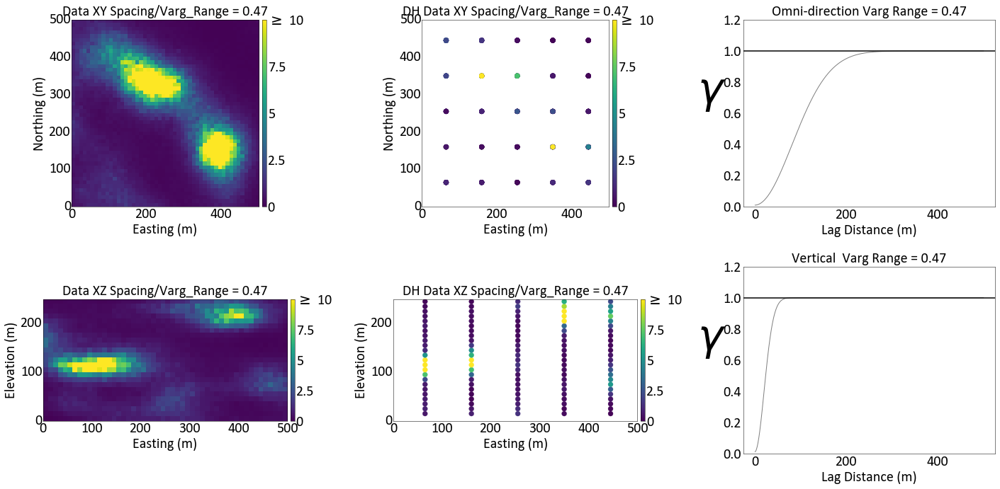

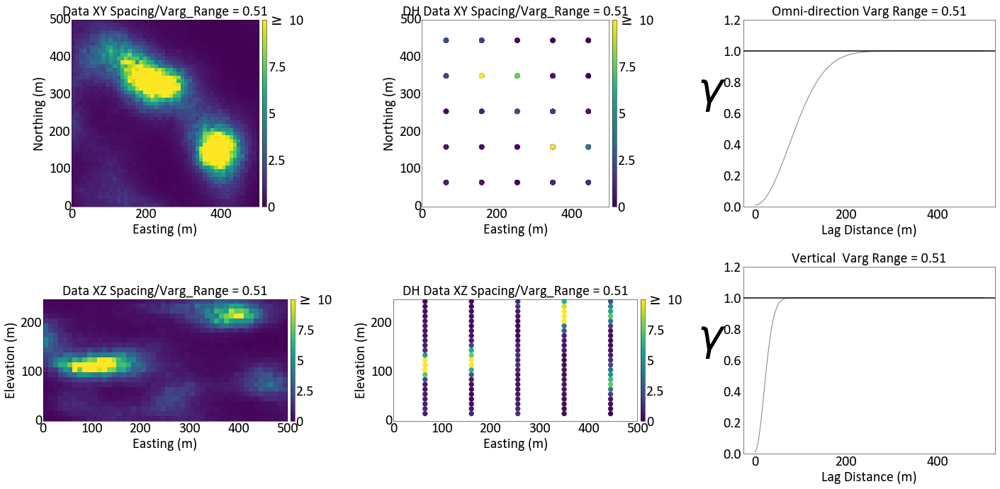

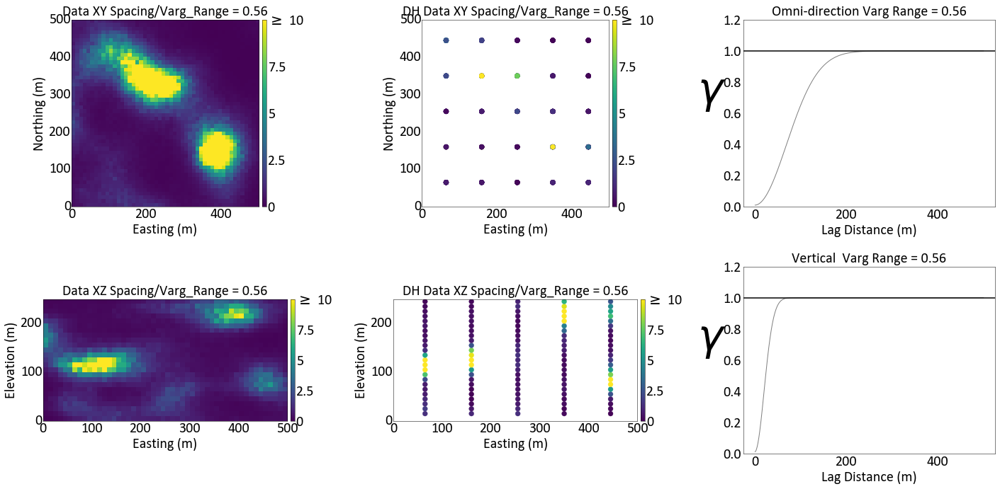

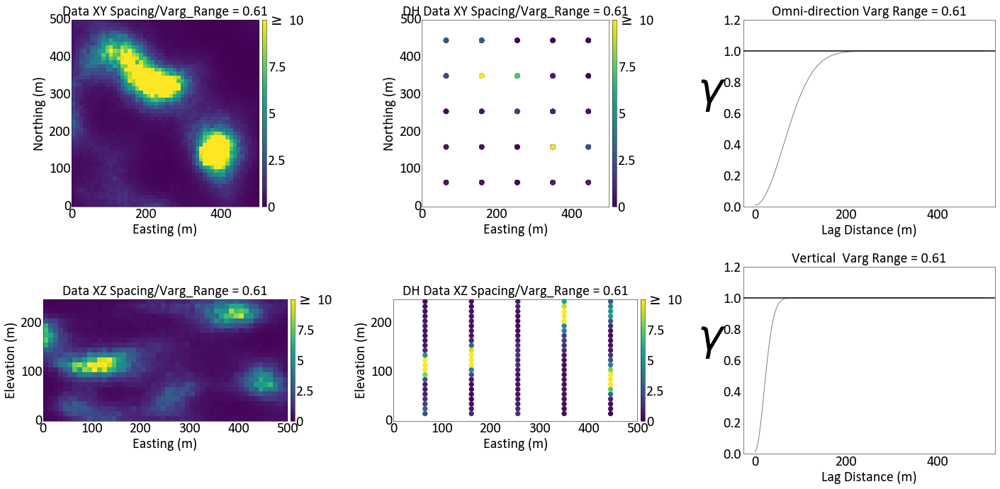

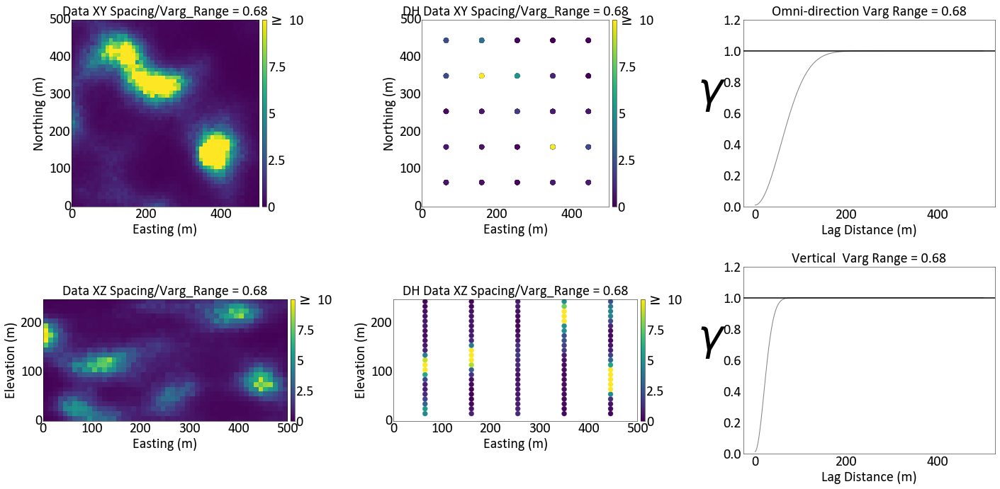

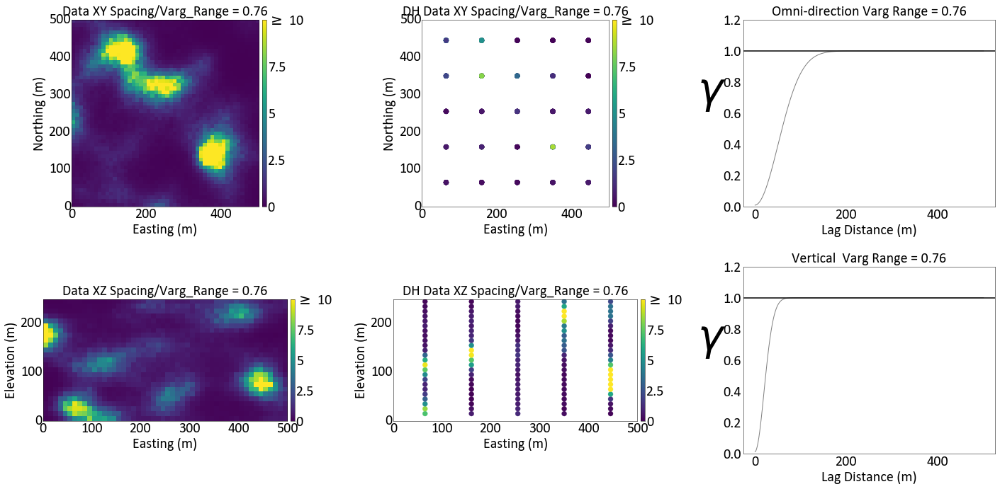

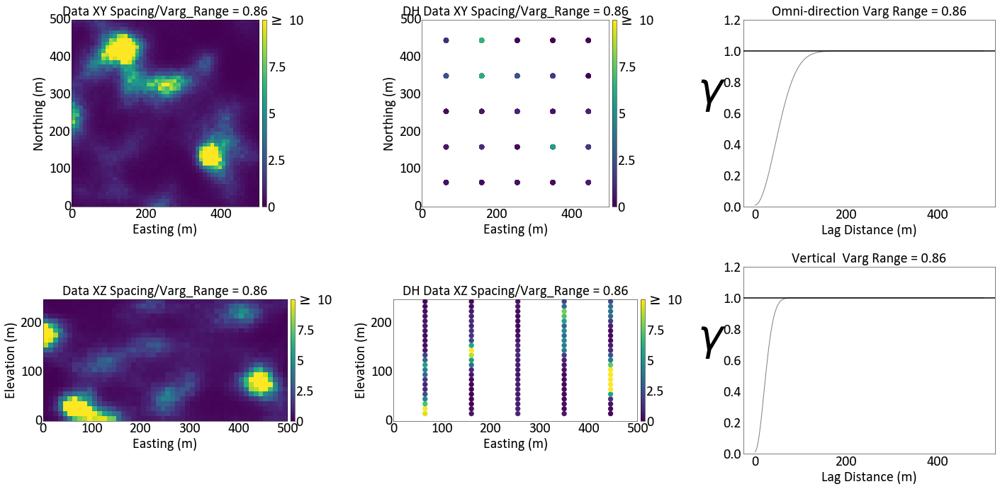

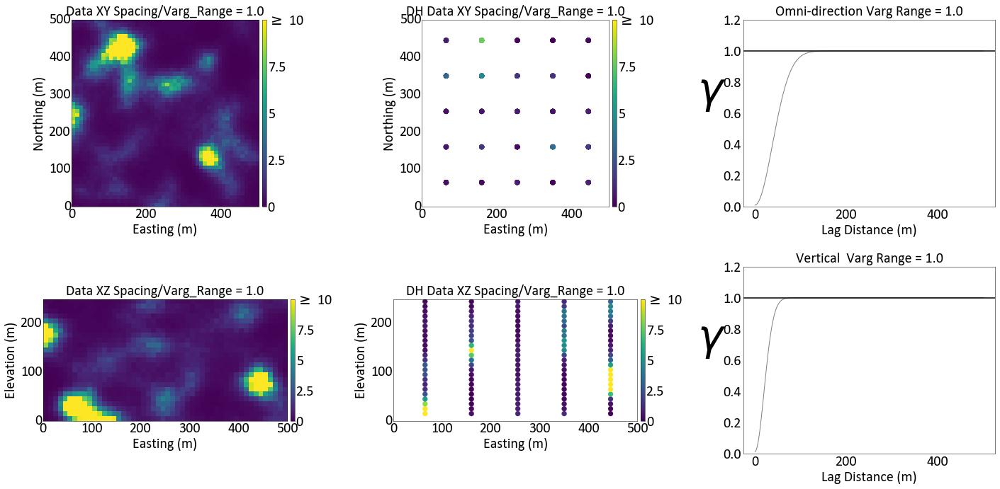

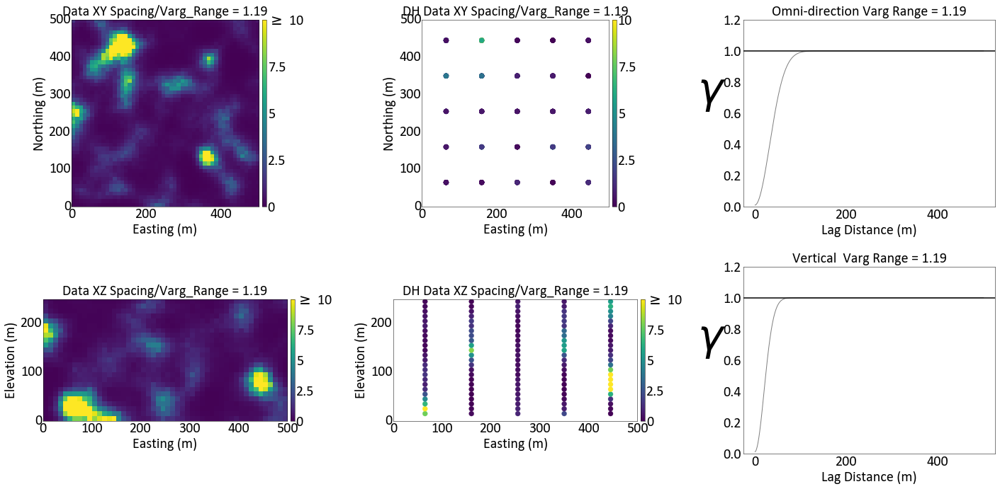

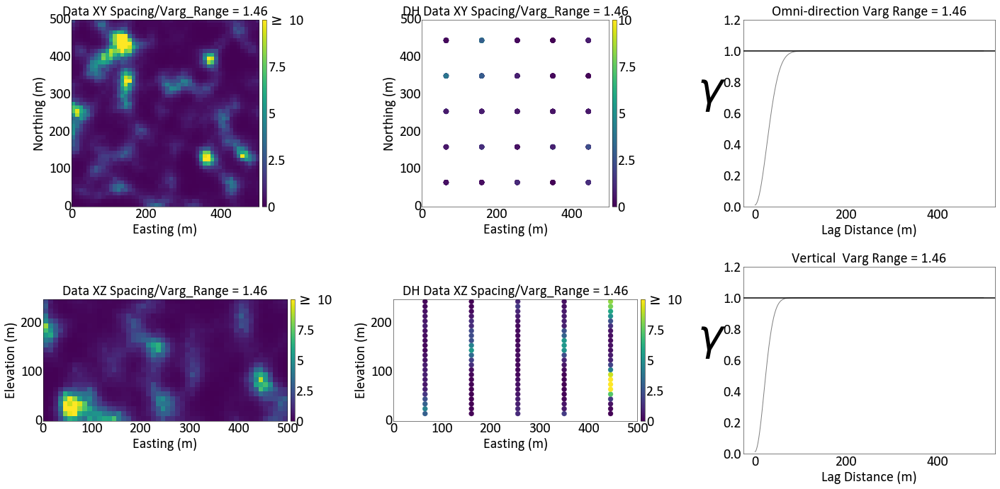

In [96]:
vlim = (0,10)
gs.set_style('pt20')

for fold in range (1,11):
    f, axes = plt.subplots(2, 3, figsize=(20, 10)) 
    dataflpoints = gs.DataFile(flname='dhs_{}.out'.format(fold), x='X',y='Y',z='Z', griddef = griddef,
                           readfl=True)
    vargplt_data = gs.DataFile('vargs/varmodel_{}.out'.format(fold))
    sgsimfl = gs.DataFile('logn/addcoord_{}.out'.format(fold),griddef=griddef)
    std = 95/(200 - (fold-1)*15)
    std = float("{0:.2f}".format(std))
    gs.pixelplt(sgsimfl,var='value',sliceno= 20, ax = axes[0,0],title = ('Data XY Spacing/Varg_Range = {}').format(std),vlim=vlim)
    gs.pixelplt(sgsimfl,var='value',orient='xz',sliceno= 20, ax = axes[1,0],title = ('Data XZ Spacing/Varg_Range = {}').format(std),vlim=vlim)
    gs.locmap(dataflpoints,var = 'value',orient='xy', ax = axes[0,1],sliceno= 15,title = ('DH Data XY Spacing/Varg_Range = {}').format(std),vlim=vlim)
    gs.locmap(dataflpoints,var = 'value',orient='xz', ax = axes[1,1],sliceno= 15,title = ('DH Data XZ Spacing/Varg_Range = {}').format(std),vlim=vlim)
    gs.varplt(vargplt_data,index = 1,experimental=False, title = ('Omni-direction Varg Range = {}').format(std),ax = axes[0,2])
    gs.varplt(vargplt_data,index = 2,experimental=False, title = ('Vertical  Varg Range = {}').format(std),ax = axes[1,2])
    plt.tight_layout()
    plt.savefig('C:/Users/Matt/Desktop/Thesis Work/Thesis/0-Figures/3-Chapter/Data_Drill_{}_{}.png'.format(fold,plt_extent),vlim=vlim)


In [27]:
if 'session' in locals() and session is not None:
    print('Close interactive session')
    session.close()
    tf.InteractiveSession.close(sess)
    sess.close()

0.0438
19.3786
1
Working on Node 20 fold 1 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpf56gnkab', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001181C05A320>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
Instructions for updating:
Queue-based input pipelines have

Epoch: 700/5000 err = 0.005238924408331513
Cost_test : 0.017102396
R^2:0.3615200161933899
Epoch: 800/5000 err = 0.004391938960179686
Cost_test : 0.01602469
R^2:0.45318982601165775
Epoch: 900/5000 err = 0.004002838116139174
Cost_test : 0.015398572
R^2:0.5665939331054687
Epoch: 1000/5000 err = 0.0032714875880628822
Cost_test : 0.014857773
R^2:0.5258195877075196
Epoch: 1100/5000 err = 0.003833547607064247
Cost_test : 0.014458752
R^2:0.6683338999748231
Epoch: 1200/5000 err = 0.0035113315563648937
Cost_test : 0.013868937
R^2:0.6025370836257934
Epoch: 1300/5000 err = 0.0027606406714767214
Cost_test : 0.013353711
R^2:0.7182005524635315
Epoch: 1400/5000 err = 0.002775773266330361
Cost_test : 0.012692797
R^2:0.67004953622818
Epoch: 1500/5000 err = 0.0025428173830732703
Cost_test : 0.012779826
R^2:0.7802501797676087
Epoch: 1600/5000 err = 0.0016095514176413417
Cost_test : 0.012099006
R^2:0.7164589166641235
Epoch: 1700/5000 err = 0.0013860270380973815
Cost_test : 0.010771106
R^2:0.856671035289764

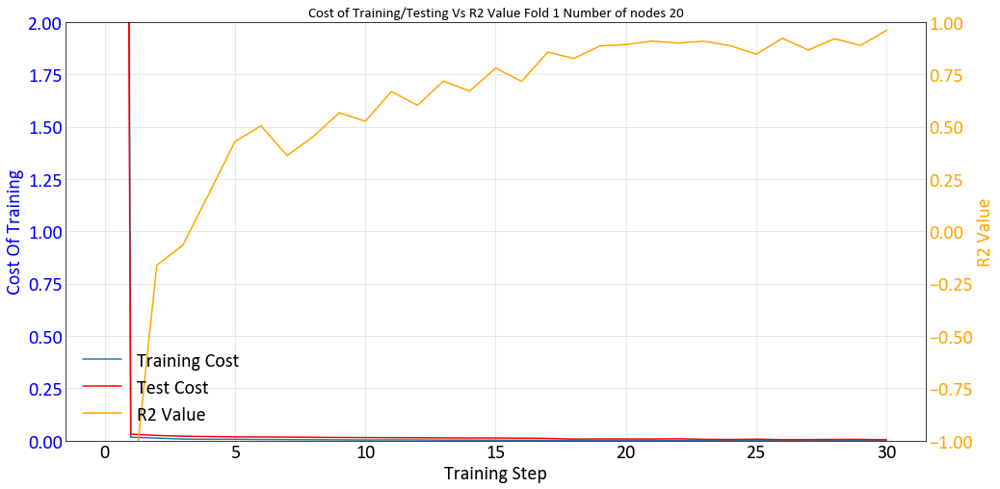

Working on Node 25 fold 1 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpm_0qq5dy', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000118712741D0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.003088944056071341
Cost_test : 0.015532363
R^2:0.5273701071739196
Epoch: 1200/5000 err = 0.003976770443841815
Cost_test : 0.014599613
R^2:0.5732245564460754
Epoch: 1300/5000 err = 0.00405533704906702
Cost_test : 0.015745025
R^2:0.5470345497131348
Epoch: 1400/5000 err = 0.0023817372508347034
Cost_test : 0.01371536
R^2:0.673759937286377
Epoch: 1500/5000 err = 0.0033599690068513155
Cost_test : 0.013263634
R^2:0.737019419670105
Epoch: 1600/5000 err = 0.002685582055710256
Cost_test : 0.013327777
R^2:0.7144406437873839
Epoch: 1700/5000 err = 0.0019372894894331694
Cost_test : 0.012771166
R^2:0.7626777291297913
Epoch: 1800/5000 err = 0.0018923756666481494
Cost_test : 0.012962611
R^2:0.8483487367630005
Epoch: 1900/5000 err = 0.0016348111443221568
Cost_test : 0.0124064265
R^2:0.866695487499237
Epoch: 2000/5000 err = 0.0012887599878013134
Cost_test : 0.01056851
R^2:0.7773298501968384
Epoch: 2100/5000 err = 0.0011340586002916097
Cost_test : 0.010832145
R^2:0.87049403190612

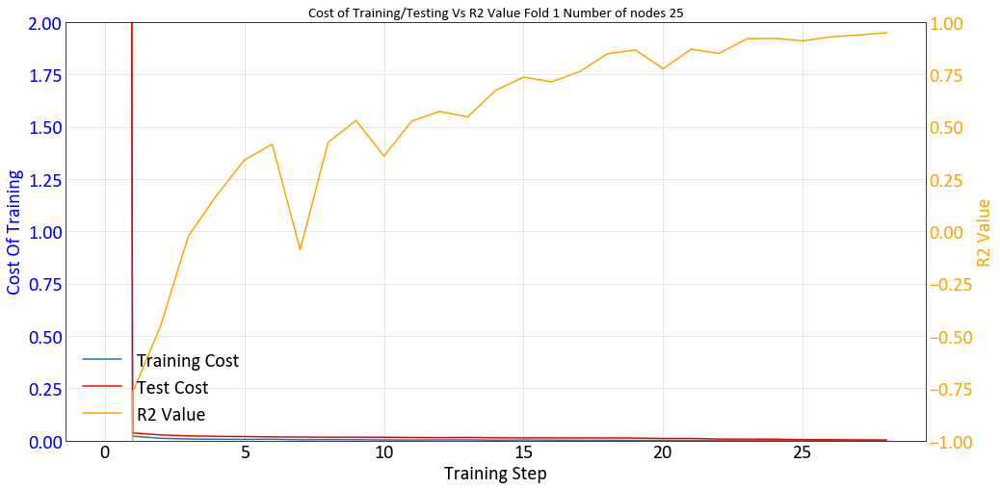

Working on Node 30 fold 1 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpotqn9u3o', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001188E23A0B8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0006583697278983891
Cost_test : 0.0047110585
R^2:0.8946763157844543
Epoch: 1200/5000 err = 0.0005344424163922668
Cost_test : 0.0041062976
R^2:0.9479199886322021
Epoch: 1300/5000 err = 0.0006095239543356001
Cost_test : 0.0037249273
R^2:0.9435657382011413
End of learning process
Final epoch = 1343/5000 
Final error = 0.0002816468826495111
Final R^2 = 0.9725288867950439
[[2.00000000e+01 6.28420531e-01 0.00000000e+00 1.27656547e+00
  4.52064879e+00 0.00000000e+00 3.72989246e-04 4.22828799e+02]
 [2.50000000e+01 5.11647631e-01 0.00000000e+00 1.27035955e+00
  4.01972530e+00 0.00000000e+00 4.05074348e-04 4.42309244e+02]
 [3.00000000e+01 1.81796030e+00 0.00000000e+00 9.54456203e-01
  4.64596941e+00 0.00000000e+00 2.81646883e-04 2.77632289e+02]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e

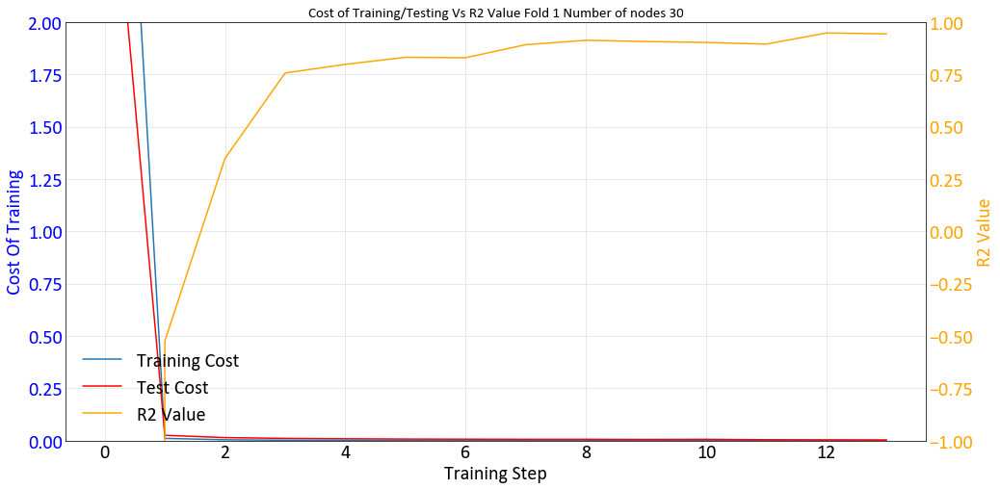

Working on Node 35 fold 1 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpltx2kwxl', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001188F651CF8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0031493864487856624
Cost_test : 0.01370058
R^2:0.5798927783966064
Epoch: 1200/5000 err = 0.0024871010798960926
Cost_test : 0.012898954
R^2:0.6866875290870667
Epoch: 1300/5000 err = 0.0017689304659143092
Cost_test : 0.012004458
R^2:0.6593690633773804
Epoch: 1400/5000 err = 0.002589596388861537
Cost_test : 0.011435991
R^2:0.7061176419258118
Epoch: 1500/5000 err = 0.0019415141781792046
Cost_test : 0.010928738
R^2:0.8100322842597961
Epoch: 1600/5000 err = 0.002040633140131831
Cost_test : 0.00937309
R^2:0.8461623549461366
Epoch: 1700/5000 err = 0.0013889121939428151
Cost_test : 0.00913293
R^2:0.8907628893852234
Epoch: 1800/5000 err = 0.0010747095337137582
Cost_test : 0.007613334
R^2:0.8934463858604431
Epoch: 1900/5000 err = 0.0008791335276328027
Cost_test : 0.007440316
R^2:0.9017768502235411
Epoch: 2000/5000 err = 0.001082834048429504
Cost_test : 0.006635695
R^2:0.8879506707191467
Epoch: 2100/5000 err = 0.0009467369993217289
Cost_test : 0.006075946
R^2:0.90206199884

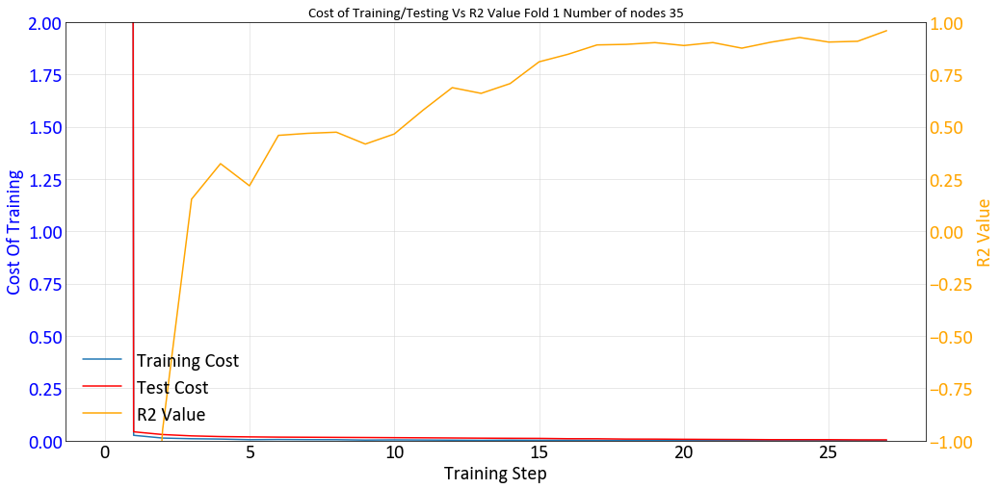

Working on Node 50 fold 1 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp3u1rq973', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001188FF3EC88>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0010527330101467668
Cost_test : 0.007731043
R^2:0.8783039093017578
Epoch: 1200/5000 err = 0.0011112387990579009
Cost_test : 0.008409137
R^2:0.8816430807113649
Epoch: 1300/5000 err = 0.0007720216119196266
Cost_test : 0.006057652
R^2:0.9060247540473939
Epoch: 1400/5000 err = 0.000934201304335147
Cost_test : 0.0058421106
R^2:0.9040169954299928
Epoch: 1500/5000 err = 0.0005052488326327876
Cost_test : 0.0057671233
R^2:0.9422569632530211
Epoch: 1600/5000 err = 0.0005070135870482772
Cost_test : 0.005796124
R^2:0.9301088690757751
Epoch: 1700/5000 err = 0.00038904587272554637
Cost_test : 0.0045169643
R^2:0.9549450516700744
End of learning process
Final epoch = 1789/5000 
Final error = 0.00028774269740097227
Final R^2 = 0.9734546184539795
[[2.00000000e+01 6.28420531e-01 0.00000000e+00 1.27656547e+00
  4.52064879e+00 0.00000000e+00 3.72989246e-04 4.22828799e+02]
 [2.50000000e+01 5.11647631e-01 0.00000000e+00 1.27035955e+00
  4.01972530e+00 0.00000000e+00 4.05074348e-04 4.

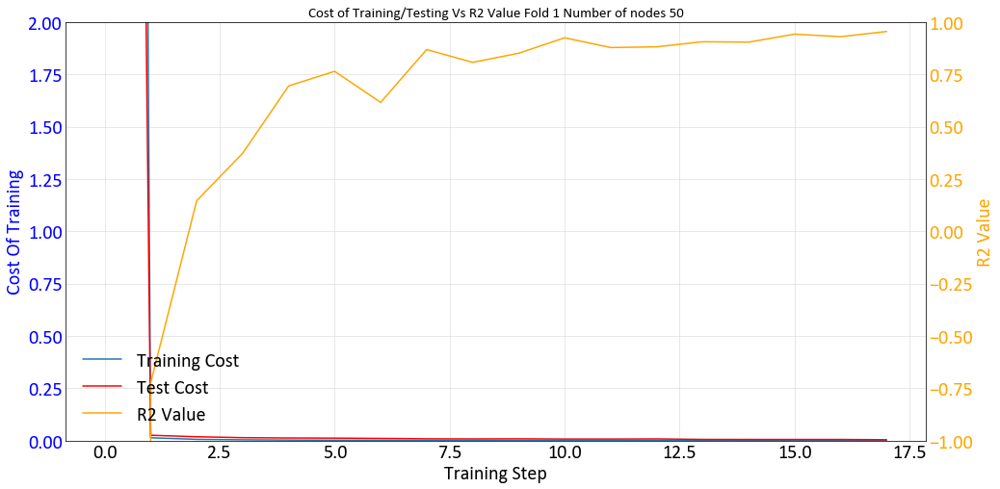

0.0311
20.0364
2
Working on Node 20 fold 2 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp_etbx19q', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001189495B470>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done call

Epoch: 1100/5000 err = 0.0037413358688354495
Cost_test : 0.005201391
R^2:0.7378501772880555
Epoch: 1200/5000 err = 0.0033788499888032673
Cost_test : 0.0044221156
R^2:0.7230119943618774
Epoch: 1300/5000 err = 0.00271124979481101
Cost_test : 0.0038412178
R^2:0.7827614903450012
Epoch: 1400/5000 err = 0.0022400136338546874
Cost_test : 0.0038432134
R^2:0.7013428330421447
Epoch: 1500/5000 err = 0.0016020103706978262
Cost_test : 0.0029502136
R^2:0.8611301541328431
Epoch: 1600/5000 err = 0.0013979341019876301
Cost_test : 0.002329237
R^2:0.8948166966438292
Epoch: 1700/5000 err = 0.0008136324351653457
Cost_test : 0.0019388044
R^2:0.9357068777084351
Epoch: 1800/5000 err = 0.0009043458383530378
Cost_test : 0.001934132
R^2:0.9532505154609681
Epoch: 1900/5000 err = 0.0007518163882195949
Cost_test : 0.001951825
R^2:0.9297648787498474
End of learning process
Final epoch = 1940/5000 
Final error = 0.0005035340611357242
Final R^2 = 0.9745445609092712
[[2.00000000e+01 8.64353837e-01 0.00000000e+00 1.3314

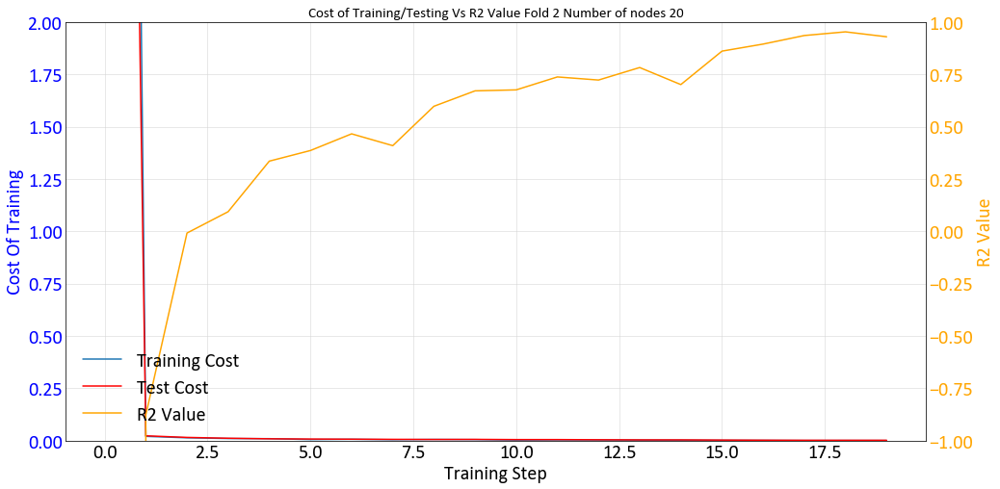

Working on Node 25 fold 2 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpmeb3ady0', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001188D65C240>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0045883637387305505
Cost_test : 0.0068942662
R^2:0.5816710710525513
Epoch: 1200/5000 err = 0.0050523145589977505
Cost_test : 0.006645328
R^2:0.5047838926315308
Epoch: 1300/5000 err = 0.00727194668725133
Cost_test : 0.005262151
R^2:0.5644424200057984
Epoch: 1400/5000 err = 0.005046222498640418
Cost_test : 0.004543959
R^2:0.6540801525115967
Epoch: 1500/5000 err = 0.004358412884175778
Cost_test : 0.005348261
R^2:0.5290440797805785
Epoch: 1600/5000 err = 0.003126667789183557
Cost_test : 0.0039275903
R^2:0.7010930180549622
Epoch: 1700/5000 err = 0.0031769382301718
Cost_test : 0.003173374
R^2:0.7383088946342469
Epoch: 1800/5000 err = 0.002719926589634269
Cost_test : 0.0027686127
R^2:0.8500134706497193
Epoch: 1900/5000 err = 0.0018273353343829513
Cost_test : 0.002010334
R^2:0.8576275706291199
Epoch: 2000/5000 err = 0.0013142437557689844
Cost_test : 0.0017621483
R^2:0.9089054584503173
Epoch: 2100/5000 err = 0.0012857325724326075
Cost_test : 0.0016675993
R^2:0.903875553

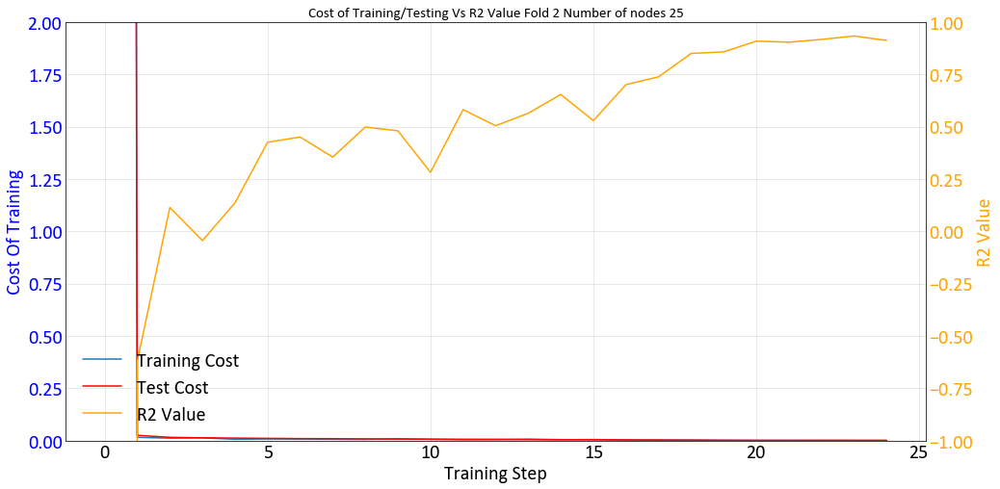

Working on Node 30 fold 2 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpbsh19jrl', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000011870D2B7F0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.004062567511573433
Cost_test : 0.0053490303
R^2:0.6831584095954895
Epoch: 1200/5000 err = 0.00371738423127681
Cost_test : 0.0045160237
R^2:0.637700879573822
Epoch: 1300/5000 err = 0.002818876109085977
Cost_test : 0.004393464
R^2:0.6234755992889405
Epoch: 1400/5000 err = 0.003651457233354449
Cost_test : 0.0037584682
R^2:0.7120882749557496
Epoch: 1500/5000 err = 0.002528495038859546
Cost_test : 0.0041646753
R^2:0.7583969831466675
Epoch: 1600/5000 err = 0.002309732395224273
Cost_test : 0.0033490448
R^2:0.8080889582633972
Epoch: 1700/5000 err = 0.0015035288291983305
Cost_test : 0.0027439082
R^2:0.8750662684440613
Epoch: 1800/5000 err = 0.0007645983365364372
Cost_test : 0.0024251603
R^2:0.8906630873680115
Epoch: 1900/5000 err = 0.0010604057926684616
Cost_test : 0.0022010703
R^2:0.9408217549324036
Epoch: 2000/5000 err = 0.0008194665075279772
Cost_test : 0.0018918843
R^2:0.8199103355407715
Epoch: 2100/5000 err = 0.0005562061909586191
Cost_test : 0.0021857063
R^2:0.953

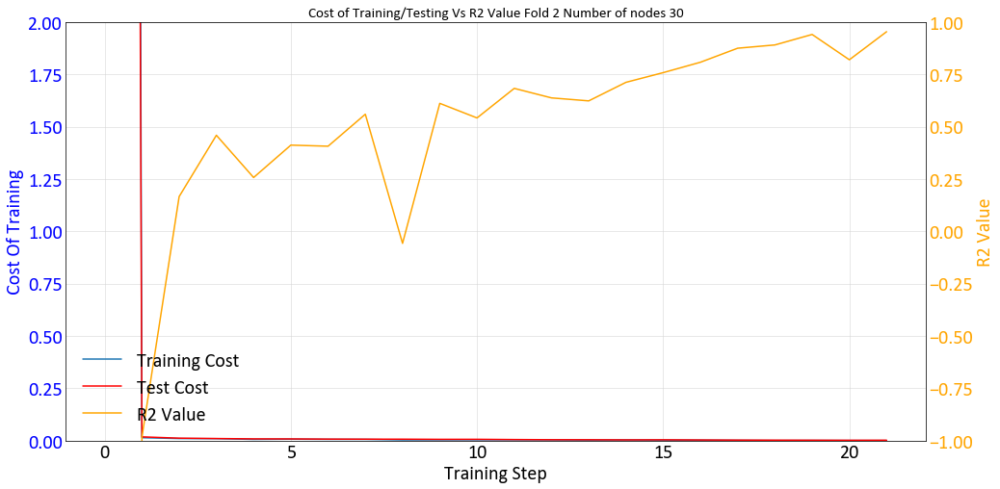

Working on Node 35 fold 2 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp3vjfpv7g', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000011894289048>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.004473306844010949
Cost_test : 0.0054494576
R^2:0.5733804345130921
Epoch: 1200/5000 err = 0.004990993672981859
Cost_test : 0.00529282
R^2:0.6844632863998414
Epoch: 1300/5000 err = 0.003561781393364072
Cost_test : 0.004639271
R^2:0.7745805263519288
Epoch: 1400/5000 err = 0.0032058140728622674
Cost_test : 0.0049223676
R^2:0.8207325458526611
Epoch: 1500/5000 err = 0.002467861259356141
Cost_test : 0.005602682
R^2:0.7986824035644531
Epoch: 1600/5000 err = 0.002052910067141056
Cost_test : 0.0046559297
R^2:0.7610960006713867
Epoch: 1700/5000 err = 0.0013813602970913052
Cost_test : 0.0052572945
R^2:0.8565343976020813
Epoch: 1800/5000 err = 0.0013191278325393795
Cost_test : 0.0046462594
R^2:0.807495367527008
Epoch: 1900/5000 err = 0.0011771341552957893
Cost_test : 0.0048857043
R^2:0.7644496798515319
Epoch: 2000/5000 err = 0.0009414897300302981
Cost_test : 0.005052353
R^2:0.8847181081771851
Epoch: 2100/5000 err = 0.001188376802019775
Cost_test : 0.0054463996
R^2:0.914488

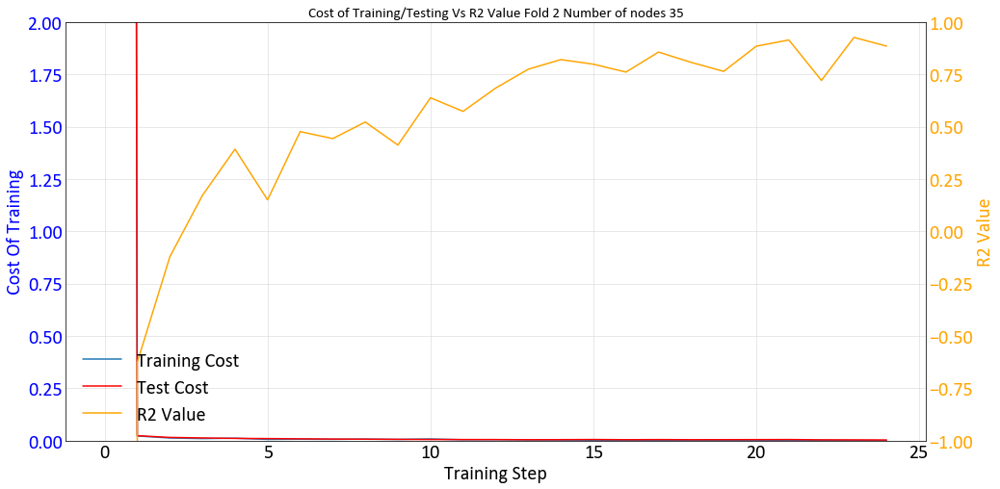

Working on Node 50 fold 2 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp0glt9d14', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000011892A170B8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0019415384391322731
Cost_test : 0.002723671
R^2:0.8943555235862732
Epoch: 1200/5000 err = 0.0012226707767695189
Cost_test : 0.0026286528
R^2:0.8897406935691832
Epoch: 1300/5000 err = 0.0009938698669429869
Cost_test : 0.0024689666
R^2:0.9078667521476746
Epoch: 1400/5000 err = 0.000578042137203738
Cost_test : 0.0027274052
R^2:0.9070141434669495
Epoch: 1500/5000 err = 0.000571627396857366
Cost_test : 0.0021943036
R^2:0.937350594997406
Epoch: 1600/5000 err = 0.0006965369975659996
Cost_test : 0.0021130247
R^2:0.9457484006881712
End of learning process
Final epoch = 1629/5000 
Final error = 0.0004462209821213037
Final R^2 = 0.9713087558746338
[[2.00000000e+01 8.64353837e-01 0.00000000e+00 1.33144598e+00
  4.15798881e+00 0.00000000e+00 5.03534061e-04 2.62739013e+02]
 [2.50000000e+01 5.21609488e-01 0.00000000e+00 1.32608620e+00
  5.11547816e+00 0.00000000e+00 4.92435612e-04 3.82234771e+02]
 [3.00000000e+01 7.07249612e-01 0.00000000e+00 1.15664109e+00
  4.07686157e+00 0

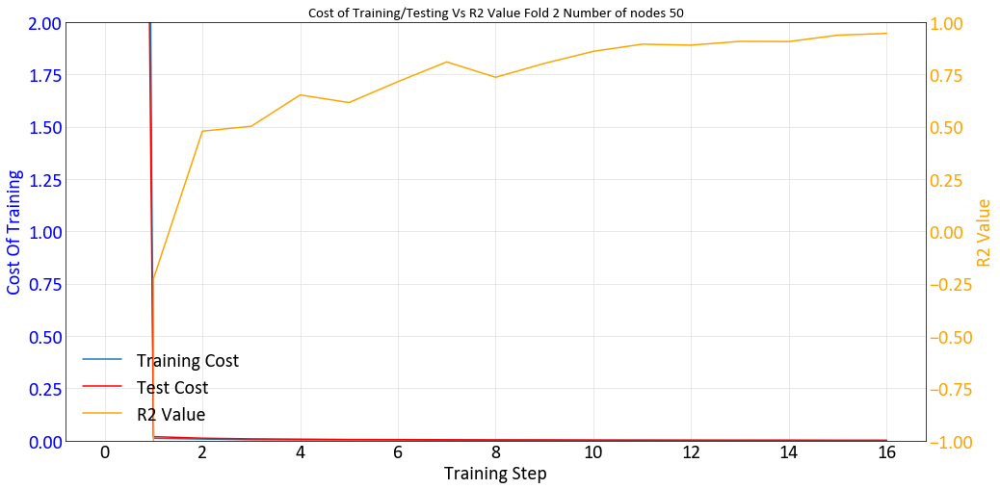

0.0192
20.7333
3
Working on Node 20 fold 3 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpbgkvuyvr', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000011820B57F98>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done call

Epoch: 1100/5000 err = 0.005193005315959454
Cost_test : 0.009731197
R^2:0.7650381684303283
Epoch: 1200/5000 err = 0.004348113806918263
Cost_test : 0.0091835065
R^2:0.6977122187614441
Epoch: 1300/5000 err = 0.002761381305754185
Cost_test : 0.008773736
R^2:0.7934182643890382
Epoch: 1400/5000 err = 0.002218114654533565
Cost_test : 0.009160189
R^2:0.8032679796218872
Epoch: 1500/5000 err = 0.0018897075206041336
Cost_test : 0.008251665
R^2:0.8741013884544373
Epoch: 1600/5000 err = 0.0012630662182345985
Cost_test : 0.007691492
R^2:0.8431999921798706
Epoch: 1700/5000 err = 0.0015984608558937906
Cost_test : 0.0061544715
R^2:0.8548259139060975
Epoch: 1800/5000 err = 0.0013775053783319888
Cost_test : 0.005578519
R^2:0.8978347659111023
Epoch: 1900/5000 err = 0.0010335246450267732
Cost_test : 0.0046166726
R^2:0.8555383205413818
Epoch: 2000/5000 err = 0.0009741603280417621
Cost_test : 0.0052382965
R^2:0.9352579712867737
Epoch: 2100/5000 err = 0.000802937534172088
Cost_test : 0.0035548338
R^2:0.91664

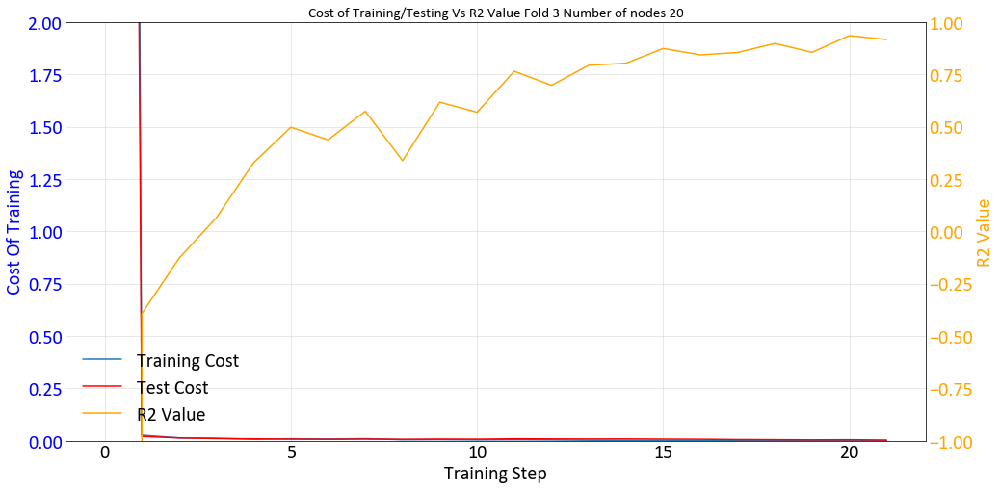

Working on Node 25 fold 3 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp6f6qa6ag', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000011892A0FA58>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.00464758351445198
Cost_test : 0.0065214457
R^2:0.5866210103034973
Epoch: 1200/5000 err = 0.004116426734253764
Cost_test : 0.0072769015
R^2:0.7157896161079407
Epoch: 1300/5000 err = 0.003359719924628735
Cost_test : 0.007700295
R^2:0.7367140650749207
Epoch: 1400/5000 err = 0.0030501864850521086
Cost_test : 0.0077522774
R^2:0.7104557871818542
Epoch: 1500/5000 err = 0.0030178186949342493
Cost_test : 0.008197722
R^2:0.7987095713615417
Epoch: 1600/5000 err = 0.0026300927391275765
Cost_test : 0.006851843
R^2:0.8303545355796813
Epoch: 1700/5000 err = 0.00220711927395314
Cost_test : 0.00725658
R^2:0.8282508134841919
Epoch: 1800/5000 err = 0.0021940850419923663
Cost_test : 0.008028931
R^2:0.8926321864128113
Epoch: 1900/5000 err = 0.001341627910733223
Cost_test : 0.006901756
R^2:0.8675286889076232
Epoch: 2000/5000 err = 0.00153666011756286
Cost_test : 0.005660469
R^2:0.8796876072883606
Epoch: 2100/5000 err = 0.0020530369598418473
Cost_test : 0.006683924
R^2:0.905890643596

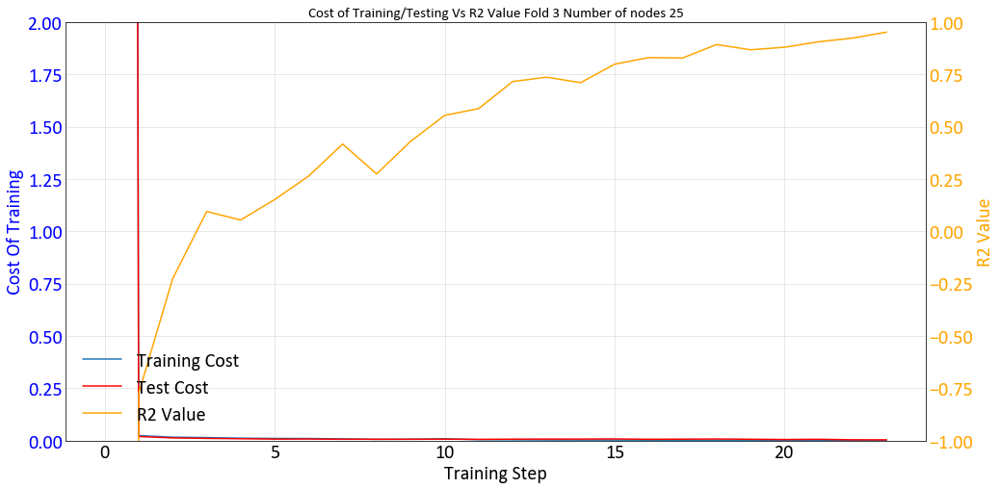

Working on Node 30 fold 3 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp4276fqt0', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000011870F28438>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0027960270643234255
Cost_test : 0.0067045605
R^2:0.7505650639533996
Epoch: 1200/5000 err = 0.0016243126010522246
Cost_test : 0.0071150577
R^2:0.856476616859436
Epoch: 1300/5000 err = 0.0017988624982535838
Cost_test : 0.008498823
R^2:0.9035057067871094
Epoch: 1400/5000 err = 0.001285261765588075
Cost_test : 0.0072406973
R^2:0.8333765864372253
Epoch: 1500/5000 err = 0.0015076745650731025
Cost_test : 0.0074237217
R^2:0.905480146408081
Epoch: 1600/5000 err = 0.0011582219158299267
Cost_test : 0.0058194245
R^2:0.8344305872917175
Epoch: 1700/5000 err = 0.00172482366906479
Cost_test : 0.006761727
R^2:0.8989995360374451
Epoch: 1800/5000 err = 0.0009602112928405405
Cost_test : 0.0066895764
R^2:0.8724990725517274
Epoch: 1900/5000 err = 0.0010440667741931976
Cost_test : 0.0065698177
R^2:0.9329177737236023
Epoch: 2000/5000 err = 0.002142547757830471
Cost_test : 0.007007489
R^2:0.8856951236724854
Epoch: 2100/5000 err = 0.0007180487271398307
Cost_test : 0.0063635814
R^2:0.956

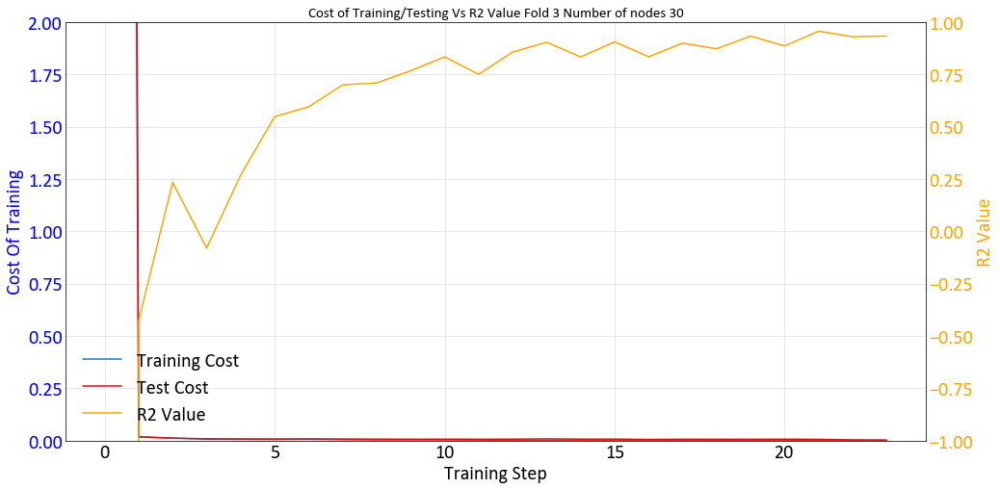

Working on Node 35 fold 3 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpul3tb289', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000011818807D30>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0016916565946303308
Cost_test : 0.008814214
R^2:0.8379047751426696
Epoch: 1200/5000 err = 0.0014688300085254013
Cost_test : 0.006368622
R^2:0.8817395329475404
Epoch: 1300/5000 err = 0.0013466739212162793
Cost_test : 0.0051928866
R^2:0.8885703444480896
Epoch: 1400/5000 err = 0.0012169428751803936
Cost_test : 0.0053538927
R^2:0.9169139623641969
Epoch: 1500/5000 err = 0.0009851385373622179
Cost_test : 0.005019798
R^2:0.929066038131714
Epoch: 1600/5000 err = 0.0006225507473573089
Cost_test : 0.0043522054
R^2:0.9338748574256897
Epoch: 1700/5000 err = 0.0006385651358868927
Cost_test : 0.0046861344
R^2:0.9482339143753051
End of learning process
Final epoch = 1732/5000 
Final error = 0.0004562902206089347
Final R^2 = 0.971971297264099
[[2.00000000e+01 6.36032597e-01 0.00000000e+00 1.55653518e+00
  6.31530669e+00 0.00000000e+00 5.34705492e-04 2.90610104e+02]
 [2.50000000e+01 5.21576362e-01 0.00000000e+00 1.41502379e+00
  5.96779222e+00 0.00000000e+00 5.04113821e-04 3.78

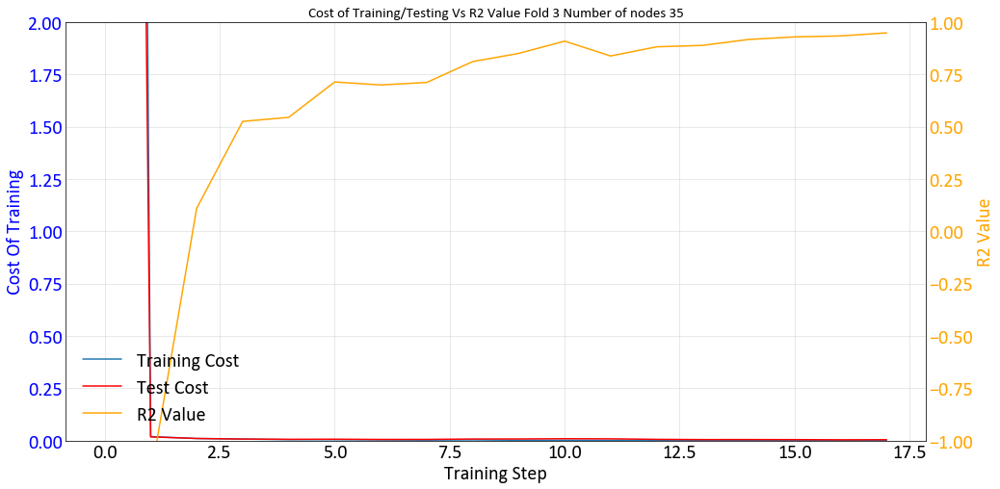

Working on Node 50 fold 3 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpyftyalr2', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001181B6E5400>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0027821096824482082
Cost_test : 0.007327496
R^2:0.7254119515419006
Epoch: 1200/5000 err = 0.0022962568793445824
Cost_test : 0.008041703
R^2:0.8275832891464232
Epoch: 1300/5000 err = 0.002124313684180379
Cost_test : 0.0067570796
R^2:0.8149336338043213
Epoch: 1400/5000 err = 0.0011143846320919692
Cost_test : 0.0071966867
R^2:0.9294837951660156
Epoch: 1500/5000 err = 0.0020424109417945145
Cost_test : 0.0064997044
R^2:0.8279401183128358
Epoch: 1600/5000 err = 0.0013175977976061404
Cost_test : 0.0064593777
R^2:0.9071802496910095
Epoch: 1700/5000 err = 0.00160579300718382
Cost_test : 0.006184284
R^2:0.9022297382354737
Epoch: 1800/5000 err = 0.0008597870531957597
Cost_test : 0.0062570916
R^2:0.9221140146255493
Epoch: 1900/5000 err = 0.0008120126381982117
Cost_test : 0.0065235677
R^2:0.9417484760284425
Epoch: 2000/5000 err = 0.0007621288299560547
Cost_test : 0.0058069257
R^2:0.9043308019638061
End of learning process
Final epoch = 2071/5000 
Final error = 0.00062941405

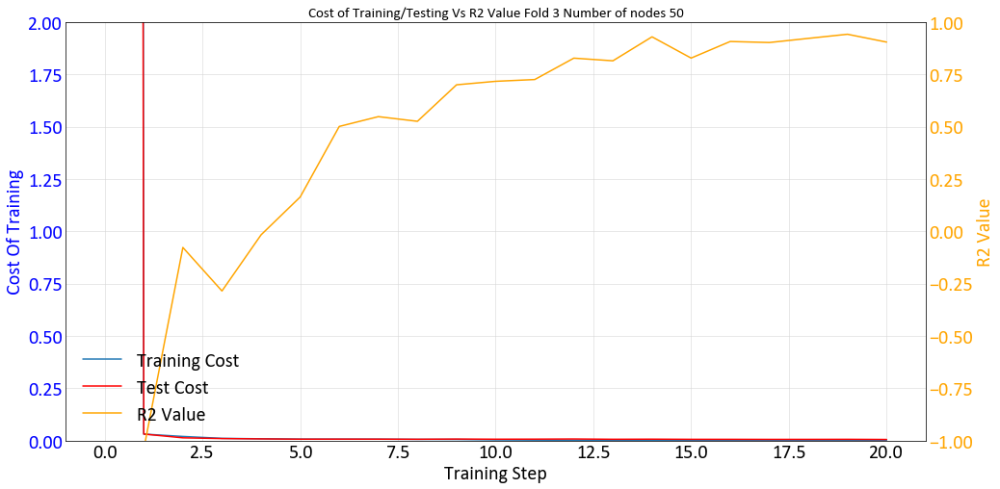

0.0123
19.9847
4
Working on Node 20 fold 4 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpwffwrl93', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000011893CD4278>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done call

Epoch: 1100/5000 err = 0.006271505076438188
Cost_test : 0.007144153
R^2:0.6676506996154785
Epoch: 1200/5000 err = 0.003607597574591637
Cost_test : 0.0068773804
R^2:0.6756179928779602
Epoch: 1300/5000 err = 0.003598581254482269
Cost_test : 0.006207637
R^2:0.722835624217987
Epoch: 1400/5000 err = 0.0034658536082133647
Cost_test : 0.005484098
R^2:0.7494257807731628
Epoch: 1500/5000 err = 0.004089344153180718
Cost_test : 0.0057207444
R^2:0.767360830307007
Epoch: 1600/5000 err = 0.0029732601484283804
Cost_test : 0.0042060637
R^2:0.8061741948127747
Epoch: 1700/5000 err = 0.0032752822618931535
Cost_test : 0.0044385553
R^2:0.8432291626930236
Epoch: 1800/5000 err = 0.0019916296005249023
Cost_test : 0.0036701262
R^2:0.8186117172241211
Epoch: 1900/5000 err = 0.0010913723264820874
Cost_test : 0.0036516793
R^2:0.85312739610672
Epoch: 2000/5000 err = 0.0011105061508715152
Cost_test : 0.0038182202
R^2:0.900749695301056
Epoch: 2100/5000 err = 0.0006860251538455485
Cost_test : 0.0028022216
R^2:0.945075

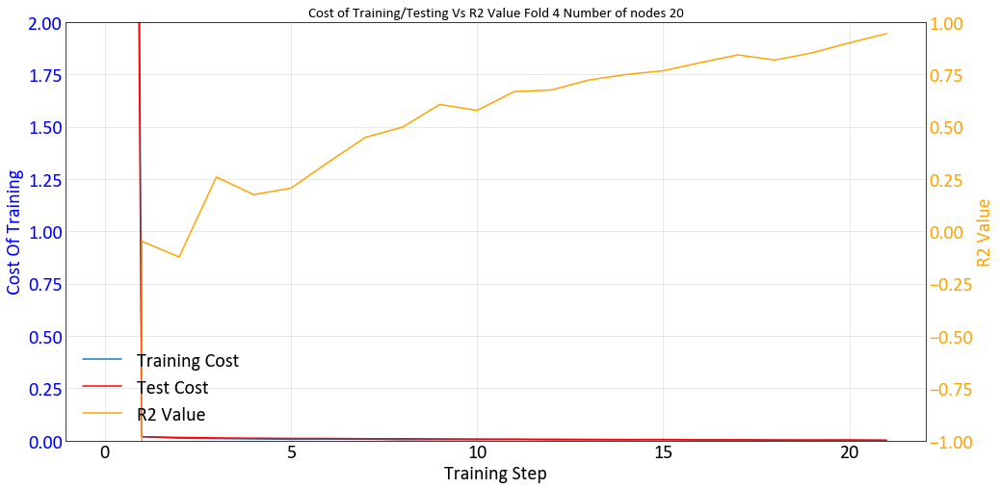

Working on Node 25 fold 4 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp1q4plnsl', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001188DBA8710>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.004722656635567546
Cost_test : 0.009585114
R^2:0.5175983548164368
Epoch: 1200/5000 err = 0.005338518042117357
Cost_test : 0.009681579
R^2:0.4595807075500488
Epoch: 1300/5000 err = 0.004330324660986661
Cost_test : 0.009440247
R^2:0.4843742370605469
Epoch: 1400/5000 err = 0.004913072427734733
Cost_test : 0.008914592
R^2:0.5680641770362854
Epoch: 1500/5000 err = 0.0044889627257362
Cost_test : 0.009379178
R^2:0.6908026099205017
Epoch: 1600/5000 err = 0.002426355890929699
Cost_test : 0.00822922
R^2:0.7362894415855408
Epoch: 1700/5000 err = 0.003014301764778793
Cost_test : 0.0065937554
R^2:0.7022042989730835
Epoch: 1800/5000 err = 0.00282091167755425
Cost_test : 0.006376585
R^2:0.7817983508110047
Epoch: 1900/5000 err = 0.0023275357438251377
Cost_test : 0.005555941
R^2:0.8066593289375306
Epoch: 2000/5000 err = 0.0017789102857932448
Cost_test : 0.004409001
R^2:0.7925210475921631
Epoch: 2100/5000 err = 0.0012204180937260389
Cost_test : 0.004264516
R^2:0.8856479167938233

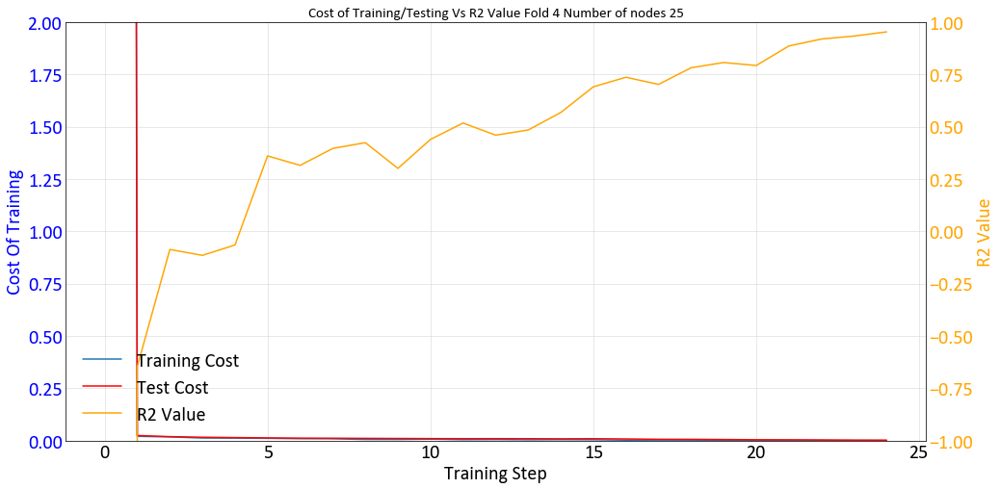

Working on Node 30 fold 4 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp66dyfy7c', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001188D661C18>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0023538772249594333
Cost_test : 0.0063679065
R^2:0.7716383934020996
Epoch: 1200/5000 err = 0.0034936452750116585
Cost_test : 0.005410055
R^2:0.8089863896369934
Epoch: 1300/5000 err = 0.002125807572156191
Cost_test : 0.005127567
R^2:0.8437442183494568
Epoch: 1400/5000 err = 0.0019446666585281492
Cost_test : 0.004684451
R^2:0.8520724534988403
Epoch: 1500/5000 err = 0.0015458351350389422
Cost_test : 0.0045881276
R^2:0.8574814200401306
Epoch: 1600/5000 err = 0.0012807329767383635
Cost_test : 0.004970509
R^2:0.8462950110435485
Epoch: 1700/5000 err = 0.0009505324298515916
Cost_test : 0.0043675825
R^2:0.8943723440170288
Epoch: 1800/5000 err = 0.001123767124954611
Cost_test : 0.0045241104
R^2:0.8829158186912536
Epoch: 1900/5000 err = 0.0005761840555351227
Cost_test : 0.004329903
R^2:0.9313915014266967
Epoch: 2000/5000 err = 0.0008038300671614707
Cost_test : 0.0034895248
R^2:0.9136898636817932
Epoch: 2100/5000 err = 0.00046438734862022104
Cost_test : 0.0033510479
R^2:0.

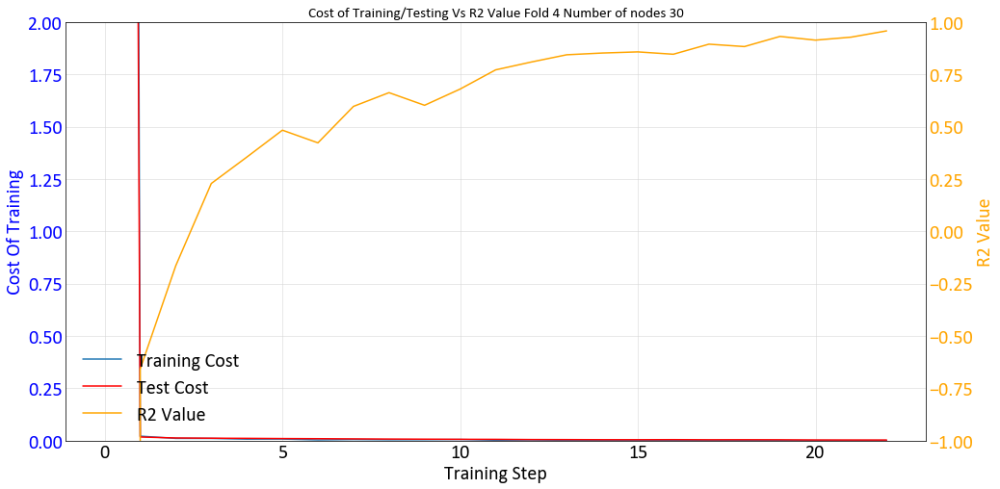

Working on Node 35 fold 4 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp95a0rw3y', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000118948A3E80>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0015320834936574101
Cost_test : 0.004270896
R^2:0.8911242365837098
Epoch: 1200/5000 err = 0.0008733172900974751
Cost_test : 0.003820304
R^2:0.9004086971282959
Epoch: 1300/5000 err = 0.0009864654217381032
Cost_test : 0.0035151443
R^2:0.916729187965393
Epoch: 1400/5000 err = 0.0010780901997350157
Cost_test : 0.003363703
R^2:0.9352934956550598
Epoch: 1500/5000 err = 0.00038344942731782794
Cost_test : 0.002767677
R^2:0.9088811278343201
End of learning process
Final epoch = 1502/5000 
Final error = 0.0005582808196777479
Final R^2 = 0.9709181427955627
[[2.00000000e+01 6.16705162e-01 0.00000000e+00 1.22927681e+00
  7.19275961e+00 0.00000000e+00 4.84208576e-04 2.87327144e+02]
 [2.50000000e+01 4.97372538e-01 0.00000000e+00 1.28068251e+00
  5.38680625e+00 0.00000000e+00 4.68757778e-04 3.89601451e+02]
 [3.00000000e+01 7.88575688e-01 0.00000000e+00 1.06696264e+00
  5.81267906e+00 0.00000000e+00 4.68990140e-04 4.18378214e+02]
 [3.50000000e+01 1.43743826e+00 0.00000000e+00 1

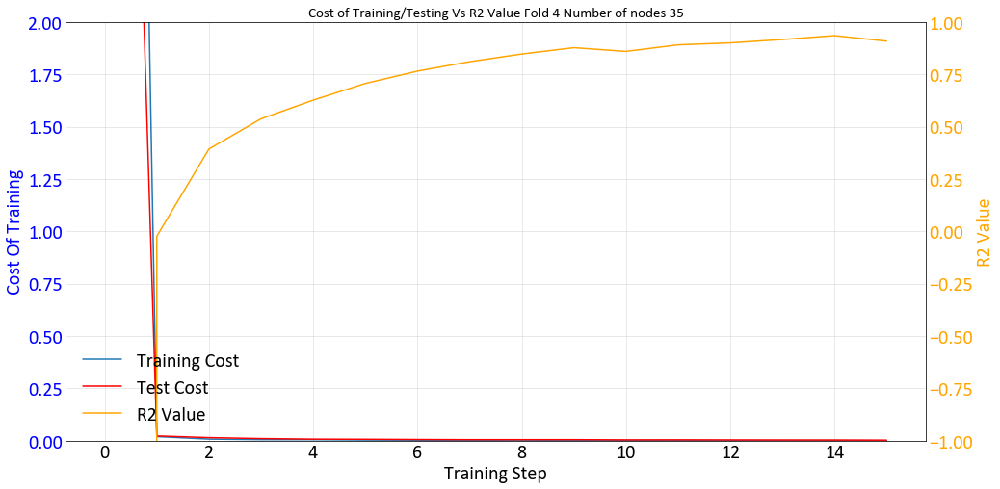

Working on Node 50 fold 4 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpnjc1r9x3', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001188E0C4630>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0033150195842608808
Cost_test : 0.0074048494
R^2:0.7168156147003174
Epoch: 1200/5000 err = 0.004219843377359212
Cost_test : 0.006567959
R^2:0.6359650969505309
Epoch: 1300/5000 err = 0.00321290863212198
Cost_test : 0.006842147
R^2:0.7229206442832946
Epoch: 1400/5000 err = 0.003966190363280475
Cost_test : 0.0058599794
R^2:0.721989119052887
Epoch: 1500/5000 err = 0.002721321280114353
Cost_test : 0.005516183
R^2:0.7128668308258056
Epoch: 1600/5000 err = 0.002409738686401397
Cost_test : 0.005625897
R^2:0.7099654793739318
Epoch: 1700/5000 err = 0.002383084106259048
Cost_test : 0.005599522
R^2:0.8314517736434937
Epoch: 1800/5000 err = 0.0016877071000635623
Cost_test : 0.0046298807
R^2:0.7972232341766358
Epoch: 1900/5000 err = 0.000775840028654784
Cost_test : 0.0049028825
R^2:0.856686282157898
Epoch: 2000/5000 err = 0.0012056987732648851
Cost_test : 0.003810419
R^2:0.9231746673583985
Epoch: 2100/5000 err = 0.0008057786151766778
Cost_test : 0.0034201117
R^2:0.9528686404

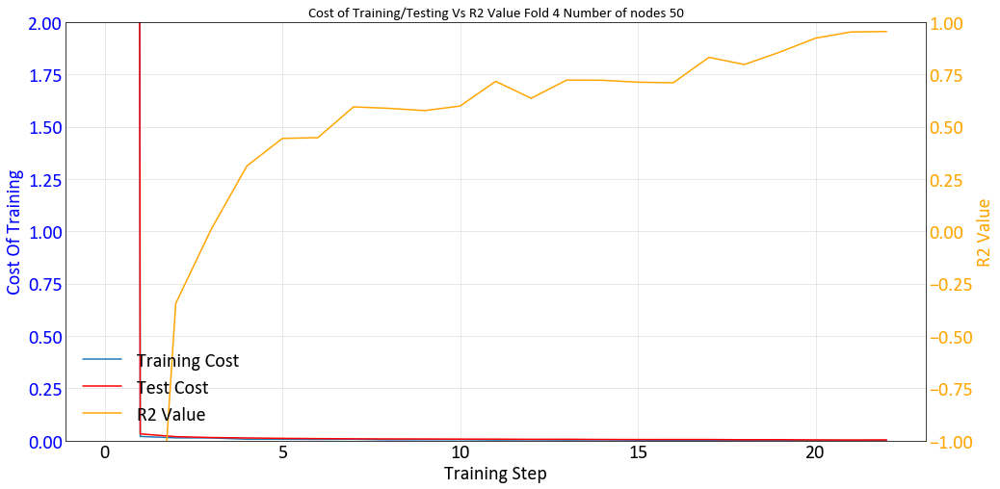

0.0085
23.9359
5
Working on Node 20 fold 5 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp2qtn74e5', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001187554F550>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done call

Epoch: 1100/5000 err = 0.0029781549703329804
Cost_test : 0.00447057
R^2:0.8137120604515076
Epoch: 1200/5000 err = 0.0023651431780308484
Cost_test : 0.0038625568
R^2:0.7509686589241028
Epoch: 1300/5000 err = 0.0021742065669968723
Cost_test : 0.0043231803
R^2:0.8237116217613221
Epoch: 1400/5000 err = 0.002267073909752071
Cost_test : 0.0046935356
R^2:0.8444770574569702
Epoch: 1500/5000 err = 0.0017964568687602875
Cost_test : 0.0042701024
R^2:0.8500872015953065
Epoch: 1600/5000 err = 0.0016495544696226718
Cost_test : 0.0036331876
R^2:0.8994425773620605
Epoch: 1700/5000 err = 0.0011821203865110873
Cost_test : 0.003812769
R^2:0.8918872714042663
Epoch: 1800/5000 err = 0.0011710155289620162
Cost_test : 0.00419258
R^2:0.8552419424057006
Epoch: 1900/5000 err = 0.0011673976550810037
Cost_test : 0.002138331
R^2:0.8890992879867554
Epoch: 2000/5000 err = 0.0008502839365974069
Cost_test : 0.0016430648
R^2:0.8930344820022582
Epoch: 2100/5000 err = 0.0009525997564196587
Cost_test : 0.0017129615
R^2:0.9

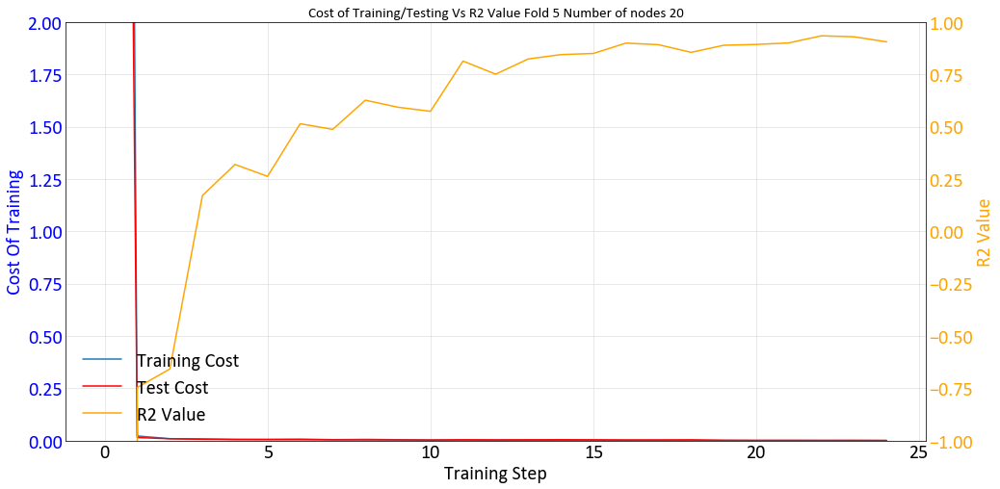

Working on Node 25 fold 5 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp26_8magk', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000011894284BE0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.002027031756006181
Cost_test : 0.0035531814
R^2:0.7434773445129395
Epoch: 1200/5000 err = 0.002272977470420301
Cost_test : 0.0035378323
R^2:0.8459760665893555
Epoch: 1300/5000 err = 0.0015722905984148384
Cost_test : 0.0037869618
R^2:0.8414711236953736
Epoch: 1400/5000 err = 0.0016131818061694502
Cost_test : 0.0034796486
R^2:0.8488417983055115
Epoch: 1500/5000 err = 0.0014351919060572984
Cost_test : 0.0030787862
R^2:0.8284057378768921
Epoch: 1600/5000 err = 0.00144445791374892
Cost_test : 0.0031511986
R^2:0.8529773354530334
Epoch: 1700/5000 err = 0.0013707595295272769
Cost_test : 0.0031265854
R^2:0.8600131273269653
Epoch: 1800/5000 err = 0.0015283531160093845
Cost_test : 0.002812519
R^2:0.8940397024154663
Epoch: 1900/5000 err = 0.0013630232657305898
Cost_test : 0.0027968949
R^2:0.9000346660614014
Epoch: 2000/5000 err = 0.0011042315280064942
Cost_test : 0.0022998014
R^2:0.8935969471931458
Epoch: 2100/5000 err = 0.0007662463816814124
Cost_test : 0.002522874
R^2:0.

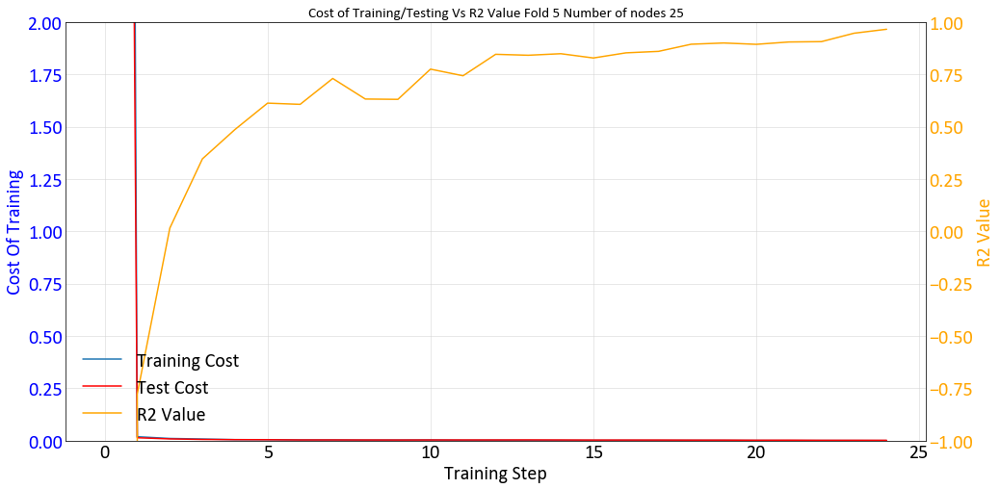

Working on Node 30 fold 5 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpj42smey3', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000011898818160>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0031413449672982093
Cost_test : 0.003381979
R^2:0.7612240791320801
Epoch: 1200/5000 err = 0.0023970072623342277
Cost_test : 0.003564709
R^2:0.7881130695343017
Epoch: 1300/5000 err = 0.002105137659236789
Cost_test : 0.004168396
R^2:0.7972941398620607
Epoch: 1400/5000 err = 0.0016737353056669232
Cost_test : 0.0044336184
R^2:0.8259601473808289
Epoch: 1500/5000 err = 0.0017996448208577932
Cost_test : 0.005364748
R^2:0.8499841213226318
Epoch: 1600/5000 err = 0.00137169569497928
Cost_test : 0.004833272
R^2:0.8626337289810181
Epoch: 1700/5000 err = 0.0014599446905776859
Cost_test : 0.0046698432
R^2:0.8573899626731872
Epoch: 1800/5000 err = 0.0012345329392701389
Cost_test : 0.0042758337
R^2:0.9118358492851257
Epoch: 1900/5000 err = 0.0016525737824849784
Cost_test : 0.0040877247
R^2:0.8939965128898619
Epoch: 2000/5000 err = 0.0010724433232098818
Cost_test : 0.0034867458
R^2:0.8753313064575194
Epoch: 2100/5000 err = 0.0007286660082172602
Cost_test : 0.0029638046
R^2:0.92

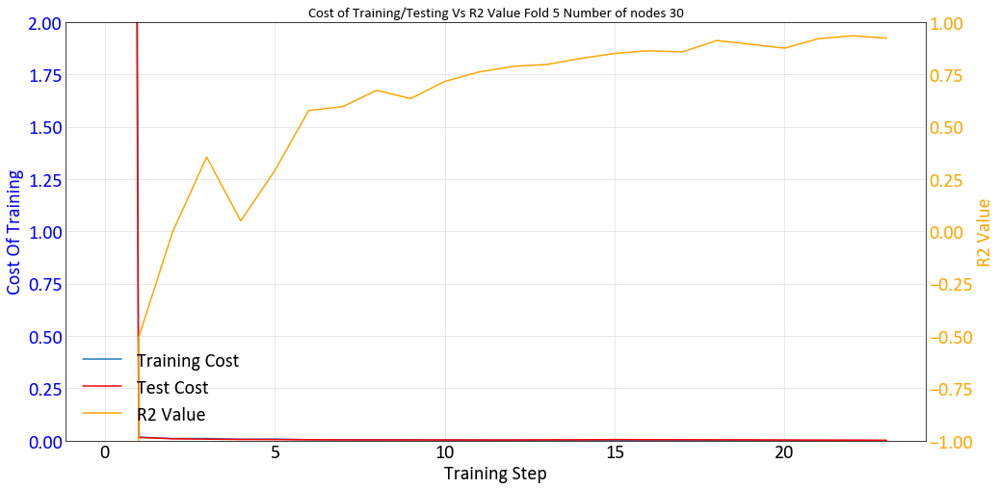

Working on Node 35 fold 5 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpnazwlret', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001188F87BDD8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.004990969272330403
Cost_test : 0.0032955431
R^2:0.5647395610809326
Epoch: 1200/5000 err = 0.002674988517537713
Cost_test : 0.0032826136
R^2:0.4469908595085144
Epoch: 1300/5000 err = 0.004703881219029427
Cost_test : 0.0034027179
R^2:0.6969777822494507
Epoch: 1400/5000 err = 0.0033340185414999723
Cost_test : 0.0035293598
R^2:0.6606365323066712
Epoch: 1500/5000 err = 0.0028035421855747695
Cost_test : 0.0036148452
R^2:0.8056381702423095
Epoch: 1600/5000 err = 0.002727958164177835
Cost_test : 0.0038520163
R^2:0.7238463878631591
Epoch: 1700/5000 err = 0.003100764192640781
Cost_test : 0.003894132
R^2:0.7211920261383057
Epoch: 1800/5000 err = 0.0018655875930562614
Cost_test : 0.004096228
R^2:0.8198011875152588
Epoch: 1900/5000 err = 0.0022633180487900972
Cost_test : 0.0041541485
R^2:0.8534415364265443
Epoch: 2000/5000 err = 0.002177213993854821
Cost_test : 0.0034978697
R^2:0.8662444949150085
Epoch: 2100/5000 err = 0.0016082364018075168
Cost_test : 0.0034128516
R^2:0.88

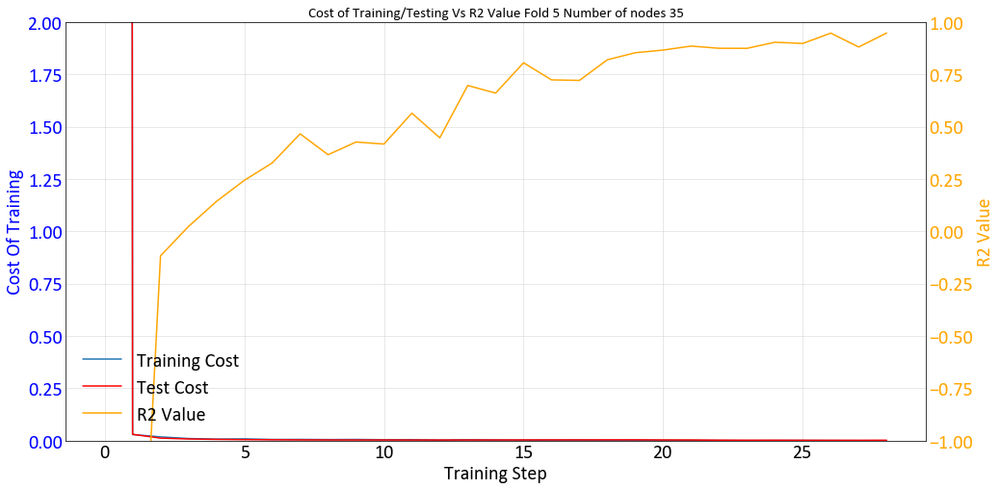

Working on Node 50 fold 5 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpqdpasd2b', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000011870EC8550>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

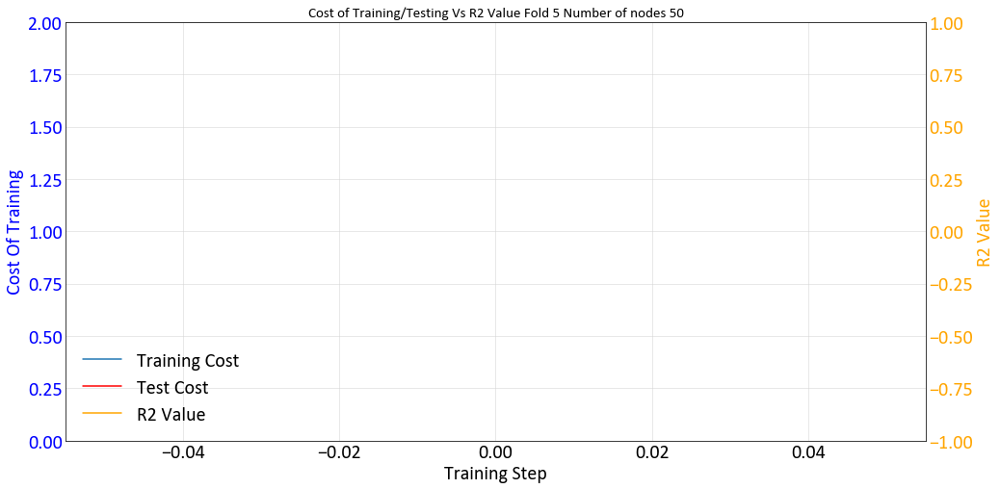

0.0065
31.1615
6
Working on Node 20 fold 6 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpwogcyrf3', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001189501D6D8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done call

Epoch: 1100/5000 err = 0.0031165855238214136
Cost_test : 0.006895049
R^2:0.5297375321388245
Epoch: 1200/5000 err = 0.0018858540803194045
Cost_test : 0.0073654414
R^2:0.508699905872345
Epoch: 1300/5000 err = 0.0023976742639206347
Cost_test : 0.006325264
R^2:0.3735246181488037
Epoch: 1400/5000 err = 0.0022944084834307433
Cost_test : 0.0061079934
R^2:0.5481719732284546
Epoch: 1500/5000 err = 0.0030008726520463825
Cost_test : 0.0054234685
R^2:0.5687121272087098
Epoch: 1600/5000 err = 0.003494947170838714
Cost_test : 0.00574677
R^2:0.47892013788223264
Epoch: 1700/5000 err = 0.0016313080443069337
Cost_test : 0.00597216
R^2:0.5578120946884155
Epoch: 1800/5000 err = 0.0019098661723546684
Cost_test : 0.004411478
R^2:0.6080781936645507
Epoch: 1900/5000 err = 0.0018748117610812185
Cost_test : 0.004246783
R^2:0.6798702836036681
Epoch: 2000/5000 err = 0.0014730014256201685
Cost_test : 0.0039443816
R^2:0.658120083808899
Epoch: 2100/5000 err = 0.0023100765654817225
Cost_test : 0.0044522383
R^2:0.6152

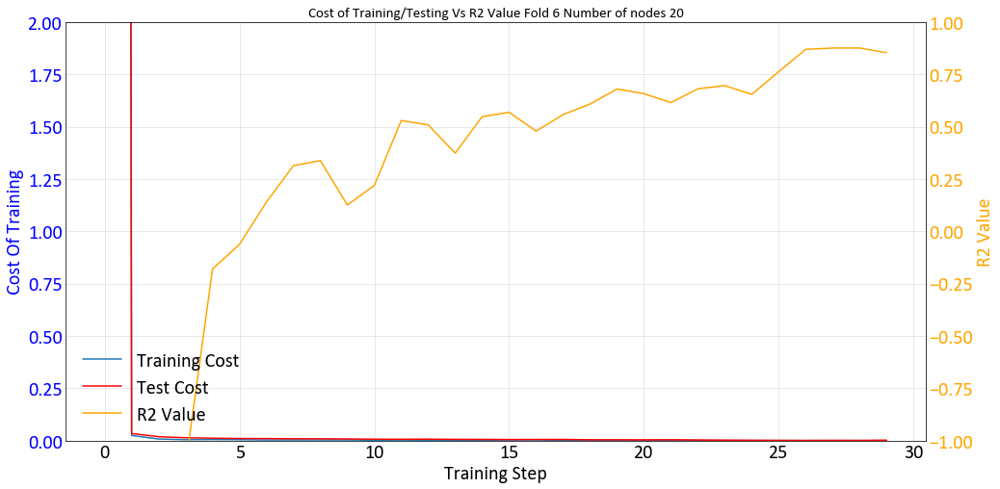

Working on Node 25 fold 6 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpkip2patd', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001188F847940>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.001097679673694074
Cost_test : 0.0039688214
R^2:0.6489372611045837
Epoch: 1200/5000 err = 0.0008935421297792347
Cost_test : 0.0030988709
R^2:0.7547365307807923
Epoch: 1300/5000 err = 0.0008344957022927701
Cost_test : 0.003172797
R^2:0.5580658912658691
Epoch: 1400/5000 err = 0.0009594158502295614
Cost_test : 0.0021729667
R^2:0.7568429708480835
Epoch: 1500/5000 err = 0.00091731550055556
Cost_test : 0.0018399577
R^2:0.7864161372184754
Epoch: 1600/5000 err = 0.0008246201323345305
Cost_test : 0.001726712
R^2:0.8640846490859986
Epoch: 1700/5000 err = 0.0006051288859453052
Cost_test : 0.0018726332
R^2:0.8824841380119324
Epoch: 1800/5000 err = 0.0007370139937847853
Cost_test : 0.0015988613
R^2:0.495372200012207
Epoch: 1900/5000 err = 0.0004399585712235421
Cost_test : 0.0016626354
R^2:0.8704054117202757
Epoch: 2000/5000 err = 0.00043044252088293434
Cost_test : 0.0019956823
R^2:0.8747689843177795
Epoch: 2100/5000 err = 0.0005174278921913356
Cost_test : 0.0020948981
R^2:0

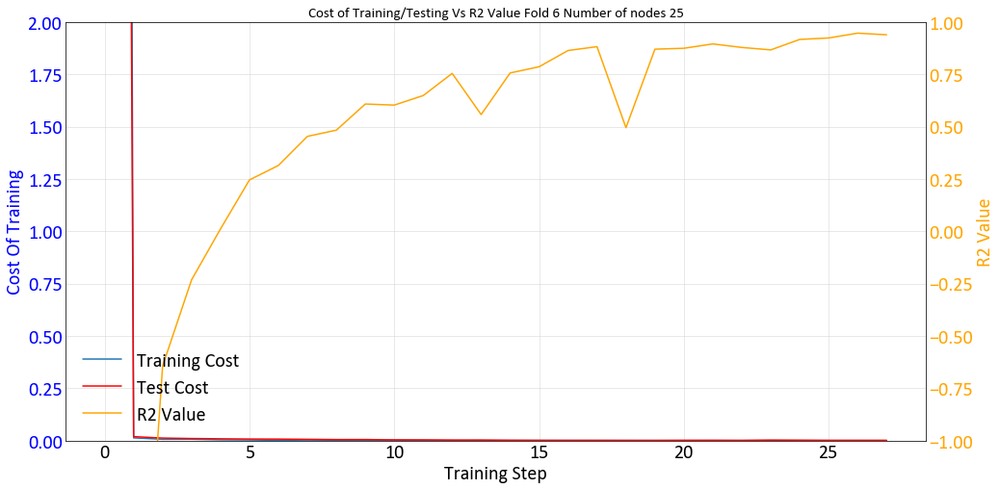

Working on Node 30 fold 6 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpzfle5zs3', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001188DAC5E48>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0037269714754074815
Cost_test : 0.0045601674
R^2:0.5849047541618347
Epoch: 1200/5000 err = 0.001307791331782937
Cost_test : 0.004305404
R^2:0.6456896066665649
Epoch: 1300/5000 err = 0.0021796162240207196
Cost_test : 0.003346607
R^2:0.6287813425064087
Epoch: 1400/5000 err = 0.0017818434513173997
Cost_test : 0.0029862283
R^2:0.6843079209327698
Epoch: 1500/5000 err = 0.0014856460969895125
Cost_test : 0.0027081892
R^2:0.7198823094367981
Epoch: 1600/5000 err = 0.0008219013456255197
Cost_test : 0.0024031673
R^2:0.6998059988021851
Epoch: 1700/5000 err = 0.0009183075162582099
Cost_test : 0.0021241799
R^2:0.7278933763504029
Epoch: 1800/5000 err = 0.0006084935273975135
Cost_test : 0.0019650613
R^2:0.8065314769744873
Epoch: 1900/5000 err = 0.0006852418242488056
Cost_test : 0.002268819
R^2:0.8405308604240417
Epoch: 2000/5000 err = 0.0008064913214184344
Cost_test : 0.0021070528
R^2:0.8584952592849731
Epoch: 2100/5000 err = 0.000569700903724879
Cost_test : 0.0022084191
R^2:0

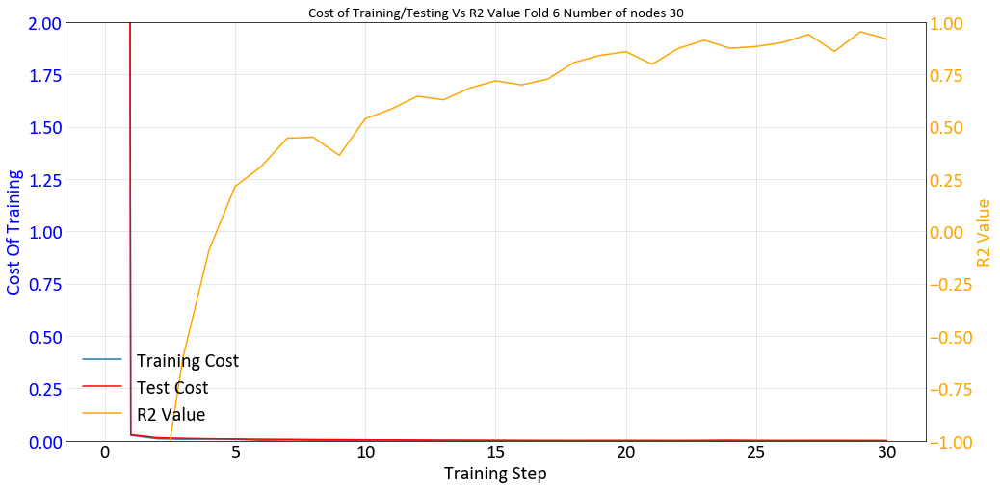

Working on Node 35 fold 6 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpiv2kmrwb', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001188F810828>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0005947783472947776
Cost_test : 0.0015774579
R^2:0.8772829413414003
Epoch: 1200/5000 err = 0.0005278442054986953
Cost_test : 0.0012916982
R^2:0.8751871347427368
Epoch: 1300/5000 err = 0.0004230267310049385
Cost_test : 0.0016364922
R^2:0.8832022786140442
Epoch: 1400/5000 err = 0.0003265496634412557
Cost_test : 0.0012771632
R^2:0.9201560020446777
Epoch: 1500/5000 err = 0.0003597256174543873
Cost_test : 0.0016067785
R^2:0.91878981590271
Epoch: 1600/5000 err = 0.00036431796033866706
Cost_test : 0.0015627451
R^2:0.9134516358375548
End of learning process
Final epoch = 1679/5000 
Final error = 0.00026114171196240933
Final R^2 = 0.9774889588356019
[[2.00000000e+01 3.78576562e-01 0.00000000e+00 1.29884187e+00
  6.12113338e+00 0.00000000e+00 3.55039153e-04 3.90246248e+02]
 [2.50000000e+01 7.68670383e-01 0.00000000e+00 1.04157983e+00
  7.48809978e+00 0.00000000e+00 1.95764998e-04 4.26625612e+02]
 [3.00000000e+01 6.10042468e-01 0.00000000e+00 1.25648775e+00
  8.41634538e+

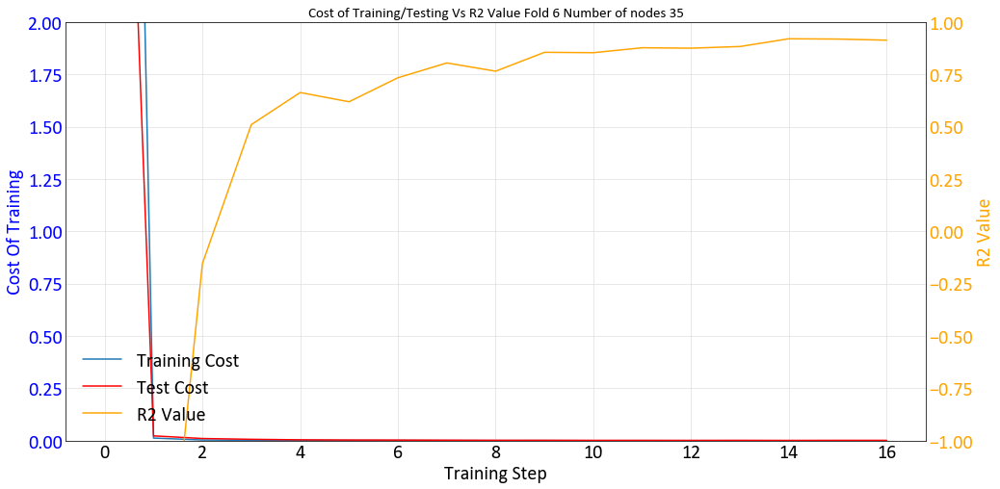

Working on Node 50 fold 6 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp5ywvpgeh', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001188F821080>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0007470222946722061
Cost_test : 0.002282888
R^2:0.8198708176612854
Epoch: 1200/5000 err = 0.0004343289590906352
Cost_test : 0.0020042888
R^2:0.8477444171905517
Epoch: 1300/5000 err = 0.000653352151857689
Cost_test : 0.0022488534
R^2:0.8207119703292847
Epoch: 1400/5000 err = 0.0005975641775876283
Cost_test : 0.0017546546
R^2:0.8170464992523192
Epoch: 1500/5000 err = 0.0002909511502366513
Cost_test : 0.0016748644
R^2:0.9103180885314941
Epoch: 1600/5000 err = 0.0003637003945186734
Cost_test : 0.0015965591
R^2:0.8476541757583618
Epoch: 1700/5000 err = 0.0004403492144774645
Cost_test : 0.001186407
R^2:0.9371104598045349
Epoch: 1800/5000 err = 0.00044836500892415644
Cost_test : 0.0012110726
R^2:0.8720303297042846
Epoch: 1900/5000 err = 0.00032099871314130726
Cost_test : 0.0015944
R^2:0.9403415560722351
Epoch: 2000/5000 err = 0.0002869542106054723
Cost_test : 0.0014207509
R^2:0.9148314237594604
Epoch: 2100/5000 err = 0.00026336040755268184
Cost_test : 0.0014095542
R^2

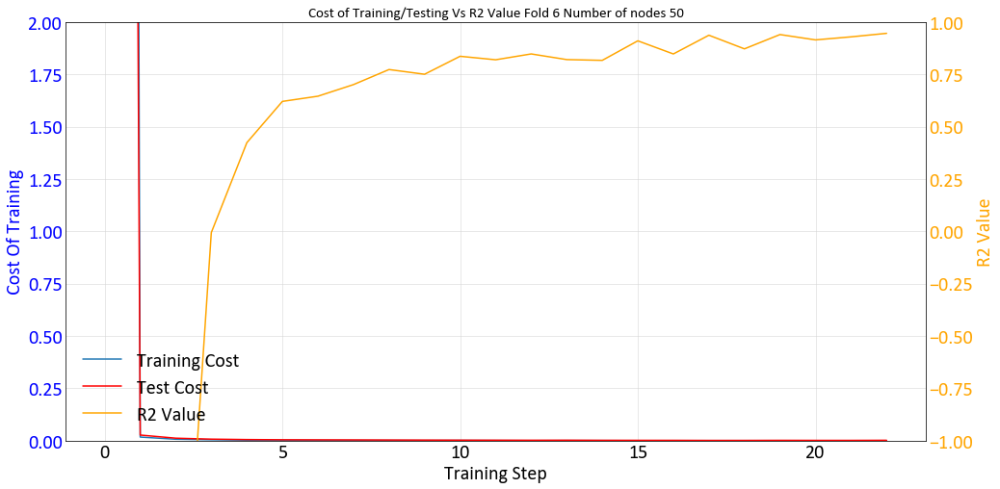

0.0066
35.7032
7
Working on Node 20 fold 7 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpryn0aelq', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000118928A33C8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done call

Epoch: 1100/5000 err = 0.0017221768503077328
Cost_test : 0.01345527
R^2:0.36246203184127807
Epoch: 1200/5000 err = 0.0016134613426402212
Cost_test : 0.012095665
R^2:0.3603630661964417
Epoch: 1300/5000 err = 0.000950279110111296
Cost_test : 0.012222129
R^2:0.5639435291290283
Epoch: 1400/5000 err = 0.0008640323416329921
Cost_test : 0.011846379
R^2:0.45718492269516
Epoch: 1500/5000 err = 0.0010760234436020255
Cost_test : 0.01098373
R^2:0.5689578413963318
Epoch: 1600/5000 err = 0.001183676323853433
Cost_test : 0.010204102
R^2:0.5852277755737305
Epoch: 1700/5000 err = 0.001119961345102638
Cost_test : 0.008481524
R^2:0.6911991715431214
Epoch: 1800/5000 err = 0.0006944799446500838
Cost_test : 0.008044655
R^2:0.6699858903884888
Epoch: 1900/5000 err = 0.0009486819850280882
Cost_test : 0.006913007
R^2:0.7702977299690246
Epoch: 2000/5000 err = 0.0007160670182202012
Cost_test : 0.0069459346
R^2:0.7158647537231445
Epoch: 2100/5000 err = 0.00042644185596145694
Cost_test : 0.006472251
R^2:0.829722487

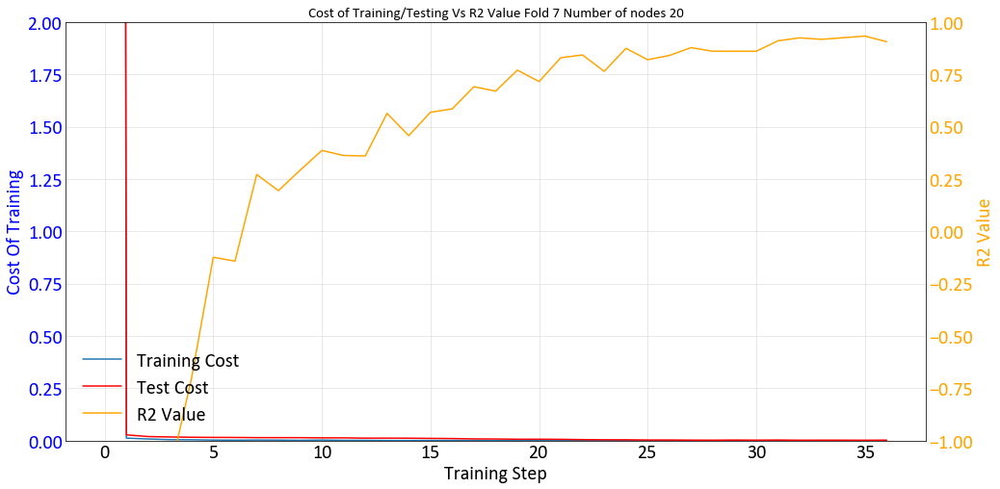

Working on Node 25 fold 7 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp__8r_rdj', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000011818335048>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0010455480427481235
Cost_test : 0.009148849
R^2:0.6306243538856507
Epoch: 1200/5000 err = 0.0007668233825825155
Cost_test : 0.008175111
R^2:0.5269142389297485
Epoch: 1300/5000 err = 0.0007331705011893063
Cost_test : 0.007281822
R^2:0.7128036618232727
Epoch: 1400/5000 err = 0.0004693961120210588
Cost_test : 0.00679458
R^2:0.6629496812820435
Epoch: 1500/5000 err = 0.000579262588871643
Cost_test : 0.006912432
R^2:0.7536895036697389
Epoch: 1600/5000 err = 0.0006527921126689761
Cost_test : 0.0055214153
R^2:0.8639405250549317
Epoch: 1700/5000 err = 0.0006518941663671285
Cost_test : 0.004969865
R^2:0.8911676526069641
Epoch: 1800/5000 err = 0.00038123786798678334
Cost_test : 0.0050361524
R^2:0.9156501293182373
Epoch: 1900/5000 err = 0.00042088032932952046
Cost_test : 0.00423264
R^2:0.8607235908508302
Epoch: 2000/5000 err = 0.0003807780973147601
Cost_test : 0.0038879472
R^2:0.8579419732093811
Epoch: 2100/5000 err = 0.0004106363747268916
Cost_test : 0.003942664
R^2:0.793

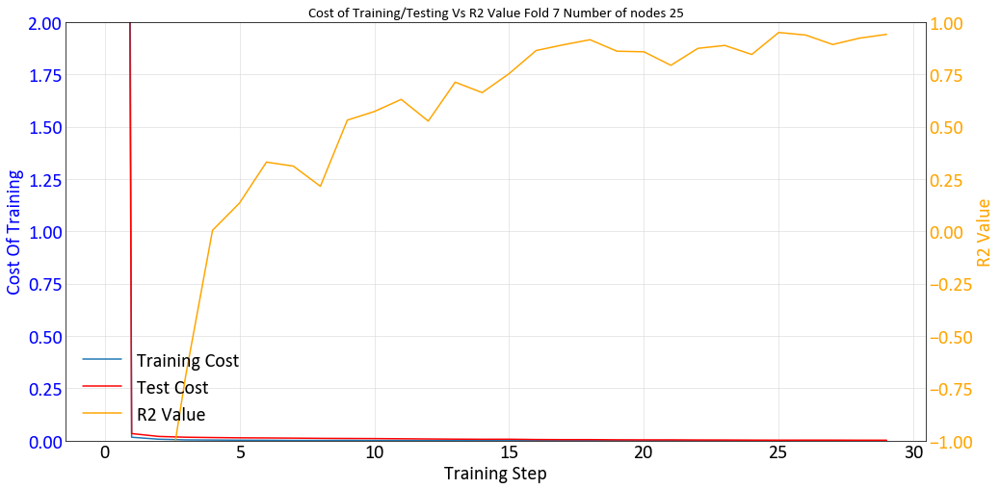

Working on Node 30 fold 7 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpt1d4vcpm', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001188D3C1780>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0004267794196493924
Cost_test : 0.006635751
R^2:0.8358209013938904
Epoch: 1200/5000 err = 0.0005192852579057217
Cost_test : 0.005991572
R^2:0.8201383948326111
Epoch: 1300/5000 err = 0.0004243860719725489
Cost_test : 0.005756938
R^2:0.8431352734565734
Epoch: 1400/5000 err = 0.00038970346795395015
Cost_test : 0.0056438097
R^2:0.8407660961151122
Epoch: 1500/5000 err = 0.0004015224345494062
Cost_test : 0.0046850643
R^2:0.8755017399787903
Epoch: 1600/5000 err = 0.0003156470862450078
Cost_test : 0.004614069
R^2:0.8391231417655944
Epoch: 1700/5000 err = 0.00039742829976603384
Cost_test : 0.0043204133
R^2:0.8490441083908081
Epoch: 1800/5000 err = 0.0004366075270809234
Cost_test : 0.0045369836
R^2:0.8528559684753417
Epoch: 1900/5000 err = 0.00022109731507953257
Cost_test : 0.003446601
R^2:0.9027305722236634
Epoch: 2000/5000 err = 0.00038261317531578247
Cost_test : 0.0040006917
R^2:0.821975588798523
Epoch: 2100/5000 err = 0.0003815772768575698
Cost_test : 0.003451253
R^2

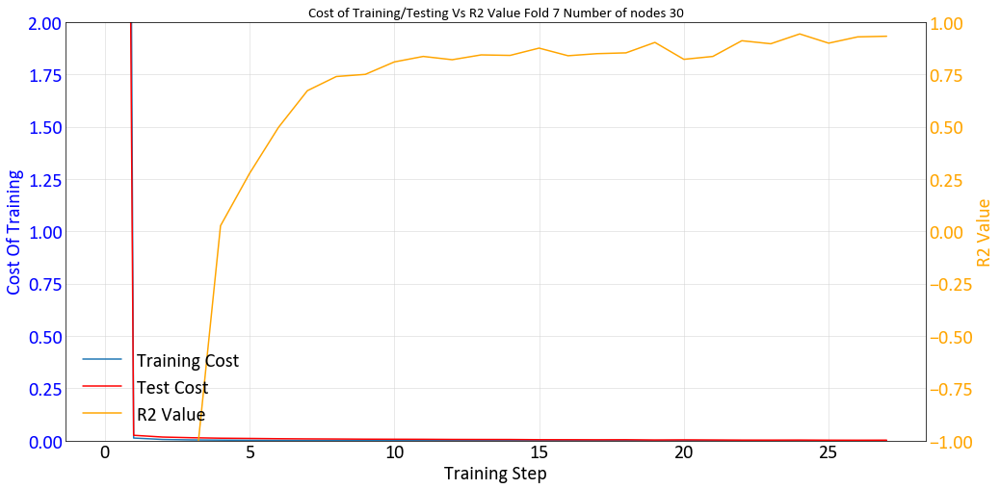

Working on Node 35 fold 7 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpjz26f1v9', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000118922E7080>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0006153431255370378
Cost_test : 0.0058645587
R^2:0.866545283794403
Epoch: 1200/5000 err = 0.0005739961517974734
Cost_test : 0.005745106
R^2:0.8200049757957457
Epoch: 1300/5000 err = 0.000440535374218598
Cost_test : 0.005419452
R^2:0.8804242610931396
Epoch: 1400/5000 err = 0.000363677999121137
Cost_test : 0.005334715
R^2:0.9044271349906922
Epoch: 1500/5000 err = 0.0004028906871099025
Cost_test : 0.004946746
R^2:0.8275742053985596
Epoch: 1600/5000 err = 0.0003935751912649721
Cost_test : 0.004530959
R^2:0.8957765340805054
Epoch: 1700/5000 err = 0.00024340787495020778
Cost_test : 0.004369278
R^2:0.8662089467048645
Epoch: 1800/5000 err = 0.0002656545781064779
Cost_test : 0.0042076134
R^2:0.9128176927566529
Epoch: 1900/5000 err = 0.00021177918533794583
Cost_test : 0.0033423114
R^2:0.8571724772453309
Epoch: 2000/5000 err = 0.00023748621169943364
Cost_test : 0.0031649175
R^2:0.9530376076698304
Epoch: 2100/5000 err = 0.00025306363531854006
Cost_test : 0.0031214259
R^2:0

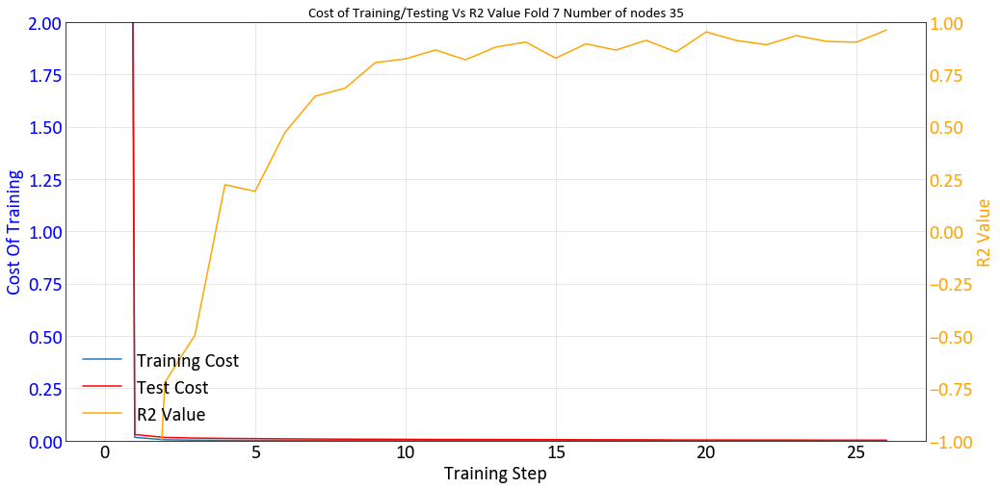

Working on Node 50 fold 7 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp4r1rnktm', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001188D610278>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0008530657563824207
Cost_test : 0.008085337
R^2:0.720874834060669
Epoch: 1200/5000 err = 0.0010166242835111916
Cost_test : 0.0072634337
R^2:0.7418373465538026
Epoch: 1300/5000 err = 0.0006957076024264097
Cost_test : 0.0074583692
R^2:0.7998020052909851
Epoch: 1400/5000 err = 0.0006525605102069675
Cost_test : 0.0069004027
R^2:0.7997503399848939
Epoch: 1500/5000 err = 0.0003947979712393135
Cost_test : 0.0064298566
R^2:0.8480079054832459
Epoch: 1600/5000 err = 0.000445283405133523
Cost_test : 0.0065166433
R^2:0.8357778906822204
Epoch: 1700/5000 err = 0.0005752504715928808
Cost_test : 0.0058083725
R^2:0.903058636188507
Epoch: 1800/5000 err = 0.00046284176642075186
Cost_test : 0.0053112316
R^2:0.8668510198593139
Epoch: 1900/5000 err = 0.0003543106839060783
Cost_test : 0.0066941557
R^2:0.8649233937263489
Epoch: 2000/5000 err = 0.0003728273091837764
Cost_test : 0.0059057493
R^2:0.8040987372398377
Epoch: 2100/5000 err = 0.00030066144245211035
Cost_test : 0.0053171646
R^

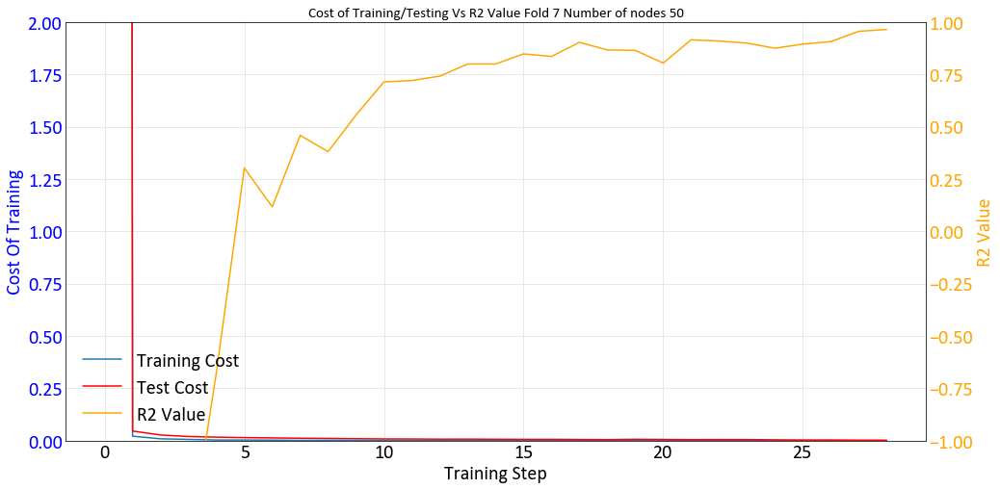

0.0099
37.5183
8
Working on Node 20 fold 8 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp_0d_q54m', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000118206A29E8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done call

Epoch: 1100/5000 err = 0.0010693065240047872
Cost_test : 0.0120602995
R^2:0.545677888393402
Epoch: 1200/5000 err = 0.0008679076679982245
Cost_test : 0.011211434
R^2:0.5058800578117371
Epoch: 1300/5000 err = 0.0008992674876935779
Cost_test : 0.012745331
R^2:0.5666325330734253
Epoch: 1400/5000 err = 0.0008006684016436339
Cost_test : 0.011950435
R^2:0.6395885229110718
Epoch: 1500/5000 err = 0.0008737332420423627
Cost_test : 0.011906675
R^2:0.6852554321289063
Epoch: 1600/5000 err = 0.000866894464707002
Cost_test : 0.010268892
R^2:0.6884247064590454
Epoch: 1700/5000 err = 0.0005942485993728041
Cost_test : 0.011939937
R^2:0.6781410217285155
Epoch: 1800/5000 err = 0.0007226597110275178
Cost_test : 0.010609646
R^2:0.7202928900718689
Epoch: 1900/5000 err = 0.0004926053283270449
Cost_test : 0.011787257
R^2:0.714795184135437
Epoch: 2000/5000 err = 0.0006398590106982738
Cost_test : 0.010366095
R^2:0.7198792219161988
Epoch: 2100/5000 err = 0.0005829480825923384
Cost_test : 0.010037421
R^2:0.6660519

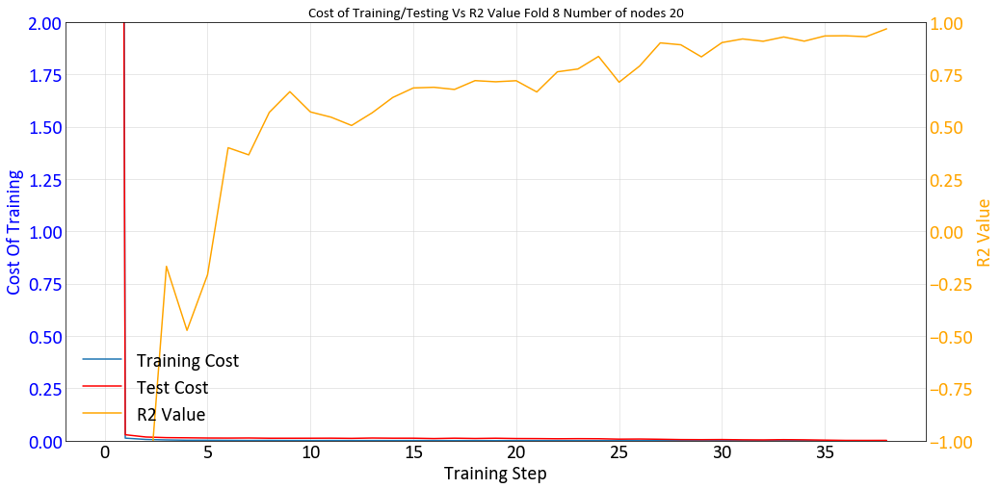

Working on Node 25 fold 8 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpqaujt914', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000011820B8C5C0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0005651760322507471
Cost_test : 0.009452399
R^2:0.6402180910110474
Epoch: 1200/5000 err = 0.0005026974075008183
Cost_test : 0.009141535
R^2:0.7635547041893005
Epoch: 1300/5000 err = 0.0005790433380752801
Cost_test : 0.008209833
R^2:0.7706629991531372
Epoch: 1400/5000 err = 0.0006688081950414926
Cost_test : 0.007989197
R^2:0.7868920564651489
Epoch: 1500/5000 err = 0.0004732230852823704
Cost_test : 0.007492387
R^2:0.7505102038383484
Epoch: 1600/5000 err = 0.0003300535492599011
Cost_test : 0.007282497
R^2:0.8520483255386353
Epoch: 1700/5000 err = 0.000395349389873445
Cost_test : 0.0064257043
R^2:0.8597214221954346
Epoch: 1800/5000 err = 0.0004323982837377116
Cost_test : 0.006780071
R^2:0.7954245090484618
Epoch: 1900/5000 err = 0.0002678669843589887
Cost_test : 0.0061866115
R^2:0.8198736071586609
Epoch: 2000/5000 err = 0.0003338746028020978
Cost_test : 0.0058380845
R^2:0.8946481823921204
Epoch: 2100/5000 err = 0.0002456840156810358
Cost_test : 0.0059001027
R^2:0.89

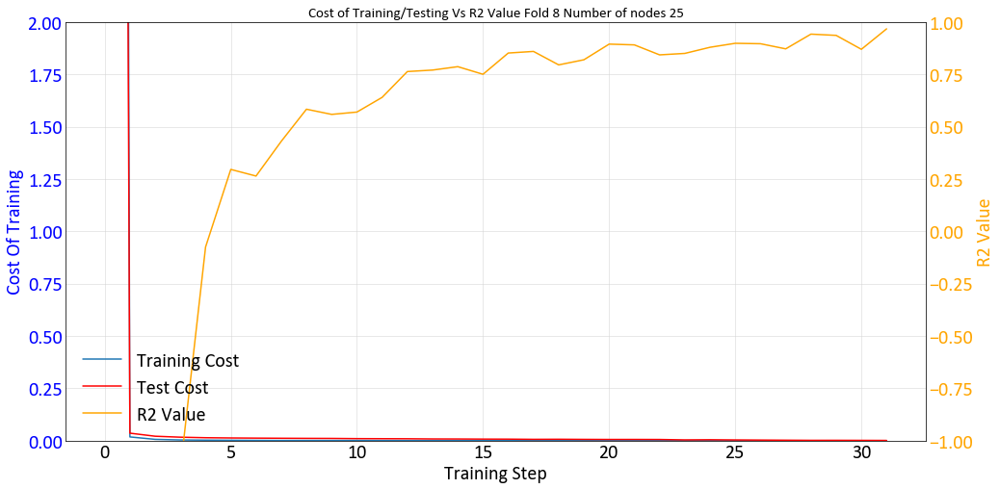

Working on Node 30 fold 8 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpg8t880lk', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001188FBA0DD8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0006710343528538943
Cost_test : 0.009849531
R^2:0.6564809322357178
Epoch: 1200/5000 err = 0.0005306126084178686
Cost_test : 0.009154896
R^2:0.7672292947769165
Epoch: 1300/5000 err = 0.0004585830261930823
Cost_test : 0.008311422
R^2:0.8227162480354309
Epoch: 1400/5000 err = 0.0003830601490335539
Cost_test : 0.007810787
R^2:0.799275541305542
Epoch: 1500/5000 err = 0.0003890288295224309
Cost_test : 0.0076089646
R^2:0.8430398464202881
Epoch: 1600/5000 err = 0.00046023824543226514
Cost_test : 0.0071924096
R^2:0.7981562495231629
Epoch: 1700/5000 err = 0.0002379751647822559
Cost_test : 0.0070617837
R^2:0.8476637244224549
Epoch: 1800/5000 err = 0.0002825159055646509
Cost_test : 0.007258075
R^2:0.8553235054016114
Epoch: 1900/5000 err = 0.00035359703761059794
Cost_test : 0.0070530525
R^2:0.8444463968276977
Epoch: 2000/5000 err = 0.00034110997512470925
Cost_test : 0.0066032545
R^2:0.8391906142234803
Epoch: 2100/5000 err = 0.00035943925031460826
Cost_test : 0.0064152614
R^

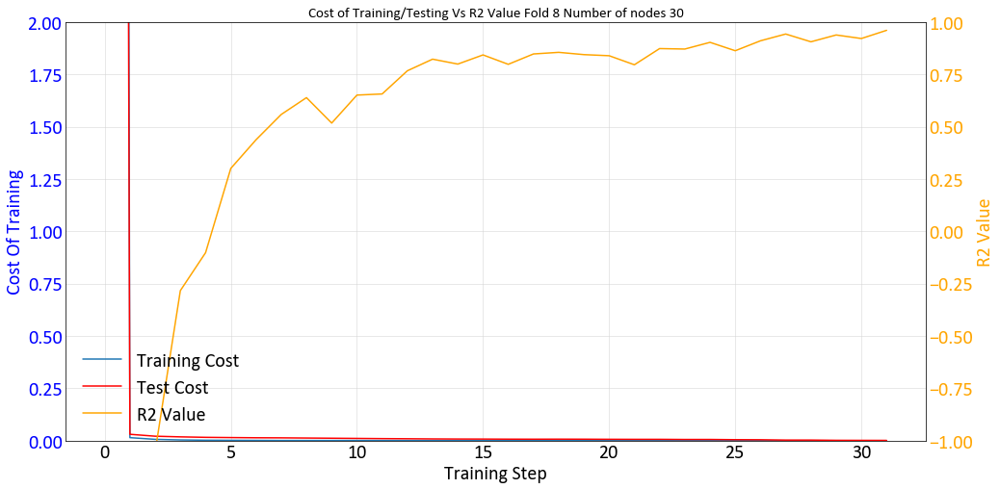

Working on Node 35 fold 8 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmps2oq70sg', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000011870E5D5C0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.00035971328616142274
Cost_test : 0.0077118925
R^2:0.8136215806007386
Epoch: 1200/5000 err = 0.00028869740199297664
Cost_test : 0.007351913
R^2:0.8887165307998657
Epoch: 1300/5000 err = 0.0003339902323205024
Cost_test : 0.0067847217
R^2:0.8325700521469117
Epoch: 1400/5000 err = 0.00036156743299216033
Cost_test : 0.006840496
R^2:0.8827158212661744
Epoch: 1500/5000 err = 0.000254251083242707
Cost_test : 0.0068880175
R^2:0.8897919297218323
Epoch: 1600/5000 err = 0.0002534283674322069
Cost_test : 0.006472177
R^2:0.8941688895225525
Epoch: 1700/5000 err = 0.0002685327897779643
Cost_test : 0.006270377
R^2:0.9193547368049622
Epoch: 1800/5000 err = 0.0002969915803987533
Cost_test : 0.0061808634
R^2:0.9233204960823059
Epoch: 1900/5000 err = 0.00028073787398170675
Cost_test : 0.005509341
R^2:0.9074215531349182
Epoch: 2000/5000 err = 0.00017419011564925312
Cost_test : 0.004845249
R^2:0.9077734470367432
Epoch: 2100/5000 err = 0.0003051204883377068
Cost_test : 0.004979191
R^2

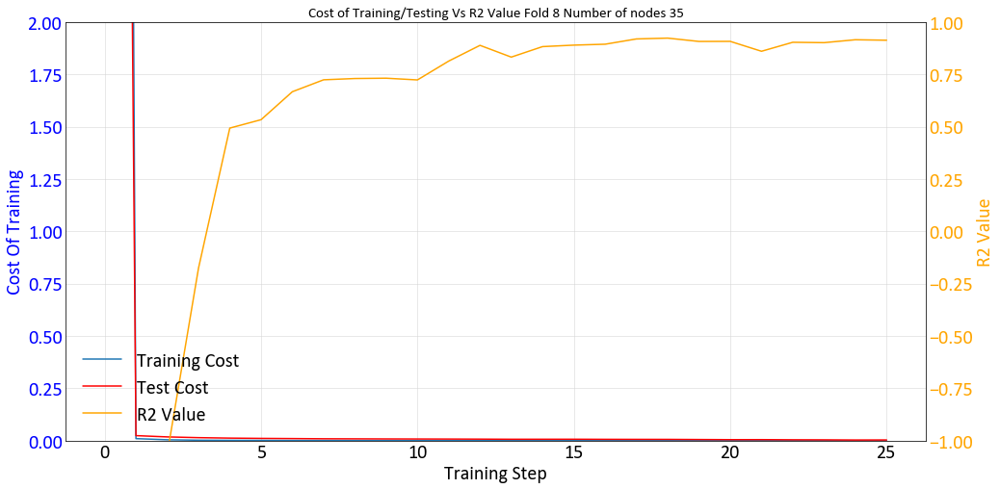

Working on Node 50 fold 8 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp73zt1fma', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001189425DE48>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.00010682843858376146
Cost_test : 0.0052350876
R^2:0.9333158135414124
Epoch: 1200/5000 err = 0.00014059168315725402
Cost_test : 0.0047805244
R^2:0.9234743237495422
Epoch: 1300/5000 err = 0.00014570539206033574
Cost_test : 0.004727678
R^2:0.8824257850646973
Epoch: 1400/5000 err = 0.00036903918953612447
Cost_test : 0.0047421
R^2:0.8561504960060119
Epoch: 1500/5000 err = 0.00010690751223592089
Cost_test : 0.0038386947
R^2:0.9264021873474122
Epoch: 1600/5000 err = 0.00015008291375124828
Cost_test : 0.0038715014
R^2:0.948959219455719
Epoch: 1700/5000 err = 9.962531912606209e-05
Cost_test : 0.003424525
R^2:0.9425207018852234
Epoch: 1800/5000 err = 0.00011668572115013378
Cost_test : 0.0029783505
R^2:0.951289963722229
End of learning process
Final epoch = 1802/5000 
Final error = 8.374333410756662e-05
Final R^2 = 0.9714123487472535
[[2.00000000e+01 5.66114225e-01 0.00000000e+00 1.20486169e+00
  5.98668618e+00 0.00000000e+00 9.83799160e-05 4.93430296e+02]
 [2.50000000e+0

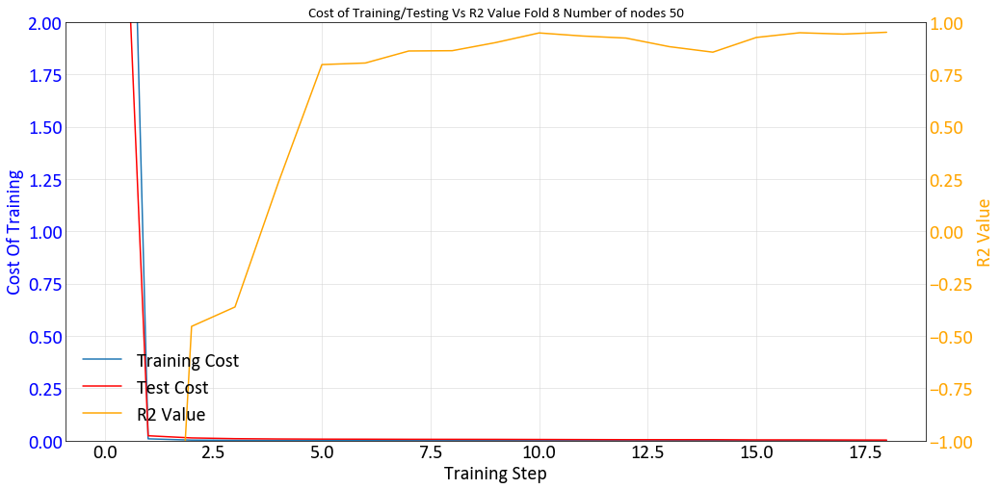

0.0226
33.1339
9
Working on Node 20 fold 9 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp19y4qyqo', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000011870E31860>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done call

Epoch: 1100/5000 err = 0.0034783786628395322
Cost_test : 0.0045533264
R^2:0.3718653678894043
Epoch: 1200/5000 err = 0.0017701697535812857
Cost_test : 0.0044927597
R^2:-0.16161779165267945
Epoch: 1300/5000 err = 0.002679601381532848
Cost_test : 0.003337108
R^2:0.2272930383682251
Epoch: 1400/5000 err = 0.0036105262115597725
Cost_test : 0.004900201
R^2:0.7498014569282532
Epoch: 1500/5000 err = 0.001471244404092431
Cost_test : 0.002670502
R^2:0.5254483461380004
Epoch: 1600/5000 err = 0.0011585389729589224
Cost_test : 0.0027934585
R^2:0.6728188872337342
Epoch: 1700/5000 err = 0.0011956398491747677
Cost_test : 0.001510871
R^2:0.5374813556671143
Epoch: 1800/5000 err = 0.001172314479481429
Cost_test : 0.0016255836
R^2:0.6549593329429626
Epoch: 1900/5000 err = 0.0010667850496247412
Cost_test : 0.0012633682
R^2:0.7703670024871826
Epoch: 2000/5000 err = 0.001205753831891343
Cost_test : 0.0012381582
R^2:0.8130504727363587
Epoch: 2100/5000 err = 0.0007285381085239351
Cost_test : 0.001126024
R^2:0.8

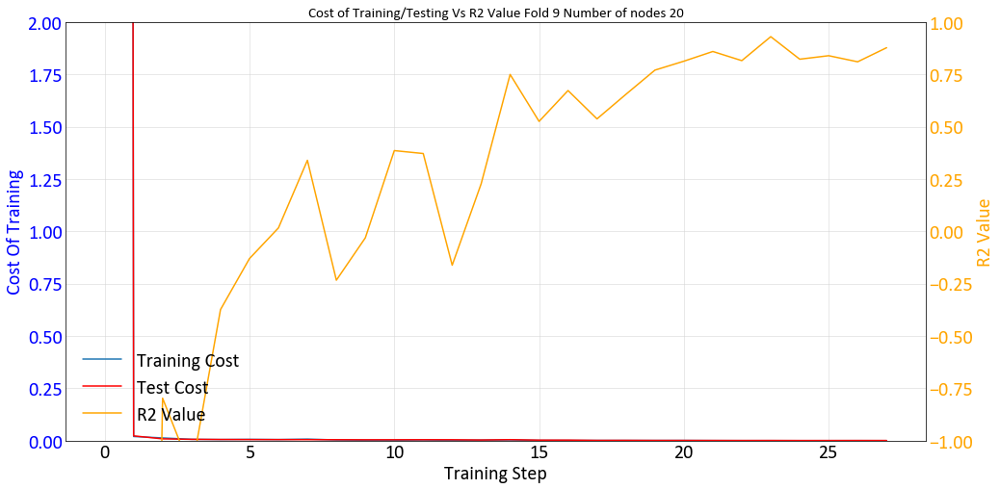

Working on Node 25 fold 9 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpr4ccs2a_', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000011870D57DD8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0016058105742558836
Cost_test : 0.002717048
R^2:0.37003241777420043
Epoch: 1200/5000 err = 0.0014187308726832269
Cost_test : 0.0024285535
R^2:0.5492393851280213
Epoch: 1300/5000 err = 0.0014440726488828659
Cost_test : 0.0034853837
R^2:0.713535177707672
Epoch: 1400/5000 err = 0.0011985932826064525
Cost_test : 0.0023116735
R^2:0.6485535860061645
Epoch: 1500/5000 err = 0.0007010918809100986
Cost_test : 0.002073734
R^2:0.6862269043922425
Epoch: 1600/5000 err = 0.0013082448102068158
Cost_test : 0.0022486174
R^2:0.7767927527427674
Epoch: 1700/5000 err = 0.001168302120640874
Cost_test : 0.0012214981
R^2:0.7613781571388245
Epoch: 1800/5000 err = 0.00047093011380638927
Cost_test : 0.0010475948
R^2:0.8280780911445617
Epoch: 1900/5000 err = 0.0006987488712184131
Cost_test : 0.0009926247
R^2:0.8864111781120301
Epoch: 2000/5000 err = 0.0004951992304995656
Cost_test : 0.00070053886
R^2:0.8996816039085388
Epoch: 2100/5000 err = 0.00033933373633772136
Cost_test : 0.00058018434

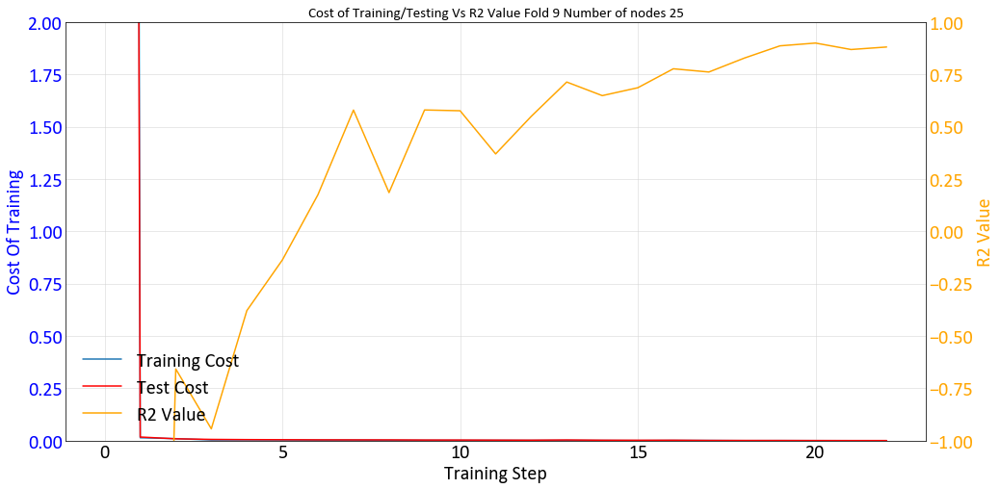

Working on Node 30 fold 9 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmptx188cke', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001189224D780>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0013131151557900012
Cost_test : 0.0014340659
R^2:0.8764989137649536
Epoch: 1200/5000 err = 0.0006998848577495665
Cost_test : 0.0010103859
R^2:0.6664395689964293
Epoch: 1300/5000 err = 0.000388627519714646
Cost_test : 0.0015232934
R^2:0.8837588787078857
Epoch: 1400/5000 err = 0.0005520519363926724
Cost_test : 0.0010087873
R^2:0.8697105169296264
Epoch: 1500/5000 err = 0.00021568688680417836
Cost_test : 0.0006958374
R^2:0.8489109992980957
Epoch: 1600/5000 err = 0.00026757282321341334
Cost_test : 0.0005670706
R^2:0.9063348412513732
Epoch: 1700/5000 err = 0.0002601362997666001
Cost_test : 0.0006236453
R^2:0.9572903275489806
End of learning process
Final epoch = 1739/5000 
Final error = 0.0002025177323957905
Final R^2 = 0.9802937746047975
[[2.00000000e+01 2.94546262e-01 0.00000000e+00 1.24405708e+00
  4.82132690e+00 0.00000000e+00 2.87964274e-04 3.53792928e+02]
 [2.50000000e+01 5.42860357e-01 0.00000000e+00 9.92688592e-01
  5.19468518e+00 0.00000000e+00 3.47506543e-0

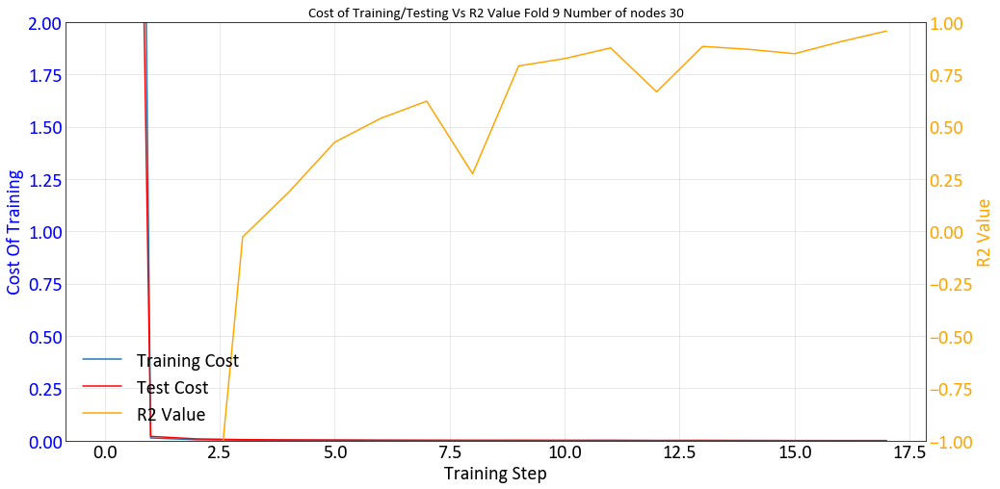

Working on Node 35 fold 9 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpv2ebqvy6', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000011892574128>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0011389536783099174
Cost_test : 0.0023873544
R^2:0.8066083192825317
Epoch: 1200/5000 err = 0.0008727799751795829
Cost_test : 0.0015802004
R^2:0.7166382074356079
Epoch: 1300/5000 err = 0.0007485794223612174
Cost_test : 0.0013756874
R^2:0.7357970952987671
Epoch: 1400/5000 err = 0.0006295115454122424
Cost_test : 0.0012971351
R^2:0.8446927905082703
Epoch: 1500/5000 err = 0.0007633267028722912
Cost_test : 0.0014535541
R^2:0.815111243724823
Epoch: 1600/5000 err = 0.0005543244304135441
Cost_test : 0.0011596147
R^2:0.8776954531669616
Epoch: 1700/5000 err = 0.0002828644006513059
Cost_test : 0.00077104516
R^2:0.8908896446228027
End of learning process
Final epoch = 1713/5000 
Final error = 0.00039838791126385327
Final R^2 = 0.9728528380393981
[[2.00000000e+01 2.94546262e-01 0.00000000e+00 1.24405708e+00
  4.82132690e+00 0.00000000e+00 2.87964274e-04 3.53792928e+02]
 [2.50000000e+01 5.42860357e-01 0.00000000e+00 9.92688592e-01
  5.19468518e+00 0.00000000e+00 3.47506543e-0

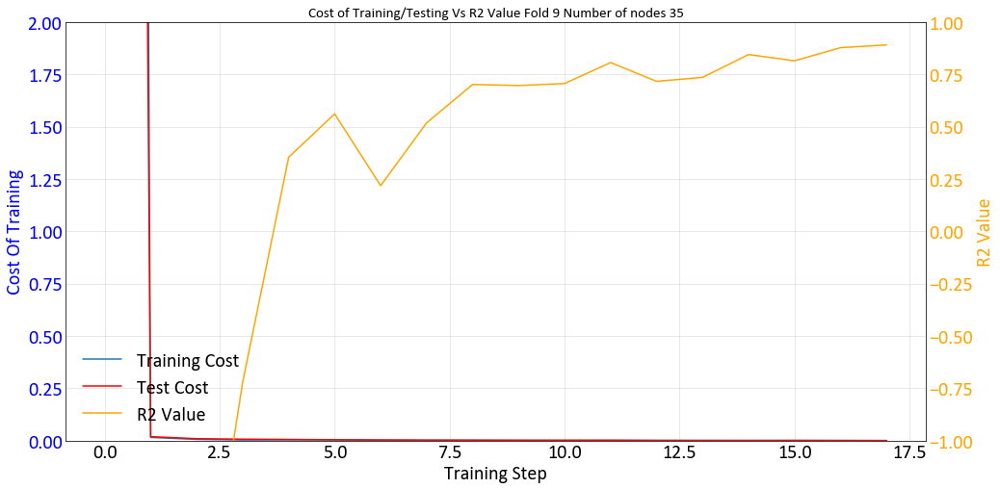

Working on Node 50 fold 9 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpvkt198tc', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001188D031EF0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0009757642401382327
Cost_test : 0.0020551223
R^2:0.6382791996002197
Epoch: 1200/5000 err = 0.0009062972792889922
Cost_test : 0.0022056596
R^2:0.8466880679130554
Epoch: 1300/5000 err = 0.0007927414728328586
Cost_test : 0.002068572
R^2:0.8742070078849792
Epoch: 1400/5000 err = 0.0008005224779481069
Cost_test : 0.0017468224
R^2:0.8086347341537475
Epoch: 1500/5000 err = 0.0004863892943831161
Cost_test : 0.0014154613
R^2:0.8837416172027588
Epoch: 1600/5000 err = 0.000656581623479724
Cost_test : 0.0011740344
R^2:0.9050590753555298
Epoch: 1700/5000 err = 0.00019557906489353627
Cost_test : 0.0008430891
R^2:0.9325792908668518
End of learning process
Final epoch = 1793/5000 
Final error = 0.0003129265591269359
Final R^2 = 0.9744713664054869
[[2.00000000e+01 2.94546262e-01 0.00000000e+00 1.24405708e+00
  4.82132690e+00 0.00000000e+00 2.87964274e-04 3.53792928e+02]
 [2.50000000e+01 5.42860357e-01 0.00000000e+00 9.92688592e-01
  5.19468518e+00 0.00000000e+00 3.47506543e-04 

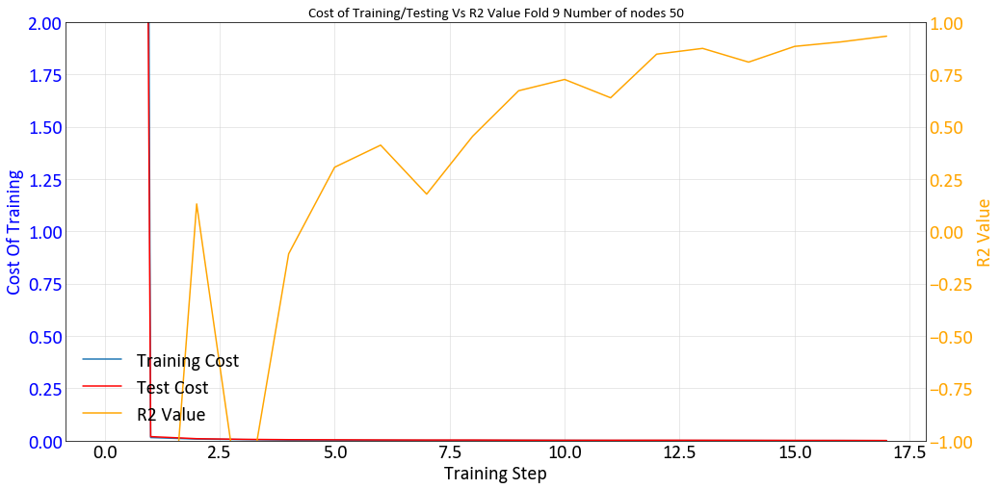

0.0235
30.2
10
Working on Node 20 fold 10 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpd6rn0qgs', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001188DE596A0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calli

Epoch: 1100/5000 err = 0.001269418653100729
Cost_test : 0.0086929025
R^2:0.299877119064331
Epoch: 1200/5000 err = 0.001130368292797357
Cost_test : 0.008014933
R^2:0.4975031852722168
Epoch: 1300/5000 err = 0.0009700822818558663
Cost_test : 0.0074902102
R^2:0.4287522196769714
Epoch: 1400/5000 err = 0.00053115407936275
Cost_test : 0.0072600143
R^2:0.3989958047866821
Epoch: 1500/5000 err = 0.0003766883397474885
Cost_test : 0.0062974426
R^2:0.6397854328155518
Epoch: 1600/5000 err = 0.0005132607533596456
Cost_test : 0.0059102974
R^2:0.28373392820358273
Epoch: 1700/5000 err = 0.0006684169289655984
Cost_test : 0.005190844
R^2:0.6369155764579773
Epoch: 1800/5000 err = 0.0006653859978541732
Cost_test : 0.0046892567
R^2:0.6888248324394226
Epoch: 1900/5000 err = 0.0008495148678775877
Cost_test : 0.0043936195
R^2:0.6434594988822937
Epoch: 2000/5000 err = 0.000357124806032516
Cost_test : 0.0041951374
R^2:0.5990243196487426
Epoch: 2100/5000 err = 0.0004552102705929428
Cost_test : 0.004170455
R^2:0.74

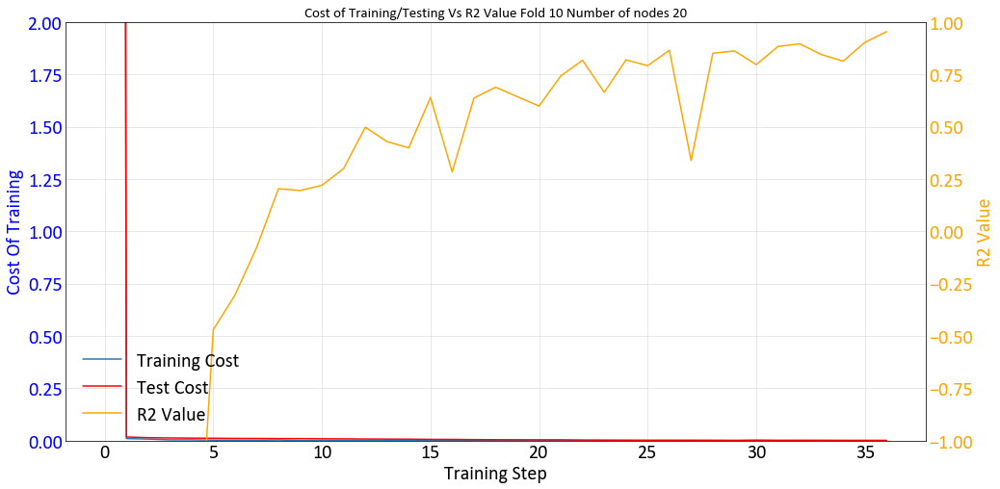

Working on Node 25 fold 10 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp5poaosr_', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001188DE38240>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

Epoch: 1100/5000 err = 0.0007178956875577569
Cost_test : 0.00494051
R^2:0.5687207937240601
Epoch: 1200/5000 err = 0.0006088969355914741
Cost_test : 0.004997015
R^2:0.33516322374343877
Epoch: 1300/5000 err = 0.0008540535112842916
Cost_test : 0.0045666243
R^2:0.682762610912323
Epoch: 1400/5000 err = 0.000523188291117549
Cost_test : 0.0042515593
R^2:0.6200879096984863
Epoch: 1500/5000 err = 0.0004003970301710069
Cost_test : 0.0042292355
R^2:0.7015658497810364
Epoch: 1600/5000 err = 0.0002240963076474145
Cost_test : 0.0036236562
R^2:0.8066774725914002
Epoch: 1700/5000 err = 0.0002916585275670514
Cost_test : 0.0034550675
R^2:0.7326813817024231
Epoch: 1800/5000 err = 0.0003900826122844592
Cost_test : 0.0033169535
R^2:0.8299334764480591
Epoch: 1900/5000 err = 0.00021849003387615086
Cost_test : 0.0028343375
R^2:0.818086063861847
Epoch: 2000/5000 err = 0.00024813075142446903
Cost_test : 0.0024860336
R^2:0.7995362877845764
Epoch: 2100/5000 err = 0.0001736755482852459
Cost_test : 0.0025995043
R^2

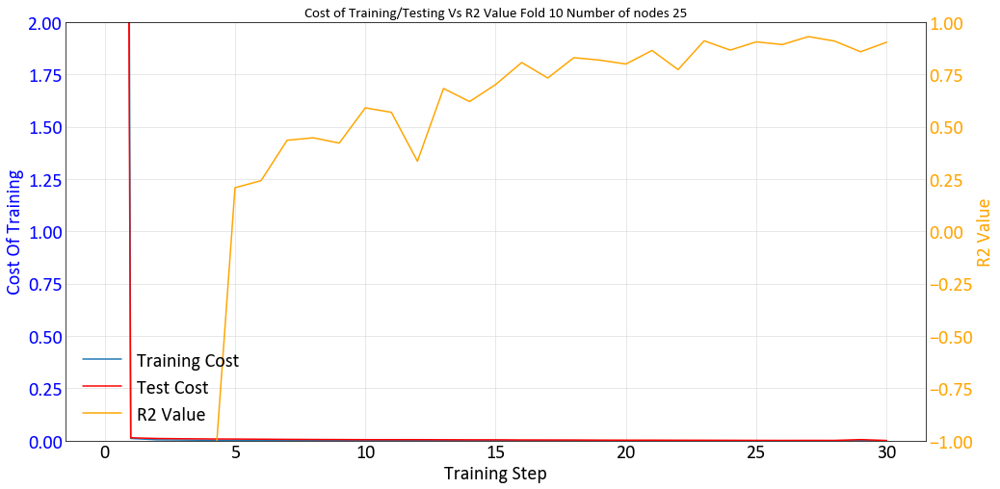

Working on Node 30 fold 10 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpghe5js5b', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000118946D1C18>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

Epoch: 1100/5000 err = 0.00039431356126442554
Cost_test : 0.004363392
R^2:0.614451789855957
Epoch: 1200/5000 err = 0.0005432648205896839
Cost_test : 0.0041379165
R^2:0.7968209028244019
Epoch: 1300/5000 err = 0.00046295978245325387
Cost_test : 0.004265338
R^2:0.6010344505310059
Epoch: 1400/5000 err = 0.00029084659472573544
Cost_test : 0.0035199835
R^2:0.7104660868644714
Epoch: 1500/5000 err = 0.0003164687426760793
Cost_test : 0.0035251896
R^2:0.8542271971702575
Epoch: 1600/5000 err = 0.00020652067614719273
Cost_test : 0.0031280813
R^2:0.8525760769844055
Epoch: 1700/5000 err = 0.00022606907004956155
Cost_test : 0.0030001376
R^2:0.9194856762886047
End of learning process
Final epoch = 1773/5000 
Final error = 0.0001504672065493651
Final R^2 = 0.970658254623413
[[2.00000000e+01 4.68544608e-01 0.00000000e+00 8.76550464e-01
  3.04080743e+00 0.00000000e+00 9.66802982e-05 4.65380183e+02]
 [2.50000000e+01 7.35496242e-01 0.00000000e+00 7.69334834e-01
  4.16363122e+00 0.00000000e+00 7.97232278e-0

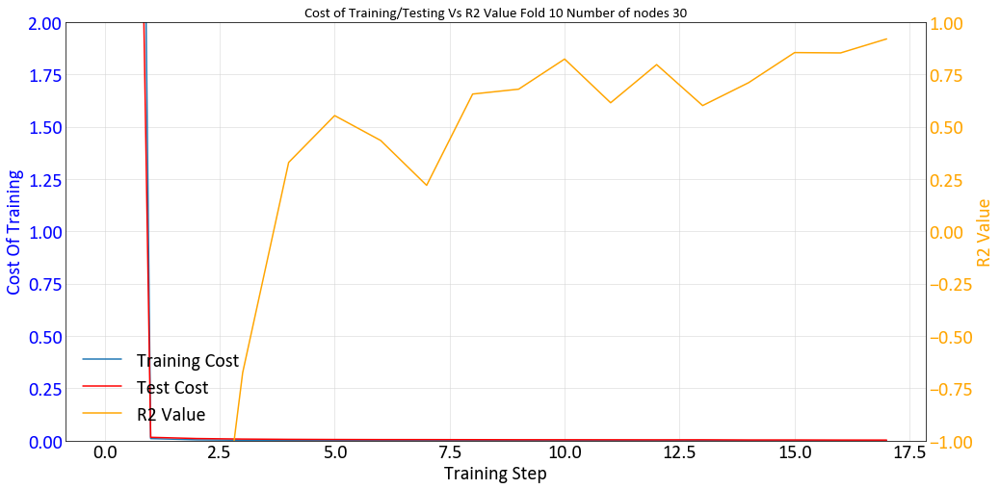

Working on Node 35 fold 10 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpu3mqfn87', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000001188CDDA4E0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

Epoch: 1100/5000 err = 0.0005363862670492381
Cost_test : 0.004826514
R^2:0.8217283606529235
Epoch: 1200/5000 err = 0.0005216300778556615
Cost_test : 0.0048903255
R^2:0.6622957944869995
Epoch: 1300/5000 err = 0.00030558971338905393
Cost_test : 0.0039222115
R^2:0.7617239475250245
Epoch: 1400/5000 err = 0.00029489477747119964
Cost_test : 0.0039541135
R^2:0.7430211305618286
Epoch: 1500/5000 err = 0.0003058044996578247
Cost_test : 0.003353871
R^2:0.649003517627716
Epoch: 1600/5000 err = 0.0001942903792951256
Cost_test : 0.0038430584
R^2:0.8946924209594727
Epoch: 1700/5000 err = 0.00019267195893917234
Cost_test : 0.0032436543
R^2:0.8288853764533998
Epoch: 1800/5000 err = 0.0003671440877951682
Cost_test : 0.0036999902
R^2:0.5846278071403503
Epoch: 1900/5000 err = 0.0001305855403188616
Cost_test : 0.0024409334
R^2:0.914136004447937
Epoch: 2000/5000 err = 0.00010362461762269959
Cost_test : 0.0023997903
R^2:0.8690784692764282
Epoch: 2100/5000 err = 0.00016653348866384475
Cost_test : 0.0021216052

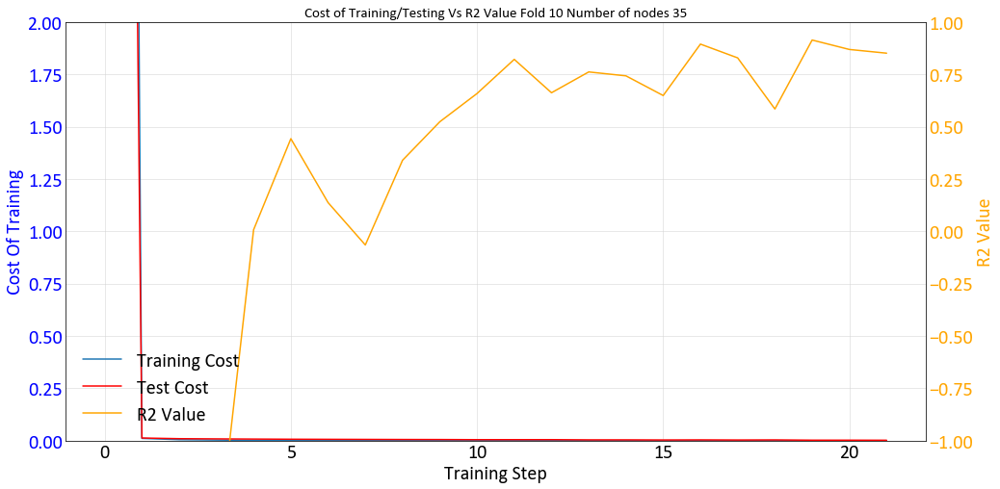

Working on Node 50 fold 10 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpeyl608uv', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000118950DFD68>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

Epoch: 1100/5000 err = 0.00034064469509758054
Cost_test : 0.0043533095
R^2:0.6011090755462646
Epoch: 1200/5000 err = 0.0006066461850423366
Cost_test : 0.0041846717
R^2:0.5277042150497436
Epoch: 1300/5000 err = 0.00037423463072627783
Cost_test : 0.004118643
R^2:0.7996634006500244
Epoch: 1400/5000 err = 0.00027534081891644746
Cost_test : 0.004507562
R^2:0.6391555428504943
Epoch: 1500/5000 err = 0.0004303437104681507
Cost_test : 0.00389721
R^2:0.7459723353385924
Epoch: 1600/5000 err = 0.00032972414774121714
Cost_test : 0.00408195
R^2:0.7762702345848085
Epoch: 1700/5000 err = 0.0005012640278437175
Cost_test : 0.003734323
R^2:0.8181627750396728
Epoch: 1800/5000 err = 0.00027768707805080344
Cost_test : 0.0036856965
R^2:0.7890494108200073
Epoch: 1900/5000 err = 0.0001303112629102543
Cost_test : 0.003770936
R^2:0.8819677114486695
Epoch: 2000/5000 err = 0.00012212687724968418
Cost_test : 0.0029080075
R^2:0.8322837114334106
End of learning process
Final epoch = 2051/5000 
Final error = 9.9820710

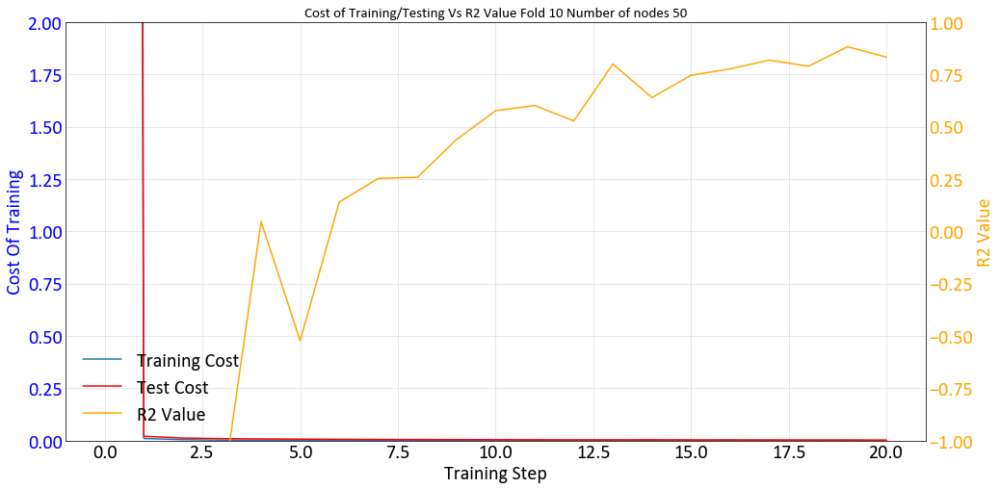

In [28]:
from sklearn.model_selection import KFold
fold_num= 0
for bs in range(1,11):
    fold_num += 1
    datasamplefl = gs.DataFile('dhs_{}.out'.format(fold_num),griddef=griddef)
    datasamplefl = pd.DataFrame(datasamplefl.data, dtype = np.float32)
    del datasamplefl['Drill ID']
    del datasamplefl['MD']
    del datasamplefl['Block ID']
    datasamplefl['Z'] = datasamplefl['Z']
    #Prediction Grid
    x,y,z = griddef.gridcoord()
    #DH Sample Data
    datatest = np.asarray(datasamplefl)
    min_val = np.min(datatest[:,3])
    max_val = np.max(datatest[:,3])
    print(min_val)
    print(max_val)
    datatest[:,3] = (datatest[:,3]-min_val)/(max_val-min_val)
    data_x = np.hstack((x.reshape(len(x),1),y.reshape(len(y),1),z.reshape(len(z),1)))/100
    columns = ['X','Y','Z','value']
    n_batch = 5
    RFB_type = 'Gaussian'
    for fold in range(1,2):
        print(fold_num)
        #print("TRAIN:", train_index, "TEST:", test_index)
        data_train, data_test,target_train, target_test = train_test_split(datatest[:,0:3]/100,datatest[:,3:4],test_size=0.20)
        gs.write_gslib(pd.DataFrame(np.hstack((data_train*100,target_train*(max_val-min_val)+min_val)),columns=columns), './data/data_train_{}.dat'.format(fold_num))
        gs.write_gslib(pd.DataFrame(np.hstack((data_test*100,target_test*(max_val-min_val)+min_val)),columns=columns), './data/data_test_{}.dat'.format(fold_num))
        row = 0
        NN = 'ERBFN' # RBFN or GRNN or 'EBFN'
        data_type = 'Continuous' # Continuous or Categorical
        test_nodes = [20,25,30,35,50]
        pred_all = np.zeros((len(test_nodes)*data_x.shape[0],target_train.shape[1]))
        pred_all_row = np.zeros((data_x.shape[0],target_train.shape[1],len(test_nodes)))
        info_matrix = np.zeros((len(test_nodes),8))
        for nodes in test_nodes:
            c_t = []
            c_test = []
            c_r2 = []
            start_time = time.time()
            print("Working on Node {} fold {} ".format(nodes,fold_num))
            k = nodes
            data_trainpd = pd.DataFrame(data_train)
            data = data_trainpd

            with tf.device('/device:CPU:0'):
                #clustering
                def input_fn():
                  return tf.train.limit_epochs(
                      tf.convert_to_tensor(data_train, dtype=tf.float32), num_epochs=1)

                kmeans = tf.contrib.factorization.KMeansClustering(
                    num_clusters=nodes, use_mini_batch=False)


                # train
                num_iterations = 10
                previous_centers = None
                for _ in range(num_iterations):
                  kmeans.train(input_fn)
                  cluster_centers = kmeans.cluster_centers()
                  #if previous_centers is not None:
                    #print('delta:', cluster_centers - previous_centers)
                  previous_centers = cluster_centers
                  #print('score:', kmeans.score(input_fn))
                #print('cluster centers:', cluster_centers)


            with tf.device('/device:GPU:0'):
                from tensorflow.python.framework import ops
                ops.reset_default_graph()


                RANDOM_SEED = 42
                tf.set_random_seed(RANDOM_SEED)

                N_INSTANCES = np.shape(data_train)[0]
                N_INPUT = data_train.shape[0]
                N_FEATURE = data_train.shape[1]
                N_CLASSES = target_train.shape[1]
                TRAIN_SIZE = int(N_INSTANCES)
                batch_size = int(np.shape(data_train)[0]/n_batch)
                training_epochs = 5000
                if nodes >= 2:
                    training_epochs = 5000
                if nodes >= 25:
                    training_epochs = 5000
                if nodes >= 100:
                    training_epochs = 5000
                if nodes >= 1000:
                    training_epochs = 5000
                learning_rate = 0.01
                epsilon = 0.001
                display_step = 100
                hidden_size = nodes

                target_ = np.zeros((N_INSTANCES, N_CLASSES))
                extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)

                x_data = tf.placeholder(shape=[None, N_FEATURE], dtype=tf.float32, name = 'Features')
                y_target = tf.placeholder(shape=[None, N_CLASSES], dtype=tf.float32, name = 'Known_Values')


                dist = np.zeros((k,k))
                for i in range (0,k):
                    for j in range (0,k):
                        dist[i:j] = distance.euclidean(cluster_centers[i], cluster_centers[j])
                        maxdist = dist.max()
                sigma = maxdist/np.sqrt(2*k)
                if nodes == 1 :
                    beta = 0.2
                else:        
                    beta = 1/math.pow(2*sigma,2)

                #EBFN
                if NN == 'ERBFN':
                    def rbf_network(input_layer, cluster_centers ,weights):

                        exp_list= []
                        with tf.name_scope('Cluster_Centers'):
                            yy = weights['cluster_centers']

                        with tf.name_scope('Input_Layer'):
                            input_layer

                        for i in range(nodes):
                            with tf.name_scope('Covariance_Matrix'):
                                vv = weights['cov_mat'][:,:,i]
                                symA = 0.5 * tf.math.add(vv , tf.transpose(vv))

                            with tf.name_scope('Mahalanobis_Distance'):
                                cc_i = yy[i]

                                diff = tf.subtract(input_layer, cc_i , name = 'subtract')

                                dt = tf.transpose(diff,name = 'Transpose')

                                M1 = tf.matmul(diff,symA,name = 'M1')

                                M2 = tf.matmul(M1,dt,name = 'M2')

                                sqrt = tf.math.sqrt(tf.math.abs(M2),name = 'sqrt')

                                diag = tf.linalg.tensor_diag_part(sqrt,name = 'diag') 

                            with tf.name_scope('Gaussian_Activation_Layer'):
                                gauss_f = tf.math.exp((-tf.math.pow((weights['beta'][:,i]*diag), 2)))
                                exp_list.append(gauss_f)

                        with tf.name_scope('Output_Layer'):        
                            layer2_act = tf.stack(exp_list)   
                            output = tf.add(tf.matmul(layer2_act, weights['output'],transpose_a=True,name = 'mult_layer2_by_weights'), bias['output'], 
                                        name = 'add_bias_to_output')     
                        return output


                weights = {
                    'h1': tf.Variable(tf.ones([N_FEATURE, N_FEATURE,nodes]), name = 'layer1_dims'),
                    'output': tf.Variable(tf.ones([nodes, N_CLASSES]), name = 'layer2_output_Weights'),
                    'cov_mat': tf.Variable(tf.ones(shape = [N_FEATURE,N_FEATURE,nodes]), name = 'cov'),
                    'beta' : tf.Variable(tf.constant(beta,shape = [1,nodes]) ,name = 'beta'),            
                    'cluster_centers' : tf.Variable(tf.constant(np.asarray(cluster_centers).reshape(nodes,N_FEATURE),
                                        shape = [nodes,N_FEATURE]), name = 'cluster_center')
                }

                bias = {
                    'output' : tf.Variable([0],name='output_bias',dtype=tf.float32)  
                }


                pred = rbf_network(x_data, cluster_centers ,weights)

                if data_type == 'Continuous':
                    with tf.name_scope('cost'):
                        cost = tf.reduce_mean(tf.square(pred - y_target))
                        #cost = tf.math.reduce_sum(tf.square(pred - y_target)) 
                        my_opt = tf.train.AdamOptimizer(learning_rate,beta1=0.5).minimize(cost)  
                        tf.summary.scalar('cost', cost)

                    with tf.name_scope('accuracy'):
                        total_error = tf.reduce_sum(tf.square(tf.subtract(y_target, tf.reduce_mean(y_target))))
                        unexplained_error = tf.reduce_sum(tf.square(tf.subtract(y_target, pred)))
                        accuracy = tf.subtract(1.00, tf.divide(unexplained_error, total_error))

                if data_type == 'Categorical':
                    with tf.name_scope('cost'):
                        if N_CLASSES == 1:
                            cost = tf.reduce_mean(tf.square(tf.round(pred) - y_target)) 
                        else:
                            cost = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels = y_target, logits = pred))
                        my_opt = tf.train.AdamOptimizer(learning_rate).minimize(cost) 
                        tf.summary.scalar('cost', cost)

                    with tf.name_scope('accuracy'):
                        correct_prediction = tf.equal(tf.round(pred), y_target)
                        accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))


    #             tf.summary.histogram("cov_mat", weights['cov_mat'])
    #             tf.summary.histogram("Weights_Output_Layer", weights['output'])
    #             tf.summary.histogram("Bias_Output_Layer", bias['output'])




                init = tf.global_variables_initializer()
                sess = tf.InteractiveSession(config=tf.ConfigProto(log_device_placement=True))
                merged = tf.summary.merge_all()
                saver = tf.train.Saver()
                writer = tf.summary.FileWriter('./test',sess.graph)
                sess.run(init)
                tol = 0.00001
                epoch, err, acc=0, 1, 0
                # Training loop
                #saver.restore(sess,'./spatial/test_dataset_{}.ckpt'.format(nodes))
                while epoch <= training_epochs and err >= tol and acc <= 0.97:

                    avg_cost = 0.
                    acc = 0.
                    total_batch = int(data_train.shape[0] / batch_size)
                    for i in range(total_batch):
                        randidx = np.random.randint(int(TRAIN_SIZE), size=batch_size)
                        batch_xs = data_train[randidx , :]
                        batch_ys = target_train[randidx , :]
                        sess.run(my_opt, feed_dict={x_data: batch_xs, y_target: batch_ys})
                        avg_cost += sess.run(cost, feed_dict={x_data: batch_xs, y_target: batch_ys})/total_batch
                        acc += sess.run(accuracy, feed_dict={x_data: batch_xs, y_target: batch_ys})/total_batch
                    err = avg_cost
                    if epoch % 100 == 0:
                        #summary = sess.run([merged],feed_dict={x_data: batch_xs, y_target: batch_ys})
                        #writer.add_summary(summary,epoch)
                        print("Epoch: {}/{} err = {}".format(epoch, training_epochs, avg_cost))
                        print('Cost_test :',sess.run(cost, feed_dict={x_data:data_test,y_target:target_test}))
                        c_t.append(avg_cost)
                        c_test.append(sess.run(cost, feed_dict={x_data:data_test,y_target:target_test}))
                        c_r2.append(acc)
                        if data_type == 'Categorical': 
                            print("Accuracy:{}".format(acc))
                        else:
                            print("R^2:{}".format(acc))    

                    epoch +=1

                print ("End of learning process")
                print ("Final epoch = {}/{} ".format(epoch, training_epochs))
                print ("Final error = {}".format(err) )
                print ("Final R^2 = {}".format(acc) )
                saver.save(sess,'./spatial/test_dataset_{}_{}.ckpt'.format(nodes,fold_num))
                w = np.vsplit(data_x,500)[0].shape[0]
                pred1 = np.zeros((data_x.shape[0],N_CLASSES))
                for i in range(0,500):
                    pred1[i*w:(1+i)*w,0:N_CLASSES] = (sess.run(pred, feed_dict={x_data:np.vsplit(data_x,500)[i]}))*(max_val-min_val)+min_val
                    pred_all[i*w+(row*data_x.shape[0]):(1+i)*w+(row*data_x.shape[0]),0:N_CLASSES] = pred1[i*w:(1+i)*w,0:N_CLASSES]
                    pred_all_row[i*w:(1+i)*w,0:N_CLASSES,row] = pred1[i*w:(1+i)*w,0:N_CLASSES]

                writer = tf.summary.FileWriter("sess_graph", sess.graph)
                saver.save(sess,'test/test_dataset_{}_{}.ckpt'.format(nodes,fold_num))
                sess.close() 

                gs.write_gslib(pd.DataFrame(pred1), './predictions/real_{}_{}.dat'.format(nodes,fold_num))

                info_matrix[row,0] = k
                info_matrix[row,1] = beta
                info_matrix[row,2] = 0 #r2_score(sgsimfl['value'],pred1)
                info_matrix[row,3] = np.mean(pred1)
                info_matrix[row,4] = np.var(pred1)
                info_matrix[row,5] = 0 #mean_squared_error(sgsimfl['value'],pred1)
                info_matrix[row,6] = err
                info_matrix[row,7] = (time.time() - start_time) 
                row +=1
                tf.InteractiveSession.close(sess)
            print(info_matrix)
            SMALL_SIZE = 15
            plt.rc('font', size=SMALL_SIZE)
            plt.rc('axes', titlesize=SMALL_SIZE)
            f, (ax1) = plt.subplots(1, 1,figsize=(16, 8))
            ax1.set_ylim([0,2])
            ax1.plot(range(len(c_t)), c_t, label ='Training Cost')
            ax1.plot(range(len(c_t)), c_test, color="red",label ='Test Cost')
            ax1.set_xlabel('Training Step')
            ax1.grid(True)
            ax1.set_title('Cost of Training/Testing Vs R2 Value Fold {} Number of nodes {}'.format(fold_num,nodes))
            ax1.set_ylabel('Cost Of Training', color='blue')
            ax1.tick_params(axis='y', labelcolor='blue')
            ax2 = ax1.twinx()
            ax2.plot(range(len(c_t)), c_r2,'-',color="orange",label ='R2 Value')
            ax2.set_ylim([-1,1])
            ax2.set_ylabel('R2 Value', color='orange')
            ax2.tick_params(axis='y', labelcolor='orange')
            lines, labels = ax1.get_legend_handles_labels()
            lines2, labels2 = ax2.get_legend_handles_labels()
            ax2.legend(lines + lines2, labels + labels2, loc=3)
            plt.savefig('C:/Users/Matt/Desktop/Thesis Work/Thesis/0-Figures/3-Chapter/Training_R2_ERBFN_{}_{}_{}.png'.format(nodes,fold_num,plt_extent))
            plt.show()


        ensemble = numpy.nanmean(pred_all_row, axis = 2)
        gs.write_gslib(pd.DataFrame(ensemble), './predictions/ensemble_{}.dat'.format(fold_num))
        gs.write_gslib(pd.DataFrame(pred_all), './predictions/all_real_{}.dat'.format(fold_num))

In [58]:
declusstr = """                  Parameters for DECLUS
                  *********************

START OF PARAMETERS:
{datafl}         -file with data
{xyzcol}   {varcol}               -  columns for X, Y, Z, and variable
-1.0e21     1.0e21          -  trimming limits
declus/declus_{fold}.sum                  -file for summary output
declus/declus_{fold}.out                  -file for output with data & weights
1.0   1.0                   -Y and Z cell anisotropy (Ysize=size*Yanis)
0                           -0=look for minimum declustered mean (1=max)
50  25  110.0               -number of cell sizes, min size, max size
100                           -number of origin offsets
"""
varcparstr = """                  Parameters for VARCALC
                  **********************
 
START OF PARAMETERS:
{datafl}                 -file with data
{xyzcol}                         -   columns for X, Y, Z coordinates
1   {varcol}                            -   number of variables,column numbers (position used for tail,head variables below)
-99.0    1.0e21                  -   trimming limits
2                                 -number of directions
0 90 200 0.0 22.5 200 0.0   -Dir 01: azm,azmtol,bandhorz,dip,dipt
 20  {ldist}  {ltol}                 -        number of lags,lag distanc
0. 22.5 200 90.0 22.5 200 0.0   -Dir 03: azm,azmtol,bandhorz,dip,
 20  10  5                 -        number of lags,lag distanc
./vargs/varcalc_{fold}.out                       -file for experimental variogram points output.
0                                 -legacy output (0=no, 1=write out gamv2004 format)
1                                 -run checks for common errors
1                                 -standardize sills? (0=no, 1=yes)
1                                 -number of variogram types
1   1   1   ?                     -tail variable, head variable, variogram type (and cutoff/category), sill



NOTES ON VARIOGRAM CALCULATION:
1) By default, varcalc runs checks for common errors in parameter choices. This can be
   disabled if desired. 
2) Varcalc can standardize using a provided sill (such as a declustered variance).
   For example, if variable 1 has a declustered variance of 8.6, the traditional
   semivariogram could be standardized by setting the variogram type to:
      1  1  1  8.6
   Alternatively, varcalc can attempt to infer a sill for standardizing by setting
   the variogram type to:
      1  1  1  ?
   The calculated sills will be written to the console. 
3) Variogram types are the same as in GSLIB:
      1 = traditional semivariogram
      2 = traditional cross semivariogram
      3 = covariance   (-3 calculates variance (provided sill) -covariance)
      4 = correlogram  (-4 calculates 1-correlation)
      5 = general relative semivariogram
      6 = pairwise relative semivariogram
      7 = semivariogram of logarithms
      8 = semimadogram
      9 = indicator semivariogram - continuous  - requires a cutoff
      10= indicator semivariogram - categorical - requires a category
4) For indicator variograms, the variogram cutoff/categories are specified immediately after the variogram type
    1   1   9   1.0   ?               -tail variable, head variable, variogram type (and cutoff/category), sill
5) If desired, the program can write out the variogram points in the gamv2004 style
   for compatibility with older versions. Tilt was not supported in pre-varcalc experimental variogram
   programs so use carefully. 
"""
varmparstr = """                  Parameters for VARMODEL
                  ***********************
 
START OF PARAMETERS:
./vargs/varmodel_{fold}.out                 -file for modeled variogram points output
2                            -number of directions to model points along
    0.0  00.0  1000   0.5      -  azm, dip, npoints, point separation
    0.0  90.0  1000   0.5      -  azm, dip, npoints, point separation
1    0.001:0.01                   -nst, nugget effect
3    0.99    135   0.0   0.0    -it,cc,azm,dip,tilt (ang1,ang2,ang3)
        {omni}  {omni}  50:300    -a_hmax, a_hmin, a_vert (ranges)
1   2000000                   -fit model (0=no, 1=yes), maximum iterations
1.0                          -  variogram sill (can be fit, but not recommended in most cases)
1                            -  number of experimental files to use
{varcalc}                  -    experimental output file 1
3   1  2  3                    -      # of variograms (<=0 for all), variogram #s
1   1   10                   -  # pairs weighting, inverse distance weighting, min pairs
0     10.0                   -  fix Hmax/Vert anis. (0=no, 1=yes)
0      1.0                   -  fix Hmin/Hmax anis. (0=no, 1=yes)
./vargs/varmodel_{fold}.var              -  file to save fit variogram model
"""
kt3dnparstr = """                 Parameters for KT3DN
                 ********************
START OF PARAMETERS:
{datafl}             -file with data
0  {xyzcol} {varcol}  0                 -  columns for DH,X,Y,Z,var,sec var
-998.0    1.0e21                 -  trimming limits
0                                -option: 0=grid, 1=cross, 2=jackknife
xvk.dat                          -file with jackknife data
1   2   0    3    0              -   columns for X,Y,Z,vr and sec var
kt3dn_dataspacing.out            -data spacing analysis output file (see note)
0    15.0                        -  number to search (0 for no dataspacing analysis, rec. 10 or 20) and composite length
0    100   0                     -debugging level: 0,3,5,10; max data for GSKV;output total weight of each data?(0=no,1=yes)
kt3dn.dbg-nkt3dn.sum             -file for debugging output (see note)
./predictions/kt3dn_{fold}.out                        -file for kriged output (see GSB note)
{griddef}
1    1      1                    -x,y and z block discretization
25    50    12    1               -min, max data for kriging,upper max for ASO,ASO incr
0      0                         -max per octant, max per drillhole (0-> not used)
500.0  500.0  250.0              -maximum search radii
0.0  0.0   0.0                 -angles for search ellipsoid
0                                -0=SK,1=OK,2=LVM(resid),3=LVM((1-w)*m(u))),4=colo,5=exdrift,6=ICCK
{mean} 0.6  0.8                  -  mean (if 0,4,5,6), corr. (if 4 or 6), var. reduction factor (if 4)
0 0 0 0 0 0 0 0 0                -drift: x,y,z,xx,yy,zz,xy,xz,zy
0                                -0, variable; 1, estimate trend
extdrift.out                     -gridded file with drift/mean
4                                -  column number in gridded file
keyout.out                       -gridded file with keyout (see note)
0    1                           -  column (0 if no keyout) and value to keep
{varg}
"""

In [60]:
varcalc = gs.Program('varcalc')
varmodel = gs.Program('varmodel')
kt3dn = gs.Program('kt3dn')
declus = gs.Program('declus') 
for fold in range(1,11):
    Traindat = gs.DataFile('dhs_{}.out'.format(fold),griddef=griddef)

    declus.run(declusstr.format(datafl = Traindat.flname,
                         xyzcol = Traindat.gscol(Traindat.xyz),
                         varcol = Traindat.gscol('value'),
                         fold = fold))
    
    declus_mean = np.min(np.asarray(gs.DataFile('declus/declus_{}.sum'.format(fold)).data['Declustered Mean'][gs.DataFile('declus/declus_{}.sum'.format(fold)).data['Cell Size']>0.0]))

    
    
    varcalc.run(varcparstr.format(datafl = Traindat.flname,
                             xyzcol = Traindat.gscol(Traindat.xyz),
                             varcol = Traindat.gscol('value'),
                             fold = fold,
                             ldist =100,
                             ltol = 50))

    varcalcfl = gs.DataFile('./vargs/varcalc_{}.out'.format(fold))

   
    varmodel.run(varmparstr.format(varcalc = varcalcfl.flname,
                                 fold = fold,
                                  omni= 200 - (fold-1)*15))

    varmodelfl = gs.DataFile('./vargs/varmodel_{}.out'.format(fold))

    f = open("./vargs/varmodel_{}.var".format(fold), "r")
    varg = f.readlines()
    f.close()
    varg = ''.join(varg)
    
    kt3dn.run(kt3dnparstr.format(datafl = Traindat.flname,
                             xyzcol = Traindat.gscol(Traindat.xyz),
                             varcol = Traindat.gscol('value'),
                             griddef = griddef,
                             varg = varg,
                             fold = fold,
                             mean = declus_mean))

Calling:  ['declus', 'temp']

DECLUS Version: 3.000

 data file = dhs_1.out                               
 columns =            2           3           4           7
 tmin,tmax =    -1.000000E+21    1.000000E+21
 summary file = declus/declus_1.sum                     
 output file = declus/declus_1.out                     
 anisotropy =         1.000000        1.000000
 minmax flag =            0
 ncell min max =           50       25.000000      110.000000
 offsets =          100


There are      600 data with:
  mean value            =      1.27275
  minimum and maximum   =      0.04380    19.37860
  size of data vol in X =    380.00000
  size of data vol in Y =    380.00000
  size of data vol in Z =    230.00000

  declustered mean      =      1.26094
  min and max weight    =      0.62341     2.50325
  equal weighting       =      1.00000


DECLUS Version: 3.000 Finished

Stop - Program terminated.
Calling:  ['varcalc', 'temp']

varcalc version:  1.400

  data file: dhs_1.out
  x,

 Final objective value =   1.626723703248849E-002
  Modeling points

varmodel completed successfully

Calling:  ['kt3dn', 'temp']

 KT3DN Version: 7.100

  data file = dhs_2.out                               
  columns =            0           2           3           4           7
           0
  trimming limits =   -998.000000000000       1.000000000000000E+021
  kriging option =            0
  jackknife data file = xvk.dat                                 
  columns =            1           2           0           3           0
  data spacing analysis output file = kt3dn_dataspacing.out                   
  debugging level =            0
  summary only file = kt3dn.sum                               
  debugging file = kt3dn.dbg                               
  GSLIB-style output file = ./predictions/kt3dn_2.out               
  nx, xmn, xsiz =           50   5.00000000000000        10.0000000000000     
  ny, ymn, ysiz =           50   5.00000000000000        10.0000000000000     
  nz

 Working on the kriging 
   currently on estimate      6250
   currently on estimate     12500
   currently on estimate     18750
   currently on estimate     25000
   currently on estimate     31250
   currently on estimate     37500
   currently on estimate     43750
   currently on estimate     50000
   currently on estimate     56250
   currently on estimate     62500

 KT3DN Version:    7.100 Finished

Calling:  ['declus', 'temp']

DECLUS Version: 3.000

 data file = dhs_4.out                               
 columns =            2           3           4           7
 tmin,tmax =    -1.000000E+21    1.000000E+21
 summary file = declus/declus_4.sum                     
 output file = declus/declus_4.out                     
 anisotropy =         1.000000        1.000000
 minmax flag =            0
 ncell min max =           50       25.000000      110.000000
 offsets =          100


There are      600 data with:
  mean value            =      1.39023
  minimum and maximum   =      

  output points file: ./vargs/varmodel_5.out
  number of directions to model points along:            2
  azm, dip, npoints, pointsep:   0.000000000000000E+000  0.000000000000000E+000
        1000  0.500000000000000     
  azm, dip, npoints, pointsep:   0.000000000000000E+000   90.0000000000000     
        1000  0.500000000000000     
  nst =           1
 c0 constrained to  1.000000000000000E-003  1.000000000000000E-002
  fit model?            1     2000000
  number of variogram files:            1
  variogram file: ./vargs/varcalc_5.out
  using variograms            1           2           3
  # pairs wt, inv dist wt, min pairs:            1           1          10
  fixhmaxvert,hmaxvert:            0   10.0000000000000     
  fixhminhmax,hminhmax:            0   1.00000000000000     
  variogram model output file: ./vargs/varmodel_5.var
 Reading experimental variograms for variogram fitting
  Fitting variograms
 Starting objective value =   1.292820165043319E-002
 Final objective va

   currently on estimate      6250
   currently on estimate     12500
   currently on estimate     18750
   currently on estimate     25000
   currently on estimate     31250
   currently on estimate     37500
   currently on estimate     43750
   currently on estimate     50000
   currently on estimate     56250
   currently on estimate     62500

 KT3DN Version:    7.100 Finished

Calling:  ['declus', 'temp']

DECLUS Version: 3.000

 data file = dhs_7.out                               
 columns =            2           3           4           7
 tmin,tmax =    -1.000000E+21    1.000000E+21
 summary file = declus/declus_7.sum                     
 output file = declus/declus_7.out                     
 anisotropy =         1.000000        1.000000
 minmax flag =            0
 ncell min max =           50       25.000000      110.000000
 offsets =          100


There are      600 data with:
  mean value            =      1.35444
  minimum and maximum   =      0.00660    35.70320
  siz

 Final objective value =   6.354269021038312E-003
  Modeling points

varmodel completed successfully

Calling:  ['kt3dn', 'temp']

 KT3DN Version: 7.100

  data file = dhs_8.out                               
  columns =            0           2           3           4           7
           0
  trimming limits =   -998.000000000000       1.000000000000000E+021
  kriging option =            0
  jackknife data file = xvk.dat                                 
  columns =            1           2           0           3           0
  data spacing analysis output file = kt3dn_dataspacing.out                   
  debugging level =            0
  summary only file = kt3dn.sum                               
  debugging file = kt3dn.dbg                               
  GSLIB-style output file = ./predictions/kt3dn_8.out               
  nx, xmn, xsiz =           50   5.00000000000000        10.0000000000000     
  ny, ymn, ysiz =           50   5.00000000000000        10.0000000000000     
  nz

 
 Working on the kriging 
   currently on estimate      6250
   currently on estimate     12500
   currently on estimate     18750
   currently on estimate     25000
   currently on estimate     31250
   currently on estimate     37500
   currently on estimate     43750
   currently on estimate     50000
   currently on estimate     56250
   currently on estimate     62500

 KT3DN Version:    7.100 Finished

Calling:  ['declus', 'temp']

DECLUS Version: 3.000

 data file = dhs_10.out                              
 columns =            2           3           4           7
 tmin,tmax =    -1.000000E+21    1.000000E+21
 summary file = declus/declus_10.sum                    
 output file = declus/declus_10.out                    
 anisotropy =         1.000000        1.000000
 minmax flag =            0
 ncell min max =           50       25.000000      110.000000
 offsets =          100


There are      600 data with:
  mean value            =      0.97953
  minimum and maximum   =    

In [42]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
import warnings
warnings.simplefilter('ignore')
from scipy.ndimage import gaussian_filter

In [43]:
declusstr = """                  Parameters for DECLUS
                  *********************

START OF PARAMETERS:
{datafl}         -file with data
{xyzcol}   {varcol}               -  columns for X, Y, Z, and variable
-1.0e21     1.0e21          -  trimming limits
declus.sum                  -file for summary output
declus.out                  -file for output with data & weights
1.0   1.0                   -Y and Z cell anisotropy (Ysize=size*Yanis)
0                           -0=look for minimum declustered mean (1=max)
99  10.0  110.0               -number of cell sizes, min size, max size
100                           -number of origin offsets
"""
nscoreparstr = """                  Parameters for NSCORE
                  *********************

START OF PARAMETERS:
{datafl}      -file with data
{varcol}   {wtcol}                    -  columns for variable and weight
-99   1.0e21         -  trimming limits
0                        -1=transform according to specified ref. dist.
../histsmth/histsmth.out -  file with reference dist.
1   2                    -  columns for variable and weight
nscore/nscore_{fold}.out               -file for output
nscore/nscore_{fold}.trn               -file for output transformation table
"""

sies_nscoreparstr = """                  Parameters for NSCORE
                  *********************

START OF PARAMETERS:
{datafl}      -file with data
{varcol}   0                    -  columns for variable and weight
-99   1.0e21         -  trimming limits
0                        -1=transform according to specified ref. dist.
../histsmth/histsmth.out -  file with reference dist.
1   2                    -  columns for variable and weight
nscore/nscore_sies_{fold}.out               -file for output
nscore/nscore_sies_{fold}.trn               -file for output transformation table
"""

varcparstr = """                  Parameters for VARCALC
                  **********************
 
START OF PARAMETERS:
{datafl}                 -file with data
{xyzcol}                         -   columns for X, Y, Z coordinates
1   {varcol}                            -   number of variables,column numbers (position used for tail,head variables below)
-99.0    1.0e21                  -   trimming limits
2                                 -number of directions
0 90 200 0.0 22.5 200 0.0   -Dir 01: azm,azmtol,bandhorz,dip,dipt
 20  {ldist}  {ltol}                 -        number of lags,lag distanc
0. 22.5 200 90.0 22.5 200 0.0   -Dir 03: azm,azmtol,bandhorz,dip,
 20  10  5                 -        number of lags,lag distanc
./vargs/varcalc_{fold}.out                       -file for experimental variogram points output.
0                                 -legacy output (0=no, 1=write out gamv2004 format)
1                                 -run checks for common errors
1                                 -standardize sills? (0=no, 1=yes)
1                                 -number of variogram types
1   1   1   ?                     -tail variable, head variable, variogram type (and cutoff/category), sill
"""
varmparstr = """                  Parameters for VARMODEL
                  ***********************
 
START OF PARAMETERS:
./vargs/varmodel_{fold}.out                 -file for modeled variogram points output
2                            -number of directions to model points along
    0.0  00.0  1000   0.5      -  azm, dip, npoints, point separation
    0.0  90.0  1000   0.5      -  azm, dip, npoints, point separation
1    0.001:0.01                   -nst, nugget effect
3    0.99    135   0.0   0.0    -it,cc,azm,dip,tilt (ang1,ang2,ang3)
        {omni}  {omni}  50:300    -a_hmax, a_hmin, a_vert (ranges)
0   200000                   -fit model (0=no, 1=yes), maximum iterations
1.0                          -  variogram sill (can be fit, but not recommended in most cases)
1                            -  number of experimental files to use
{varcalc}                  -    experimental output file 1
0                    -      # of variograms (<=0 for all), variogram #s
1   1   10                   -  # pairs weighting, inverse distance weighting, min pairs
0     10.0                   -  fix Hmax/Vert anis. (0=no, 1=yes)
0      1.0                   -  fix Hmin/Hmax anis. (0=no, 1=yes)
./vargs/varmodel_{fold}.var              -  file to save fit variogram model
"""
kt3dnparstr = """                 Parameters for KT3DN
                 ********************
START OF PARAMETERS:
{datafl}              -file with data
0  {xyzcol}  {varcol}  {seisnscol}                 -  columns for DH,X,Y,Z,var,sec var
-99    1.0e21                 -  trimming limits
0                                -option: 0=grid, 1=cross, 2=jackknife
xvk.dat                          -file with jackknife data
1   2   0    3    0              -   columns for X,Y,Z,vr and sec var
kt3dn_dataspacing.out            -data spacing analysis output file (see note)
0    15.0                        -  number to search (0 for no dataspacing analysis, rec. 10 or 20) and composite length
0    100   0                     -debugging level: 0,3,5,10; max data for GSKV;output total weight of each data?(0=no,1=yes)
kt3dn.dbg-nkt3dn.sum             -file for debugging output (see note)
./ML+ICCK/kt3dn_{fold}.out                        -file for kriged output (see GSB note)
{griddef}
1    1      1                    -x,y and z block discretization
10    50    12    1               -min, max data for kriging,upper max for ASO,ASO incr
0      0                         -max per octant, max per drillhole (0-> not used)
500  500  500              -maximum search radii
 0   0   0.0                 -angles for search ellipsoid
6                                -0=SK,1=OK,2=LVM(resid),3=LVM((1-w)*m(u))),4=colo,5=exdrift,6=ICCK
0  {corr}  0.8                  -  mean (if 0,4,5,6), corr. (if 4 or 6), var. reduction factor (if 4)
0 0 0 0 0 0 0 0 0                -drift: x,y,z,xx,yy,zz,xy,xz,zy
0                                -0, variable; 1, estimate trend
{seisfl}                     -gridded file with drift/mean
{seiscol}                                -  column number in gridded file
keyout.out                       -gridded file with keyout (see note)
0    1                           -  column (0 if no keyout) and value to keep
{varg}
"""


backtrparstr = """                  Parameters for BACKTR
                  *********************

START OF PARAMETERS:
{datafl}                    -file with data
{varcol}                             -  column with Gaussian variable
-99   1.0e21              -  trimming limits
backtr/backtr_{fold}.out                    -file for output
nscore/nscore_{fold}.trn                    -file with input transformation table
{minval}    {maxval}                      -minimum and maximum data value
1    {lowertail}                      -lower tail option and parameter
1    {uppertail}                      -upper tail option and parameter
"""

In [44]:
varcalc = gs.Program('varcalc')
varmodel = gs.Program('varmodel')
kt3dn = gs.Program('kt3dn')
nscore = gs.Program('nscore')
declus = gs.Program('declus')   
backtr = gs.Program('backtr')


for fold in range(1,11):
    
    sesi_data = gs.DataFile('predictions\ensemble_{}.dat'.format(fold))
    
    sesi_data = gaussian_filter((sesi_data.data['0']),sigma = 10)
    
    gs.write_gslib(pd.DataFrame(sesi_data),'predictions\smooth_ensemble_{}.dat'.format(fold))
    
    sesi_data = gs.DataFile('predictions\smooth_ensemble_{}.dat'.format(fold))
    
    nscore.run(sies_nscoreparstr.format(datafl = sesi_data.flname,
                          varcol = sesi_data.gscol('0'),
                          fold = fold))

    sesi_data_ns = gs.DataFile('nscore/nscore_sies_{}.out'.format(fold))
    
    Testdat = gs.DataFile('declus/declus_{}.out'.format(fold),griddef=griddef)
    
    idx,ingrid = griddef.coord_to_index1d(x=Testdat.data['X'],y=Testdat.data['Y'],z=Testdat.data['Z'])
    
    Testdat['sesi_data_ns'] = sesi_data_ns.data['NS_0'][idx].values
    
    gs.write_gslib(Testdat,'./data/data_test_NS_{}.dat'.format(fold))
    
    Testdat = gs.DataFile('./data/data_test_NS_{}.dat'.format(fold))

    nscore.run(nscoreparstr.format(datafl = Testdat.flname,
                          varcol = Testdat.gscol('value'),
                          wtcol = Testdat.gscol('Declustering Weight'),
                          fold = fold))
    
    Testdat = gs.DataFile('nscore/nscore_{}.out'.format(fold),griddef=griddef)
    
    
    Traindat = gs.DataFile('dhs_{}.out'.format(fold))
    
    idx,ingrid = griddef.coord_to_index1d(x=Traindat.data['X'],y=Traindat.data['Y'],z=Traindat.data['Z']) 
    
    Traindat['sesi_data_ns'] = sesi_data_ns.data['NS_0'][idx].values
    
    gs.write_gslib(Traindat,'./data/data_train_NS_{}.dat'.format(fold))
    
    Traindat = gs.DataFile('./data/data_train_NS_{}.dat'.format(fold))
    
    declus.run(declusstr.format(datafl = Traindat.flname,
                             xyzcol = Traindat.gscol(Traindat.xyz),
                             varcol = Traindat.gscol('value')))
    
    Traindat = gs.DataFile('declus.out',griddef=griddef)
    
    nscore.run(nscoreparstr.format(datafl = Traindat.flname,
                              varcol = Traindat.gscol('value'),
                              wtcol = Traindat.gscol('Declustering Weight'),
                              fold = fold))
    
    
    Traindat = gs.DataFile('nscore/nscore_{}.out'.format(fold),griddef=griddef)

    varcalc.run(varcparstr.format(datafl = Traindat.flname,
                             xyzcol = Traindat.gscol(Traindat.xyz),
                             varcol = Traindat.gscol('NS_value'),
                             fold = fold,
                             ldist = 100,
                             ltol = 50 ))

    varcalcfl = gs.DataFile('./vargs/varcalc_{}.out'.format(fold))

   
    varmodel.run(varmparstr.format(varcalc = varcalcfl.flname,
                                 fold = fold,
                                  omni= 200 - (fold-1)*15))

    varmodelfl = gs.DataFile('./vargs/varmodel_{}.out'.format(fold))

    f = open('./vargs/varmodel_{}.var'.format(fold), "r")
    varg = f.readlines()
    f.close()
    varg = ''.join(varg)
    

    
    kt3dn.run(kt3dnparstr.format(datafl = Traindat.flname,
                                 seisfl = sesi_data_ns.flname,
                             xyzcol = Traindat.gscol(Traindat.xyz),
                             varcol = Traindat.gscol('NS_value'),
                             seiscol = sesi_data_ns.gscol('NS_0'),
                             griddef = griddef,
                             varg = varg,
                             seisnscol = Traindat.gscol('sesi_data_ns'),
                             corr = np.corrcoef(Traindat['NS_value'],Traindat['sesi_data_ns'])[0,1],
                             fold = fold))
    
    print(np.corrcoef(Testdat['NS_value'],Testdat['sesi_data_ns'])[0,1])
    
    kt3dnfl = gs.DataFile('./ML+ICCK/kt3dn_{}.out'.format(fold))
    
    dh_dat = gs.DataFile('dhs_{}.out'.format(fold))
    
    minval = np.min(dh_dat.data['value'].values)
    maxval = np.max(dh_dat.data['value'].values)
    
    
    backtr.run(backtrparstr.format(datafl = kt3dnfl.flname,
                                  seisfl = sesi_data_ns.flname,
                                  varcol = kt3dnfl.gscol('Estimate'),
                                  fold = fold,
                                  minval = minval,
                                  maxval = maxval,
                                  lowertail = minval*1.05,
                                  uppertail = maxval*1.05))
    backtrdat = gs.DataFile('./backtr/backtr_{}.out'.format(fold),griddef=griddef)
    Traindat = gs.DataFile('dhs_{}.out'.format(fold))
    
    backtrdat['Back Transform'][idx] = Traindat['value'] 
    
    gs.write_gslib(backtrdat,'./backtr/backtr_UDDH_{}.out'.format(fold))
    

Calling:  ['nscore', 'temp']

 NSCORE Version: 3.000

  data file = predictions\smooth_ensemble_1.dat       
  columns =            1           0
  trimming limits =   -99.00000      1.0000000E+21
  consider a different ref. dist. (1=yes) =            0
  file with reference distribution = ../histsmth/histsmth.out -  file with re
  columns =            1           2
  file for output = nscore/nscore_sies_1.out                
  file for transformation table = nscore/nscore_sies_1.trn                

 NSCORE Version: 3.000 Finished

Calling:  ['nscore', 'temp']

 NSCORE Version: 3.000

  data file = ./data/data_test_NS_1.dat               
  columns =            4           5
  trimming limits =   -99.00000      1.0000000E+21
  consider a different ref. dist. (1=yes) =            0
  file with reference distribution = ../histsmth/histsmth.out -  file with re
  columns =            1           2
  file for output = nscore/nscore_1.out                     
  file for transformation table


 BACKTR Version: 3.000 Finished

Calling:  ['nscore', 'temp']

 NSCORE Version: 3.000

  data file = predictions\smooth_ensemble_2.dat       
  columns =            1           0
  trimming limits =   -99.00000      1.0000000E+21
  consider a different ref. dist. (1=yes) =            0
  file with reference distribution = ../histsmth/histsmth.out -  file with re
  columns =            1           2
  file for output = nscore/nscore_sies_2.out                
  file for transformation table = nscore/nscore_sies_2.trn                

 NSCORE Version: 3.000 Finished

Calling:  ['nscore', 'temp']

 NSCORE Version: 3.000

  data file = ./data/data_test_NS_2.dat               
  columns =            4           5
  trimming limits =   -99.00000      1.0000000E+21
  consider a different ref. dist. (1=yes) =            0
  file with reference distribution = ../histsmth/histsmth.out -  file with re
  columns =            1           2
  file for output = nscore/nscore_2.out                   


 BACKTR Version: 3.000 Finished

Calling:  ['nscore', 'temp']

 NSCORE Version: 3.000

  data file = predictions\smooth_ensemble_3.dat       
  columns =            1           0
  trimming limits =   -99.00000      1.0000000E+21
  consider a different ref. dist. (1=yes) =            0
  file with reference distribution = ../histsmth/histsmth.out -  file with re
  columns =            1           2
  file for output = nscore/nscore_sies_3.out                
  file for transformation table = nscore/nscore_sies_3.trn                

 NSCORE Version: 3.000 Finished

Calling:  ['nscore', 'temp']

 NSCORE Version: 3.000

  data file = ./data/data_test_NS_3.dat               
  columns =            4           5
  trimming limits =   -99.00000      1.0000000E+21
  consider a different ref. dist. (1=yes) =            0
  file with reference distribution = ../histsmth/histsmth.out -  file with re
  columns =            1           2
  file for output = nscore/nscore_3.out                   


 BACKTR Version: 3.000 Finished

Calling:  ['nscore', 'temp']

 NSCORE Version: 3.000

  data file = predictions\smooth_ensemble_4.dat       
  columns =            1           0
  trimming limits =   -99.00000      1.0000000E+21
  consider a different ref. dist. (1=yes) =            0
  file with reference distribution = ../histsmth/histsmth.out -  file with re
  columns =            1           2
  file for output = nscore/nscore_sies_4.out                
  file for transformation table = nscore/nscore_sies_4.trn                

 NSCORE Version: 3.000 Finished

Calling:  ['nscore', 'temp']

 NSCORE Version: 3.000

  data file = ./data/data_test_NS_4.dat               
  columns =            4           5
  trimming limits =   -99.00000      1.0000000E+21
  consider a different ref. dist. (1=yes) =            0
  file with reference distribution = ../histsmth/histsmth.out -  file with re
  columns =            1           2
  file for output = nscore/nscore_4.out                   


 BACKTR Version: 3.000 Finished

Calling:  ['nscore', 'temp']

 NSCORE Version: 3.000

  data file = predictions\smooth_ensemble_5.dat       
  columns =            1           0
  trimming limits =   -99.00000      1.0000000E+21
  consider a different ref. dist. (1=yes) =            0
  file with reference distribution = ../histsmth/histsmth.out -  file with re
  columns =            1           2
  file for output = nscore/nscore_sies_5.out                
  file for transformation table = nscore/nscore_sies_5.trn                

 NSCORE Version: 3.000 Finished

Calling:  ['nscore', 'temp']

 NSCORE Version: 3.000

  data file = ./data/data_test_NS_5.dat               
  columns =            4           5
  trimming limits =   -99.00000      1.0000000E+21
  consider a different ref. dist. (1=yes) =            0
  file with reference distribution = ../histsmth/histsmth.out -  file with re
  columns =            1           2
  file for output = nscore/nscore_5.out                   


 BACKTR Version: 3.000 Finished

Calling:  ['nscore', 'temp']

 NSCORE Version: 3.000

  data file = predictions\smooth_ensemble_6.dat       
  columns =            1           0
  trimming limits =   -99.00000      1.0000000E+21
  consider a different ref. dist. (1=yes) =            0
  file with reference distribution = ../histsmth/histsmth.out -  file with re
  columns =            1           2
  file for output = nscore/nscore_sies_6.out                
  file for transformation table = nscore/nscore_sies_6.trn                

 NSCORE Version: 3.000 Finished

Calling:  ['nscore', 'temp']

 NSCORE Version: 3.000

  data file = ./data/data_test_NS_6.dat               
  columns =            4           5
  trimming limits =   -99.00000      1.0000000E+21
  consider a different ref. dist. (1=yes) =            0
  file with reference distribution = ../histsmth/histsmth.out -  file with re
  columns =            1           2
  file for output = nscore/nscore_6.out                   


 BACKTR Version: 3.000 Finished

Calling:  ['nscore', 'temp']

 NSCORE Version: 3.000

  data file = predictions\smooth_ensemble_7.dat       
  columns =            1           0
  trimming limits =   -99.00000      1.0000000E+21
  consider a different ref. dist. (1=yes) =            0
  file with reference distribution = ../histsmth/histsmth.out -  file with re
  columns =            1           2
  file for output = nscore/nscore_sies_7.out                
  file for transformation table = nscore/nscore_sies_7.trn                

 NSCORE Version: 3.000 Finished

Calling:  ['nscore', 'temp']

 NSCORE Version: 3.000

  data file = ./data/data_test_NS_7.dat               
  columns =            4           5
  trimming limits =   -99.00000      1.0000000E+21
  consider a different ref. dist. (1=yes) =            0
  file with reference distribution = ../histsmth/histsmth.out -  file with re
  columns =            1           2
  file for output = nscore/nscore_7.out                   


 BACKTR Version: 3.000 Finished

Calling:  ['nscore', 'temp']

 NSCORE Version: 3.000

  data file = predictions\smooth_ensemble_8.dat       
  columns =            1           0
  trimming limits =   -99.00000      1.0000000E+21
  consider a different ref. dist. (1=yes) =            0
  file with reference distribution = ../histsmth/histsmth.out -  file with re
  columns =            1           2
  file for output = nscore/nscore_sies_8.out                
  file for transformation table = nscore/nscore_sies_8.trn                

 NSCORE Version: 3.000 Finished

Calling:  ['nscore', 'temp']

 NSCORE Version: 3.000

  data file = ./data/data_test_NS_8.dat               
  columns =            4           5
  trimming limits =   -99.00000      1.0000000E+21
  consider a different ref. dist. (1=yes) =            0
  file with reference distribution = ../histsmth/histsmth.out -  file with re
  columns =            1           2
  file for output = nscore/nscore_8.out                   


 BACKTR Version: 3.000 Finished

Calling:  ['nscore', 'temp']

 NSCORE Version: 3.000

  data file = predictions\smooth_ensemble_9.dat       
  columns =            1           0
  trimming limits =   -99.00000      1.0000000E+21
  consider a different ref. dist. (1=yes) =            0
  file with reference distribution = ../histsmth/histsmth.out -  file with re
  columns =            1           2
  file for output = nscore/nscore_sies_9.out                
  file for transformation table = nscore/nscore_sies_9.trn                

 NSCORE Version: 3.000 Finished

Calling:  ['nscore', 'temp']

 NSCORE Version: 3.000

  data file = ./data/data_test_NS_9.dat               
  columns =            4           5
  trimming limits =   -99.00000      1.0000000E+21
  consider a different ref. dist. (1=yes) =            0
  file with reference distribution = ../histsmth/histsmth.out -  file with re
  columns =            1           2
  file for output = nscore/nscore_9.out                   


 BACKTR Version: 3.000 Finished

Calling:  ['nscore', 'temp']

 NSCORE Version: 3.000

  data file = predictions\smooth_ensemble_10.dat      
  columns =            1           0
  trimming limits =   -99.00000      1.0000000E+21
  consider a different ref. dist. (1=yes) =            0
  file with reference distribution = ../histsmth/histsmth.out -  file with re
  columns =            1           2
  file for output = nscore/nscore_sies_10.out               
  file for transformation table = nscore/nscore_sies_10.trn               

 NSCORE Version: 3.000 Finished

Calling:  ['nscore', 'temp']

 NSCORE Version: 3.000

  data file = ./data/data_test_NS_10.dat              
  columns =            4           5
  trimming limits =   -99.00000      1.0000000E+21
  consider a different ref. dist. (1=yes) =            0
  file with reference distribution = ../histsmth/histsmth.out -  file with re
  columns =            1           2
  file for output = nscore/nscore_10.out                  


 BACKTR Version: 3.000 Finished



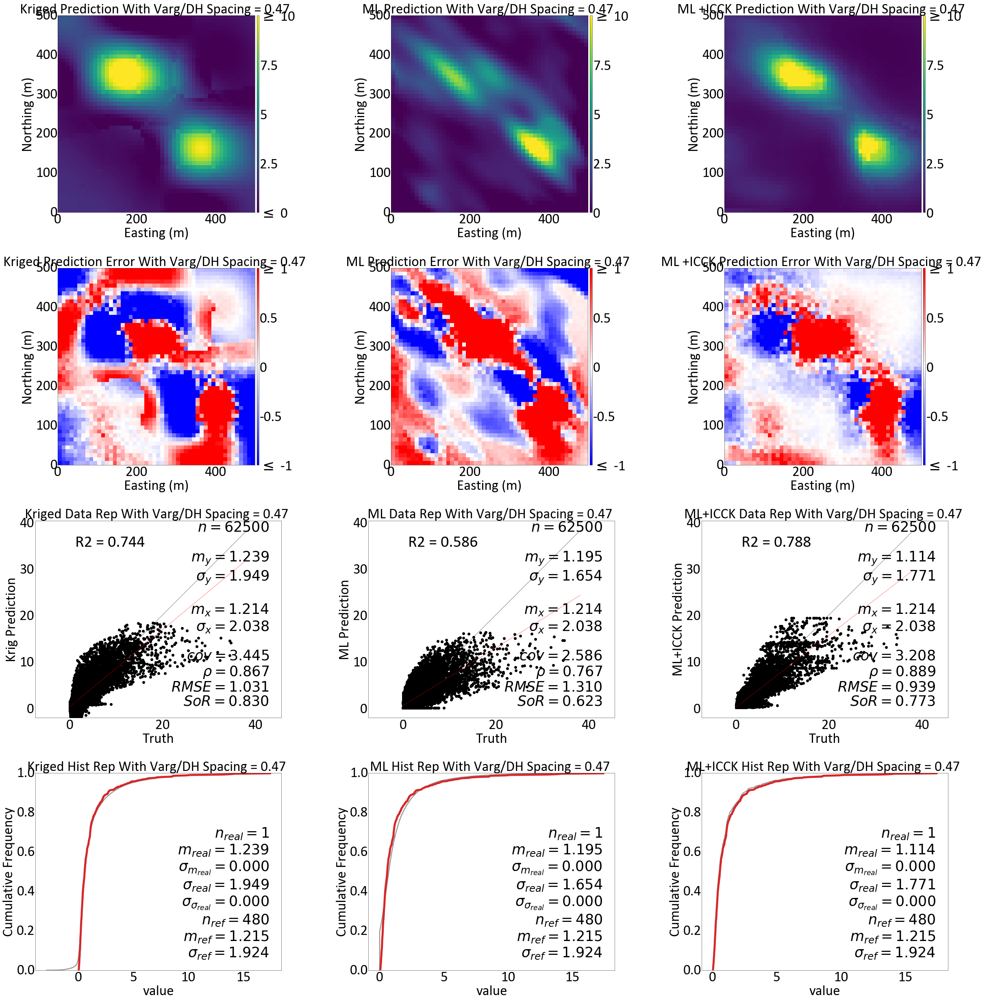

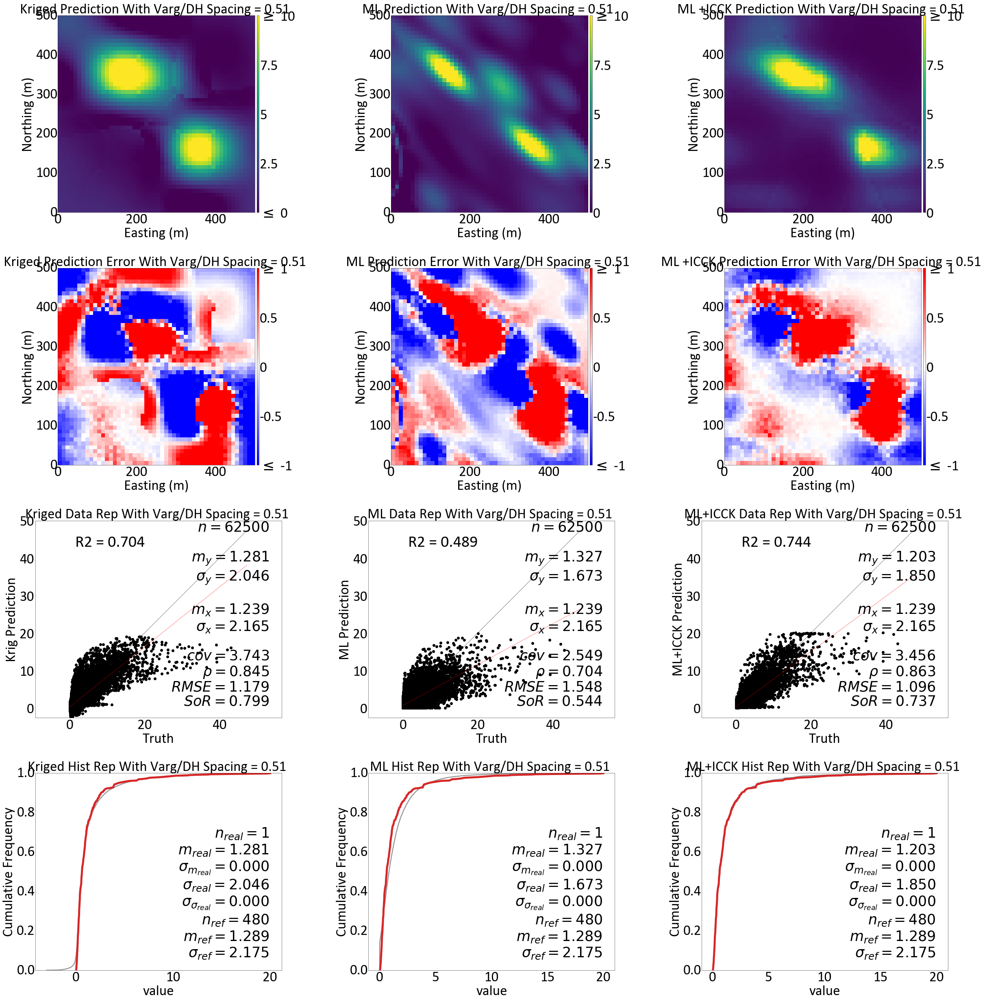

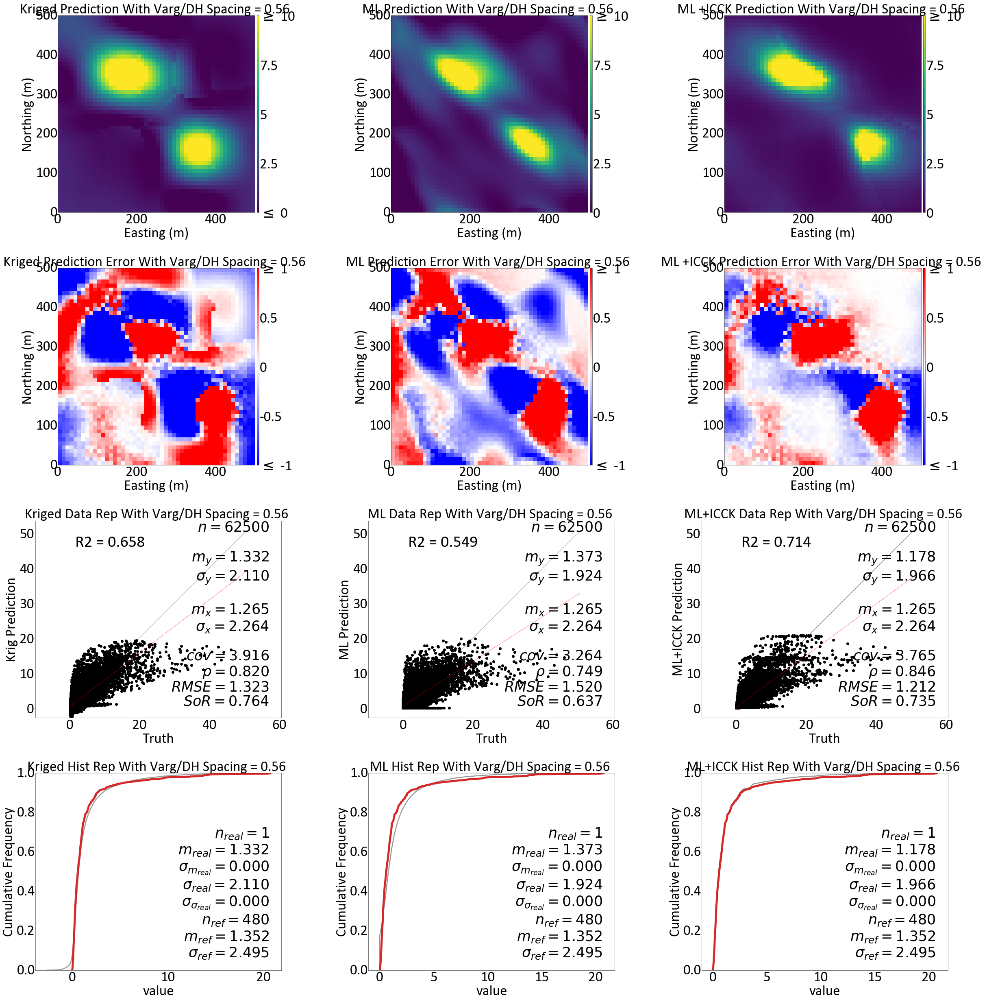

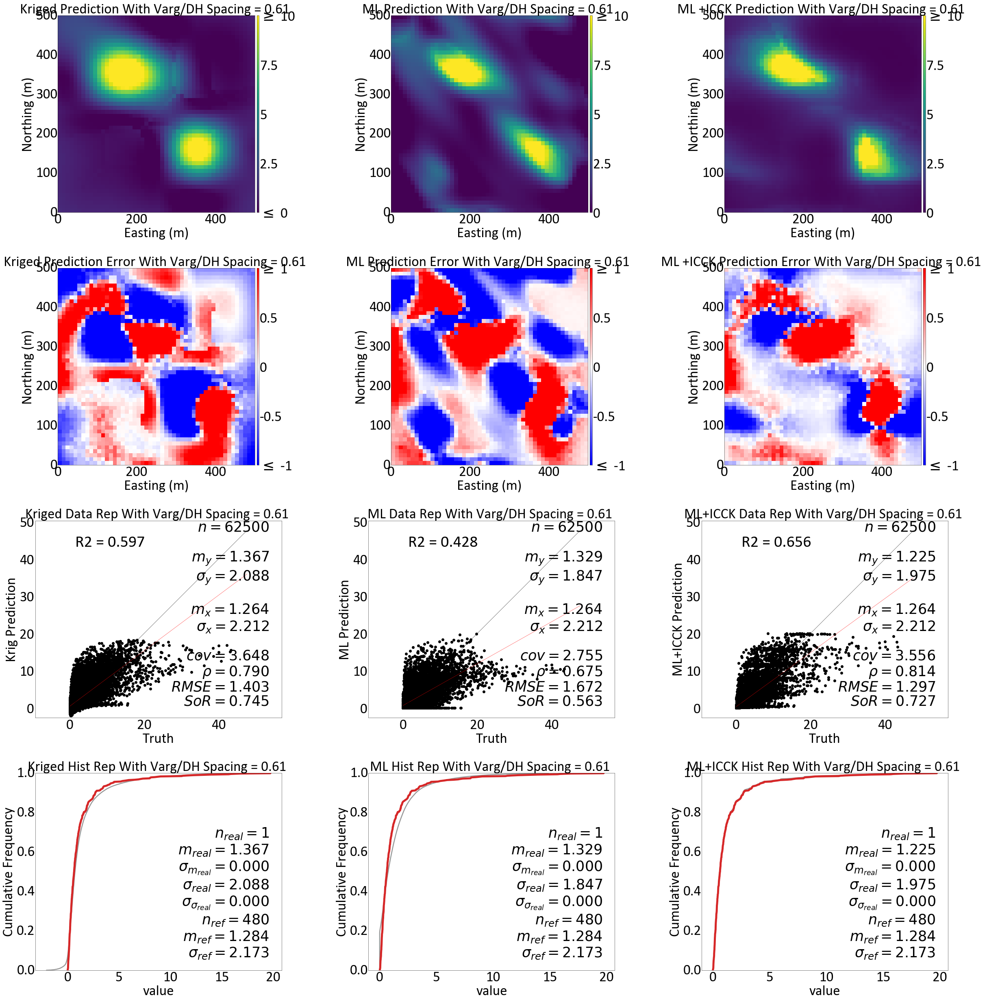

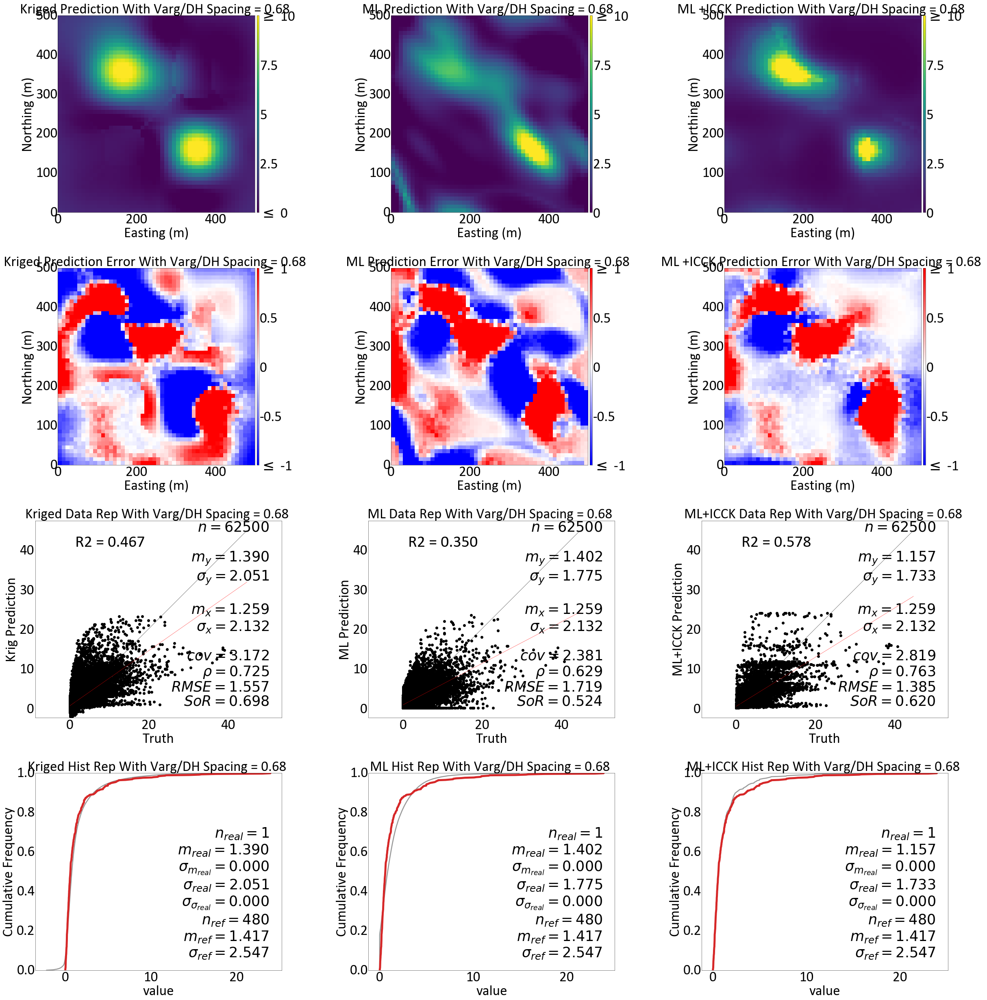

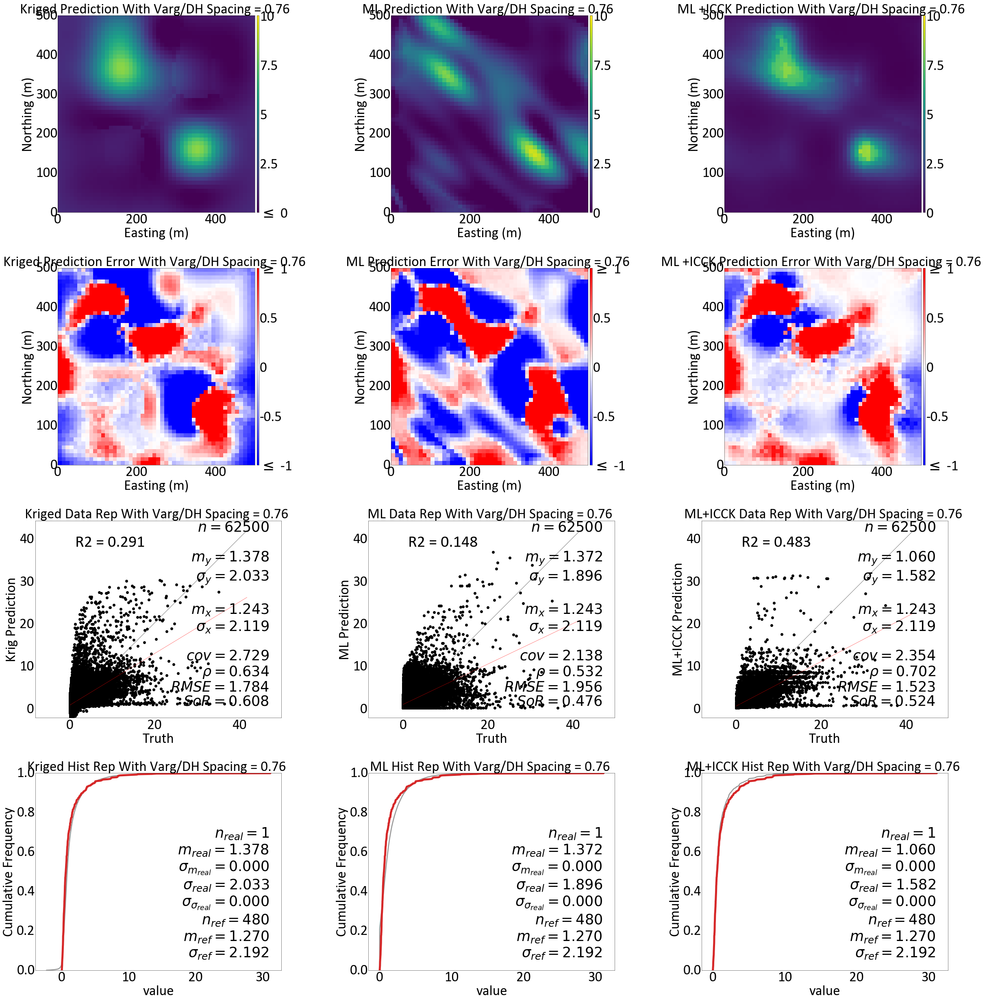

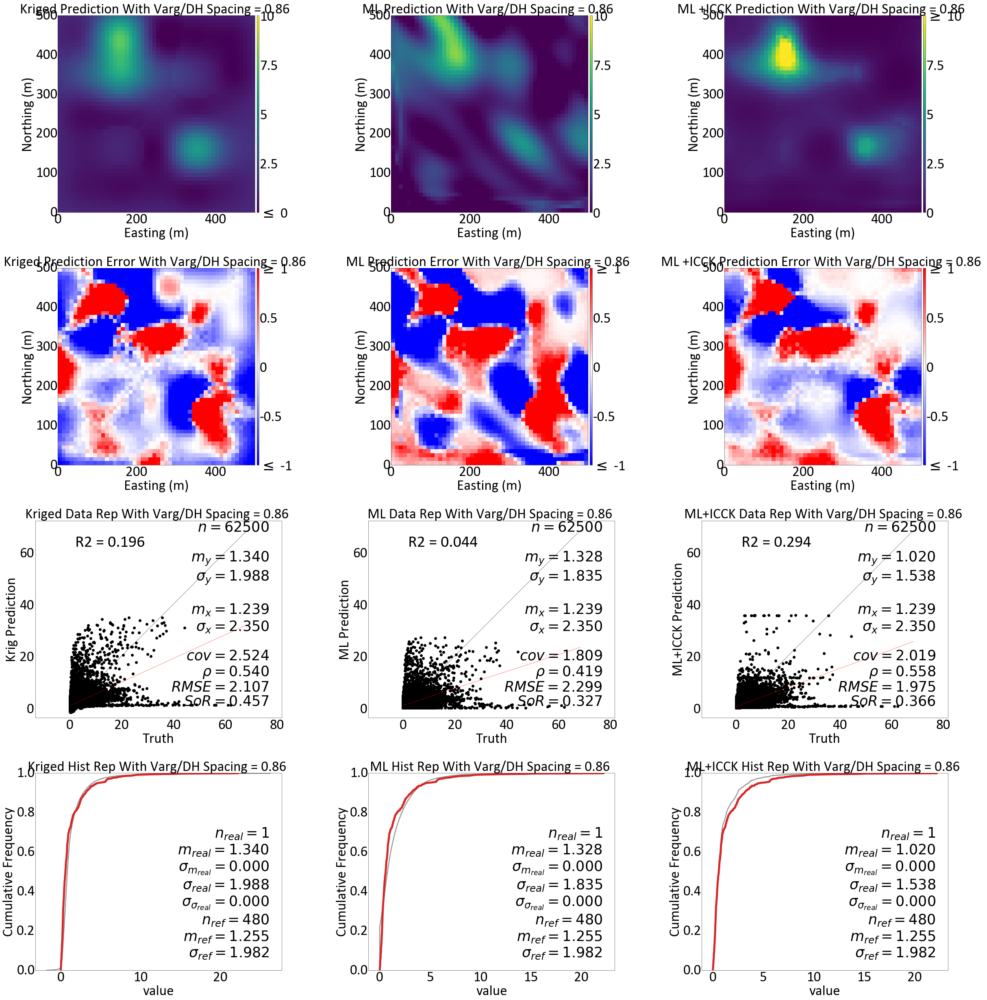

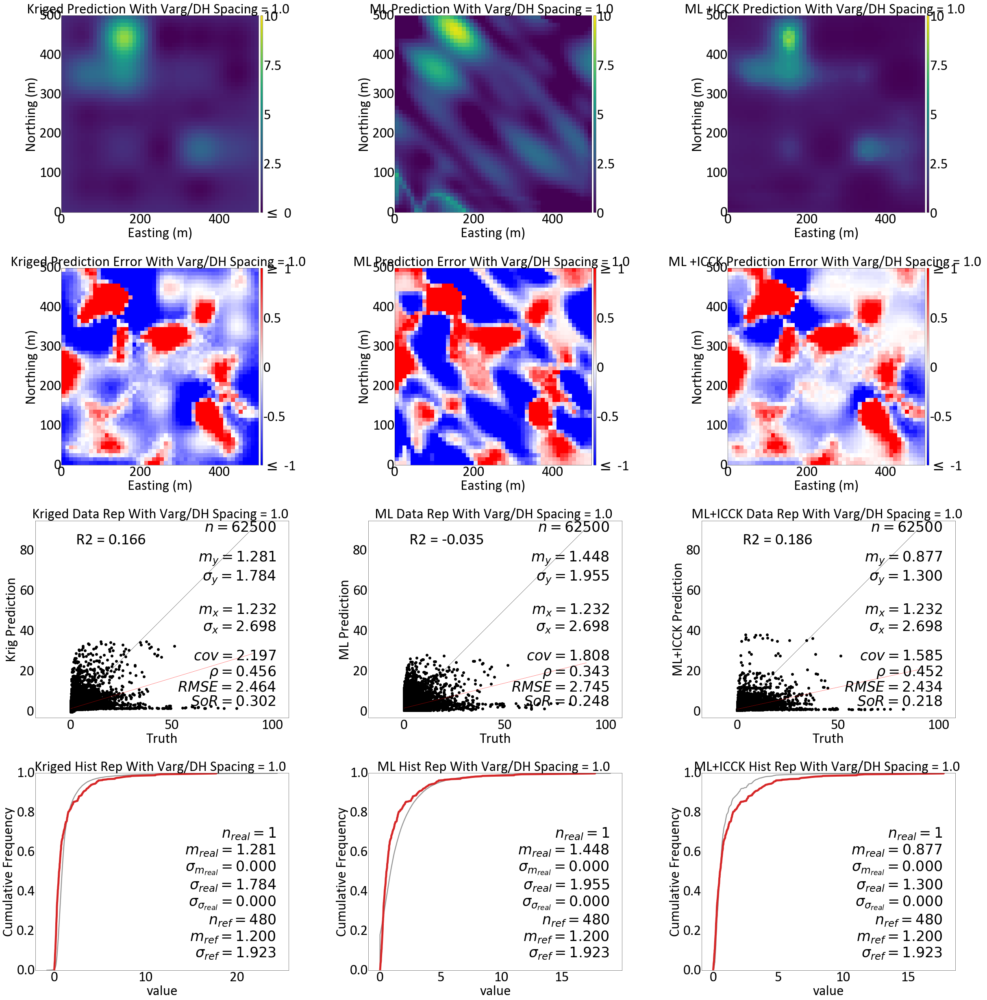

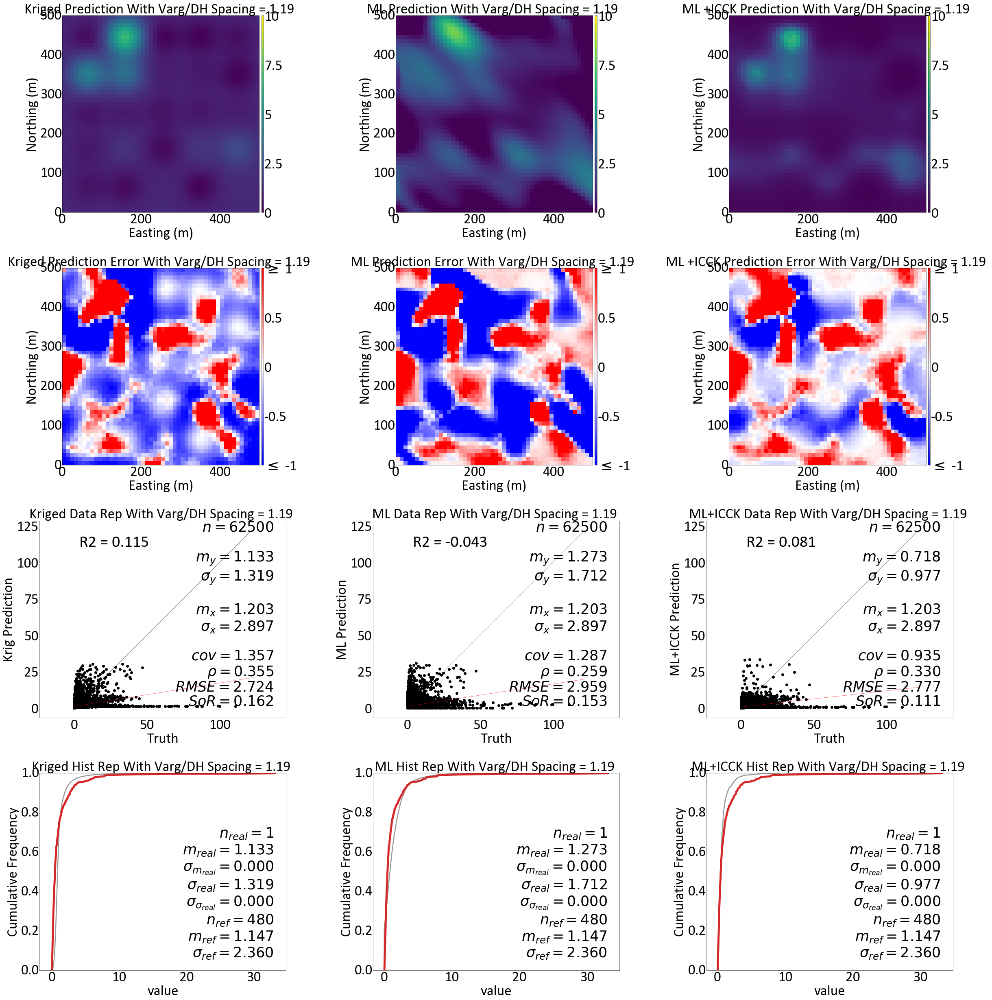

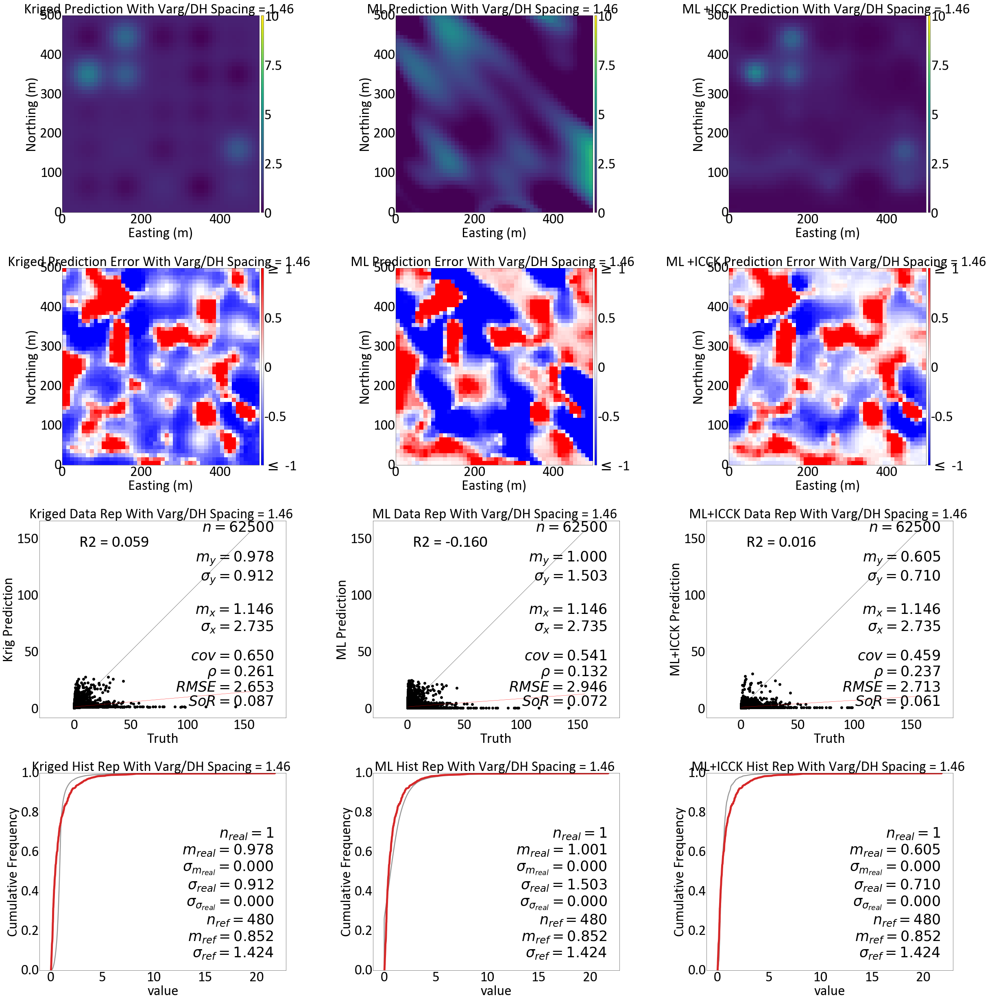

In [45]:
r2_krg_full = []
r2_ML_full = []
r2_ML_icck_full = []
rmse_krg_full = []
rmse_ML_full = []
rmse_ML_icck_full = []
mean_krig = [] 
mean_ML = []
mean_ML_icck = []
sigma_krig= []
sigma_ML= []
sigma_ML_icck= []
mean_real = []
sigma_real = []
sliceno = 20
vlim = (0,10)
elim = (-1,1)

gs.set_style('pt35')
for fold in range(1,11):
    sim_krig = gs.DataFile('./predictions/kt3dn_{}.out'.format(fold))
    sim_ml = gs.DataFile('./predictions/ensemble_{}.dat'.format(fold))
    sim_ml.data['0'][sim_ml.data['0'] <= 0] = 0
    sim_ml_icck = gs.DataFile('./backtr/backtr_UDDH_{}.out'.format(fold))
    sim_ml_icck.data['Back Transform'][sim_ml_icck.data['Back Transform'] <= 0] = 0
    truth = gs.DataFile('logn/logn_{}.out'.format(fold),griddef=griddef)
    f, axes = plt.subplots(4, 3, figsize=(35, 35)) 
    t_max_val = np.max(truth.data['value'].values)
    t_max_val = t_max_val + t_max_val *0.1 
    dataflpoints = gs.DataFile(flname='./declus/declus_{}.out'.format(fold), x='X',y='Y',z='Z', griddef = griddef,
                           readfl=True)  
    std = 95/(200 - (fold-1)*15)
    std = float("{0:.2f}".format(std))
    gs.pixelplt(sim_krig.data['Estimate'],griddef=griddef,ax=axes[0,0] ,sliceno = sliceno,
                title = 'Kriged Prediction With Varg/DH Spacing = {} '.format(std),vlim=vlim)
    gs.pixelplt(sim_ml.data['0'],griddef=griddef,ax=axes[0,1] ,sliceno = sliceno,
                title = 'ML Prediction With Varg/DH Spacing = {} '.format(std),vlim=vlim)
    gs.pixelplt(sim_ml_icck.data['Back Transform'],griddef=griddef,ax=axes[0,2] ,sliceno = sliceno,
                title = 'ML +ICCK Prediction With Varg/DH Spacing = {} '.format(std),vlim=vlim)
    gs.pixelplt((truth.data['value']-sim_krig.data['Estimate']),griddef=griddef,ax=axes[1,0] ,sliceno = sliceno,
                title = 'Kriged Prediction Error With Varg/DH Spacing = {} '.format(std),vlim=elim,cmap = 'bwr')
    gs.pixelplt((truth.data['value']-sim_ml.data['0']),griddef=griddef,ax=axes[1,1] ,sliceno = sliceno,
                title = 'ML Prediction Error With Varg/DH Spacing = {} '.format(std),vlim=elim,cmap = 'bwr')
    gs.pixelplt((truth.data['value']-sim_ml_icck.data['Back Transform']),griddef=griddef,ax=axes[1,2] ,sliceno = sliceno,
                title = 'ML +ICCK Prediction Error With Varg/DH Spacing = {} '.format(std),vlim=elim,cmap = 'bwr')
    gs.scatxval(truth.data['value'],sim_krig.data['Estimate'],griddef=griddef,ax=axes[2,0] ,
                title = 'Kriged Data Rep With Varg/DH Spacing = {} '.format(std),vlim=(0,t_max_val),
               xlabel = 'Truth', ylabel='Krig Prediction')
    axes[2,0].text(t_max_val-t_max_val*.97,t_max_val-t_max_val*0.09,'R2 = {0:.3f}'.format(r2_score(truth.data['value'],sim_krig.data['Estimate'].fillna(value = 2.7))),size=40)
    gs.scatxval(truth.data['value'],sim_ml.data['0'],griddef=griddef,ax=axes[2,1] ,
                title = 'ML Data Rep With Varg/DH Spacing = {} '.format(std),vlim=(0,t_max_val),
               xlabel = 'Truth', ylabel='ML Prediction')
    axes[2,1].text(t_max_val-t_max_val*.97,t_max_val-t_max_val*0.09,'R2 = {0:.3f}'.format(r2_score(truth.data['value'],sim_ml.data['0'])),size=40)
    gs.scatxval(truth.data['value'],sim_ml_icck.data['Back Transform'],griddef=griddef,ax=axes[2,2] ,
                title = 'ML+ICCK Data Rep With Varg/DH Spacing = {} '.format(std),vlim=(0,t_max_val),
               xlabel = 'Truth', ylabel='ML+ICCK Prediction')
    axes[2,2].text(t_max_val-t_max_val*.97,t_max_val-t_max_val*0.09,'R2 = {0:.3f}'.format(r2_score(truth.data['value'],sim_ml_icck.data['Back Transform'])),size=40)
    gs.histpltsim(sim_krig.data['Estimate'],dataflpoints.data['value'],refwt = dataflpoints.data['Declustering Weight']
                  ,griddef=griddef,ax=axes[3,0] ,lw=5,
                title = 'Kriged Hist Rep With Varg/DH Spacing = {} '.format(std), nreal = 1 , )
    gs.histpltsim(sim_ml.data['0'],dataflpoints.data['value'],refwt = dataflpoints.data['Declustering Weight']
                  ,griddef=griddef,ax=axes[3,1] ,lw=5,
                title = 'ML Hist Rep With Varg/DH Spacing = {} '.format(std), nreal = 1)
    gs.histpltsim(sim_ml_icck.data['Back Transform'],dataflpoints.data['value'],refwt = dataflpoints.data['Declustering Weight']
                  ,griddef=griddef,ax=axes[3,2] ,lw=5,
                title = 'ML+ICCK Hist Rep With Varg/DH Spacing = {} '.format(std), nreal = 1)
    
       
    r2_krg_full.append(r2_score(truth.data['value'],sim_krig.data['Estimate']))
    r2_ML_full.append(r2_score(truth.data['value'],sim_ml.data['0']))
    r2_ML_icck_full.append(r2_score(truth.data['value'],sim_ml_icck.data['Back Transform']))
    rmse_krg_full.append(np.sqrt(mean_squared_error(truth.data['value'],sim_krig.data['Estimate'])))
    rmse_ML_full.append(np.sqrt(mean_squared_error(truth.data['value'],sim_ml.data['0'])))
    rmse_ML_icck_full.append(np.sqrt(mean_squared_error(truth.data['value'],sim_ml_icck.data['Back Transform'])))
    mean_krig.append(np.mean(sim_krig.data['Estimate']))
    mean_ML.append(np.mean(sim_ml.data['0']))
    mean_ML_icck.append(np.mean(sim_ml_icck.data['Back Transform']))
    sigma_krig.append(np.std(sim_krig.data['Estimate']))
    sigma_ML.append(np.std(sim_ml.data['0']))
    sigma_ML_icck.append(np.std(sim_ml_icck.data['Back Transform']))
    mean_real.append(np.mean(dataflpoints.data['value']))
    sigma_real.append(np.std(dataflpoints.data['value']))
    
    plt.tight_layout()  
    plt.savefig('C:/Users/Matt/Desktop/Thesis Work/Thesis/0-Figures/3-Chapter/Data_Number_{}_{}.png'.format(fold,plt_extent))

In [46]:
num_dhs = np.zeros(shape=(10))
k = 0
for i in range(1,11):
    num_dhs[k] = 95/(200 - (i-1)*15)
    k += 1
ML_Stats = np.vstack((num_dhs,sigma_real,mean_real,rmse_ML_full,r2_ML_full,sigma_ML,mean_ML)).T
ML_icck_Stats = np.vstack((num_dhs,sigma_real,mean_real,rmse_ML_icck_full,r2_ML_icck_full,sigma_ML_icck,mean_ML_icck)).T
Krig_Stats = np.vstack((num_dhs,sigma_real,mean_real,rmse_krg_full,r2_krg_full,sigma_krig,mean_krig)).T


In [47]:
ML_Stats

array([[ 0.475     ,  1.92430614,  1.21495312,  1.31049718,  0.586421  ,
         1.65390835,  1.19480067],
       [ 0.51351351,  2.31992662,  1.32315687,  1.54806027,  0.4886668 ,
         1.67338193,  1.32726593],
       [ 0.55882353,  2.58463791,  1.37355896,  1.51995998,  0.54920811,
         1.92379687,  1.37308562],
       [ 0.61290323,  2.3382067 ,  1.32301   ,  1.67235912,  0.42842541,
         1.8466975 ,  1.32919002],
       [ 0.67857143,  2.72261852,  1.49082125,  1.71854492,  0.35024928,
         1.77464419,  1.40198794],
       [ 0.76      ,  2.30512447,  1.28736146,  1.95597971,  0.14790674,
         1.89595202,  1.37169338],
       [ 0.86363636,  2.0493346 ,  1.26234521,  2.29863196,  0.04355731,
         1.83537159,  1.32757829],
       [ 1.        ,  1.93683056,  1.21759084,  2.74465541, -0.03457989,
         1.95490069,  1.44825536],
       [ 1.1875    ,  2.53978399,  1.15397146,  2.95870047, -0.0431459 ,
         1.71186032,  1.27265523],
       [ 1.46153846,  1.4237

In [48]:
print(r2_ML_icck_full)
print(rmse_ML_icck_full)

[0.7878471757032008, 0.7438496366647518, 0.7135850709399592, 0.6561206632898051, 0.5778146439475027, 0.4833116918170799, 0.2939711855352416, 0.18614684309659713, 0.08089598480602678, 0.016303116633129555]
[0.9386015357716965, 1.095679050170069, 1.211551650166188, 1.2971677034115094, 1.3852848489604497, 1.5231234293961735, 1.9749275969943048, 2.434326549459432, 2.7772233244077853, 2.712742502807578]


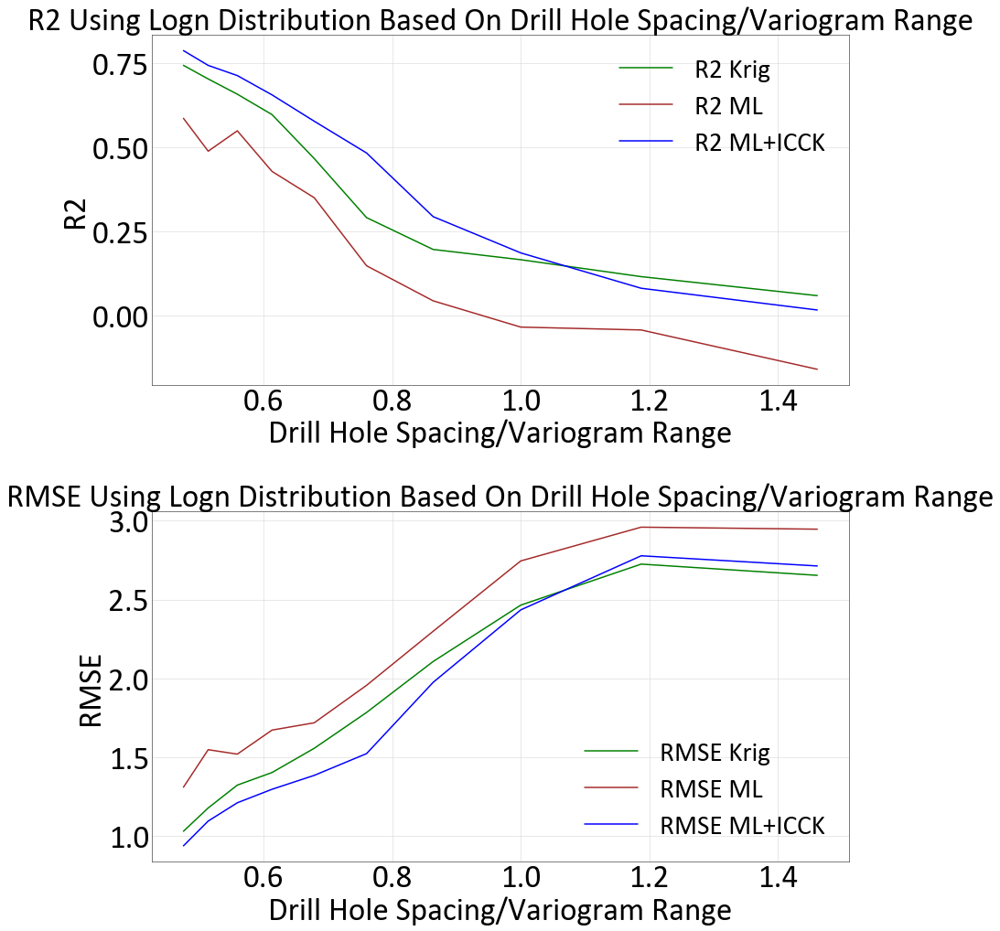

In [49]:
f, (ax1,ax2) = plt.subplots(2, 1,figsize=(15, 15))
ax1.plot(num_dhs, np.asarray(r2_krg_full),color="green", label ='R2 Krig')
ax1.plot(num_dhs, np.asarray(r2_ML_full),color="brown", label ='R2 ML')
ax1.plot(num_dhs, np.asarray(r2_ML_icck_full),color="blue", label ='R2 ML+ICCK')
ax1.set_xlabel('Drill Hole Spacing/Variogram Range')
ax1.grid(True)
ax1.set_title('R2 Using Logn Distribution Based On Drill Hole Spacing/Variogram Range')
ax1.set_ylabel('R2', color='Black')
ax1.tick_params(axis='y', labelcolor='Black')
ax1.legend(loc='best',fontsize = 'small')
#ax1.invert_xaxis()
#ax1.set_ylim([0.4,1])

ax2.plot(num_dhs, np.asarray(rmse_krg_full),'-',color="green",label ='RMSE Krig')
ax2.plot(num_dhs, np.asarray(rmse_ML_full),'-',color="brown",label ='RMSE ML')
ax2.plot(num_dhs, np.asarray(rmse_ML_icck_full),'-',color="blue",label ='RMSE ML+ICCK')
ax2.set_title('RMSE Using Logn Distribution Based On Drill Hole Spacing/Variogram Range')
ax2.grid(True)
ax2.set_xlabel('Drill Hole Spacing/Variogram Range')
ax2.set_ylabel('RMSE', color='Black')
ax2.tick_params(axis='y', labelcolor='Black')
ax2.legend(loc='best',fontsize = 'small')
#ax2.invert_xaxis()
#ax2.set_ylim([0,0.8])
plt.tight_layout()  
plt.savefig('C:/Users/Matt/Desktop/Thesis Work/Thesis/0-Figures/3-Chapter/Sum_graph_{}.png'.format(plt_extent))

In [50]:
ml_sim = np.asarray(ML_Stats).flatten().reshape(len(np.asarray(ML_Stats).flatten()),1)
icck_ml_sim = np.asarray(ML_icck_Stats).flatten().reshape(len(np.asarray(ML_icck_Stats).flatten()),1)
krig_sim = np.asarray(Krig_Stats).flatten().reshape(len(np.asarray(Krig_Stats).flatten()),1)

In [51]:
np.savetxt('ML_stats.csv', ML_Stats, delimiter = ',')
np.savetxt('Krig_stats.csv', Krig_Stats, delimiter = ',')
np.savetxt('ML_icck_stats.csv', ML_icck_Stats, delimiter = ',')

In [72]:
# samplefl = gs.DataFile('datasamplefl.out')
# gs.set_style('pt25')
# xlim=(-0.05,2)
# f, axes = plt.subplots(3, 1, figsize=(25, 20))
# gs.histpltsim(krig_sim,samplefl.data['value'],griddef=griddef,nreal=20,ax = axes[0],
#               title = 'CDF Sensitivity Study Krig ', xlim=xlim)
# gs.histpltsim(ml_sim,samplefl.data['value'],griddef=griddef,nreal=20,ax = axes[1],
#               title = 'CDF Sensitivity Study ML ', xlim=xlim)
# gs.histpltsim(icck_ml_sim,samplefl.data['value'],griddef=griddef,nreal=20,ax = axes[2],
#               title = 'CDF Sensitivity Study ML+OICCK ', xlim=xlim)
# plt.tight_layout()    
# plt.savefig('C:/Users/Matt/Desktop/Thesis Work/Thesis/0-Figures/3-Chapter/Dist_study_{}.png'.format(plt_extent))

In [ ]:
# varsim = gs.Program('varsim')
# varsimparstr = """                 Parameters for VarSim
#                  *********************

# START OF PARAMETERS:
# ../data/lithology.dat        -file with lithology information
# 0   7                        -   lithology column (0=not used), code
# {datafl}             -file with data
# 1   {col}                -   number of variables, column numbers
# -1.0e21     1.0e21    -   trimming limits
# ./vargs/varsim_reals_{p_type}_{fold}.out      -output file for variograms of realizations
# ./vargs/varsim_avg_{p_type}_{fold}.out        -output file for average variogram
# {griddef}
# 1                  -number of realizations
# 3  100                 -number of directions, number of lags
# 1  0  0              -ixd(1),iyd(1),izd(1)
# 0  1  0              -ixd(2),iyd(2),izd(2)
# 0  0  1              -ixd(2),iyd(2),izd(2)
# 0                     -standardize sill? (0=no, 1=yes)
# 1                     -number of variograms
# 1   1   1             -tail variable, head variable, variogram type
# """

In [ ]:
# gs.set_style('pt25')
# ylim = (-.2,1.2)
# f, axes = plt.subplots(3, 2, figsize=(25, 20))
# for fold in range(1,2):
#     varmodelfl = gs.DataFile('./vargs/varmodel_{}.out'.format(fold))
#     varcalcfl = gs.DataFile('./vargs/varcalc_{}.out'.format(fold))
#     for p_type in list(['Krig','ML','OICCK+ML']):
#         if p_type == 'Krig':
#             predfile = gs.DataFile('./predictions/kt3dn_{}.out'.format(fold),griddef=griddef)
#             col = 1
#         if p_type == 'OICCK+ML':
#             predfile = gs.DataFile('./backtr/backtr_UDDH_{}.out'.format(fold),griddef=griddef)
#             col = 3
#         else:
#             predfile = gs.DataFile('./predictions/ensemble_{}.dat'.format(fold),griddef=griddef)
#             col = 1
            
#         varsim.run(varsimparstr.format(datafl = predfile,
#                                        p_type = p_type,
#                                        fold = fold,
#                                        col = col,
#                                        griddef = griddef),quiet=True,liveoutput=False)
#         varsimfl =  gs.DataFile('./vargs/varsim_reals_{}_{}.out'.format(p_type,fold))
    

#         if p_type == 'Krig':
#             ax = gs.varplt(varsimfl,experimental=False,color ='C0' ,index = 1,ax =axes[0,0],ms = 10, title = 'Varsim est type {} fold {} Major Direction'.format(p_type,fold), label= 'Varg Rep',ylim=ylim)
#             ax = gs.varplt(varcalcfl.data,index = 1,ax =ax,color ='C1' ,ms = 10, title = 'Varsim est type {} fold {} Major Direction'.format(p_type,fold),label= 'Experimental',ylim=ylim)
#             ax = gs.varplt(varmodelfl,experimental=False,color ='C1' ,index = 1,ax =ax, title = 'Varsim est type {} fold {} Major Direction'.format(p_type,fold),label= 'Model',ylim=ylim)
#             ax.legend(loc=7,prop={'size': 20})
#             ax.set_xlim(0, 400)
            
#             ax2 = gs.varplt(varsimfl,experimental=False,color ='C0' ,ms = 10,index = 2,ax =axes[0,1], title = 'Varsim est type {} fold {} Minor Direction'.format(p_type,fold), label= 'Varg Rep',ylim=ylim)
#             ax2 = gs.varplt(varcalcfl.data,index = 2,ax =ax2,color ='C1' ,ms = 10, title = 'Varsim est type {} fold {} Minor Direction'.format(p_type,fold),label= 'Experimental',ylim=ylim)
#             ax2 = gs.varplt(varmodelfl,experimental=False,color ='C1' ,ms = 10,index = 2,ax =ax2, title = 'Varsim est type {} fold {} Minor Direction'.format(p_type,fold),label= 'Model',ylim=ylim)
#             ax2.legend(loc=7,prop={'size': 20})
#             ax2.set_xlim(0, 400)
            
#         if p_type == 'ML':
#             ax4 = gs.varplt(varsimfl,experimental=False,color ='C0' ,index = 1,ax = axes[1,0],ms = 10, title = 'Varsim est type {} fold {} Major Direction'.format(p_type,fold), label= 'Varg Rep',ylim=ylim)
#             ax4.legend(loc=7,prop={'size': 20})
#             ax4.set_xlim(0, 400)
#             ax5 = gs.varplt(varsimfl,experimental=False,color ='C0' ,ms = 10,index = 2,ax = axes[1,1], title = 'Varsim est type {} fold {} Minor Direction'.format(p_type,fold), label= 'Varg Rep',ylim=ylim)
#             ax5.set_xlim(0, 400)

#         if p_type == 'OICCK+ML':
#             ax6 = gs.varplt(varsimfl,experimental=False,color ='C0' ,index = 1,ax = axes[2,0],ms = 10, title = 'Varsim est type {} fold {} Major Direction'.format(p_type,fold), label= 'Varg Rep',ylim=ylim)
#             #ax = gs.varplt(varcalcfl.data,index = 1,ax =ax,color ='C1' ,ms = 10, title = 'Varsim est type {} fold {} Major Direction'.format(p_type,fold),label= 'Experimental')
#             #ax = gs.varplt(varmodelfl,experimental=False,color ='C1' ,index = 1,ax =ax, title = 'Varsim est type {} fold {} Major Direction'.format(p_type,fold),label= 'Model')
#             ax6.legend(loc=7,prop={'size': 20})
#             ax6.set_xlim(0, 400)
#             ax7 = gs.varplt(varsimfl,experimental=False,color ='C0' ,ms = 10,index = 2,ax = axes[2,1], title = 'Varsim est type {} fold {} Minor Direction'.format(p_type,fold), label= 'Varg Rep',ylim=ylim)
#             #ax2 = gs.varplt(varcalcfl.data,index = 2,ax =ax2,color ='C1' ,ms = 10, title = 'Varsim est type {} fold {} Minor Direction'.format(p_type,fold),label= 'Experimental')
#             #ax2 = gs.varplt(varmodelfl,experimental=False,color ='C1' ,ms = 10,index = 2,ax =ax2, title = 'Varsim est type {} fold {} Minor Direction'.format(p_type,fold),label= 'Model')
#             ax7.legend(loc=7,prop={'size': 20})
#             ax7.set_xlim(0, 400)


#     plt.tight_layout()    
#     plt.savefig('C:/Users/Matt/Desktop/Thesis Work/Thesis/0-Figures/3-Chapter/varg_rep_ERBFN_{}_{}.png'.format(plt_extent,fold))
#     plt.show()
